In [1]:
import pandas as pd
import numpy as np
from pathlib import Path

In [2]:
# Paths to deduped parquet files
base_dir = Path("../data/Postings")

files = [
    base_dir / "SG-2022-WITHOUT-REPOSTS-W60D.parquet",
    base_dir / "SG-2023-WITHOUT-REPOSTS-W60D.parquet",
    base_dir / "SG-2024-WITHOUT-REPOSTS-W60D.parquet",
]

# Read and concatenate
data_df = pd.concat(
    [pd.read_parquet(f) for f in files],
    ignore_index=True
)

print("Combined data_df shape:", data_df.shape)
print("Years covered:", sorted(data_df["post_date"].dt.year.unique()))

Combined data_df shape: (1492675, 41)
Years covered: [2022, 2023, 2024]


In [3]:
recruitment_industries = [
    'Recruitment and Staffing Services',
    'Employment and Staffing Services',
    'Employment and Recruitment Services',
    'Human Resources and Recruitment Services',
    'Online Employment Platforms',
    'Human Resources and Workforce Solutions',
    'Business Process Outsourcing Services'
]

In [ ]:
d_unique_filtered = data_df[~data_df['rics_k400'].isin(recruitment_industries)].copy()

# 1. LLM Inference

In [12]:
import re

genai_keywords = [
    "copilot", "claude", "gemini", "large language model", "llm",
    "generative ai", "chatgpt", "gen ai", "gpt", "langchain", "rag",
    "retrieval-augmented generation", "vector embedding", "vector database",
    "transformer", "prompt engineering", "prompt design", "llamaindex",
    "pinecone", "weaviate", "milvus", "openai api", "anthropic",
    "azure openai", "vertex ai", "huggingface", "retrievalqa"
]

# Add word boundaries to avoid substring contamination
pattern = re.compile(
    r"\b(" + "|".join(re.escape(k) for k in genai_keywords) + r")\b",
    re.IGNORECASE
)

def build_flagged_set(
    d_unique: pd.DataFrame,
    title_col="jobtitle",
    desc_col="description",
    firm_col="company"
):
    d = d_unique.copy()

    d["title_text"] = d[title_col].fillna("").astype(str)
    d["desc_text"] = d[desc_col].fillna("").astype(str)

    # Extract matches separately
    d["title_matches"] = d["title_text"].apply(lambda x: pattern.findall(x))
    d["desc_matches"] = d["desc_text"].apply(lambda x: pattern.findall(x))

    # Combine matches
    d["matched_keywords"] = d.apply(
        lambda row: list(set(row["title_matches"] + row["desc_matches"])),
        axis=1
    )

    # Flag if any match exists
    d["keyword_flag"] = d["matched_keywords"].apply(lambda x: 1 if len(x) > 0 else 0)

    flagged = d[d["keyword_flag"] == 1].copy()

    print("Total flagged:", len(flagged))
    print("Example matched keywords distribution:")
    print(flagged["matched_keywords"].explode().value_counts().head(15))

    return flagged

In [14]:
len(d_unique_filtered)

997690

In [13]:
flagged = build_flagged_set(d_unique_filtered)

Total flagged: 4927
Example matched keywords distribution:
matched_keywords
LLM                     1559
Generative AI           1027
generative AI            863
transformer              458
ChatGPT                  424
Transformer              367
RAG                      350
GPT                      338
Gen AI                   310
prompt engineering       267
Large Language Model     145
large language model     139
Gemini                   135
LangChain                132
Claude                   119
Name: count, dtype: int64


In [15]:
flagged.to_csv("../data/Firm Level/flagged_genai_jobs.csv", index=False)

In [18]:
import os
import json
import time
import pandas as pd
import numpy as np
from openai import OpenAI

client = OpenAI()

# -----------------------------
# 1) LLM prompt + classifier (TITLE + DESCRIPTION + REASON)
# -----------------------------
SYSTEM_PROMPT = """
You are a classifier for job postings. Output ONLY compact JSON.

Role type definitions:
- integrator: builds/operates LLM systems (RAG, embeddings/vector DB, agents,
  LangChain/LlamaIndex, fine-tune/adapters, serving/inference, eval/guardrails,
  API integration).
- user: mainly uses LLM tools (ChatGPT, Gemini, Copilot, etc.) without building systems.
- both: does both integrator and user activities.
- none: neither.

Exclusions:
- Not integrator if only foundation-model research,
- Generic AI/ML roles,
- Developer roles at AI labs (e.g., OpenAI, DeepMind),
- Labeling/annotation roles.

Department (choose one):
- Technology
- Operations
- Marketing
- HR

Rules:
- If both integrator + user → role_type="both"
- Acronyms like "RAG" imply LLM context
- Prefer integrator=1 only when clear system-building signals appear
- JSON only; no prose

Output format:
{
  "integrator": 0|1,
  "user": 0|1,
  "role_type": "integrator"|"user"|"both"|"none",
  "department": "Technology"|"Operations"|"Marketing"|"HR",
  "confidence": 0.0-1.0,
  "reason": "short explanation"
}
"""


In [ ]:
def classify_posting_with_gpt(
    title: str,
    description: str,
    model: str = "gpt-4o",
    max_retries: int = 5
):
    t = "" if title is None else str(title)
    d = "" if description is None else str(description)

    user_content = f"Job Title:\n{t}\n\nJob Description:\n{d}"

    for attempt in range(max_retries):
        try:
            resp = client.chat.completions.create(
                model=model,
                messages=[
                    {"role": "system", "content": SYSTEM_PROMPT},
                    {"role": "user", "content": user_content}
                ],
                temperature=0,
                response_format={"type": "json_object"},
            )

            out = json.loads(resp.choices[0].message.content)
            return out

        except Exception as e:
            wait = min(2 ** attempt, 30)
            print(f"[WARN] GPT call failed (attempt {attempt+1}/{max_retries}): {e}")
            time.sleep(wait)

    return {
        "integrator": 0,
        "user": 0,
        "role_type": "none",
        "department": "Operations",
        "confidence": 0.0,
        "reason": "API failure"
    }

# -----------------------------
# 2) Test on sample (UPDATED: prints reason)
# -----------------------------
def test_gpt_on_sample(
    flagged_df: pd.DataFrame,
    n: int = 10,
    title_col: str = "jobtitle",
    firm_col: str = "company",
    date_col: str = "post_date",
    desc_col: str = "description",
    id_col: str = "job_id",
    model: str = "gpt-4o"
):
    sample = flagged_df.head(n).copy()

    print(f"\nTesting GPT on first {len(sample)} flagged postings...\n")
    print("=" * 80)

    for _, row in sample.iterrows():
        title = row.get(title_col, "N/A")
        description = row.get(desc_col, "")
        job_id = row.get(id_col, "N/A")
        company = row.get(firm_col, "N/A")
        post_date = row.get(date_col, "N/A")

        print(f"\nCompany: {company}")
        print(f"Job ID: {job_id}")
        print(f"Job Title: {title}")
        print(f"Post Date: {post_date}")
        print("-" * 80)
        print("Job Description:")
        print(description)
        print("-" * 80)

        out = classify_posting_with_gpt(title=title, description=description, model=model)

        print(f"GPT Classification (integrator): {out.get('integrator', 0)}")
        print(f"Role type: {out.get('role_type', 'N/A')}, User: {out.get('user', 0)}, Dept: {out.get('department', 'N/A')}, Conf: {out.get('confidence', 'N/A')}")
        print(f"Reason: {out['reason']}")
        print("=" * 80)

# Example:
# flagged = build_flagged_set(d_unique)
test_gpt_on_sample(flagged_df=flagged, n=10)


Testing GPT on first 10 flagged postings...


Company: Barghest Building Performance Pte Ltd.
Job ID: 14721160216
Job Title: central_engineer
Post Date: 2022-07-28 00:00:00
--------------------------------------------------------------------------------
Job Description:
Job Responsibilities
<br>. Drafting of panel layout, schematic and control drawing of starter and PLC panel.
<br>. Attend Factory Acceptance Test (FAT) of Starter and PLC panel.
<br>. Project testing and commissioning.
<br>. Attend to ad-hoc electrical issues at maintenance sites to troubleshoot/provide the findings report.
<br>. Contractor liaison, engagement/provide requirements.
<br><br>
Qualifications
<br>. Diploma in Electrical and/or Instrumentation & Control Engineering.
<br>. Past experiences in panel design, layout arrangement of starter panel and PLC panel.
<br>. Well versed in Singapore CP and Standards for panel design and eletrcial discipline.
<br>. Well versed with HVAC systems and knowledge on HVAC(ACMV)

In [ ]:
# -----------------------------
# 3) Run GPT on ALL flagged postings + print details + save + firm first-date list
# -----------------------------
def gpt_label_flagged_postings(
    flagged_df: pd.DataFrame,
    out_pred_csv: str = "flagged_postings_gpt_predictions.csv",
    out_firms_csv: str = "firms_ever_genai_integrator_first_date.csv",
    firm_col: str = "company",
    date_col: str = "post_date",
    title_col: str = "jobtitle",
    desc_col: str = "description",
    id_col: str = "job_id",
    model: str = "gpt-4o",
    sleep_s: float = 0.0,
    print_every: int = 1,   # set to 1 to print each posting like the sample; use 20/50 for less spam
):
    df = flagged_df.copy()

    # ensure required columns
    required = [firm_col, date_col, title_col, desc_col]
    missing = [c for c in required if c not in df.columns]
    if missing:
        raise ValueError(f"Missing required columns in flagged_df: {missing}")

    # parse dates (needed for first integrator date)
    df[date_col] = pd.to_datetime(df[date_col], errors="coerce")

    # keep only needed columns early
    keep_cols = [c for c in [id_col, firm_col, date_col, title_col, desc_col] if c in df.columns]
    df = df[keep_cols].copy()

    print(f"Flagged postings to classify: {len(df):,}")
    print("Running GPT classification on title + description...")
    print("=" * 80)

    preds = []
    reasons = []
    role_types = []
    users = []
    departments = []
    confidences = []

    for k, (_, row) in enumerate(df.iterrows(), start=1):
        title = row.get(title_col, "")
        description = row.get(desc_col, "")
        job_id = row.get(id_col, "N/A")
        company = row.get(firm_col, "N/A")
        post_date = row.get(date_col, "N/A")

        # Print like the sample (but controllable)
        if print_every and (k % print_every == 0):
            print(f"\nCompany: {company}")
            print(f"Job ID: {job_id}")
            print(f"Job Title: {title}")
            print(f"Post Date: {post_date}")
            print("-" * 80)
            print("Job Description:")
            print(description)
            print("-" * 80)

        out = classify_posting_with_gpt(
            title=title,
            description=description,
            model=model
        )

        integrator = int(out.get("integrator", 0))
        reason = str(out.get("reason", "")).strip()

        preds.append(integrator)
        reasons.append(reason)
        role_types.append(out.get("role_type", "none"))
        users.append(int(out.get("user", 0)))
        departments.append(out.get("department", "Operations"))
        confidences.append(float(out.get("confidence", 0.0)) if out.get("confidence", None) is not None else 0.0)

        if print_every and (k % print_every == 0):
            print(f"GPT Classification (integrator): {integrator}")
            print(f"Role type: {role_types[-1]}, User: {users[-1]}, Dept: {departments[-1]}, Conf: {confidences[-1]}")
            print(f"Reason: {reason}")
            print("=" * 80)

        if sleep_s > 0:
            time.sleep(sleep_s)

        if k % 50 == 0:
            print(f"  - Classified {k:,}/{len(df):,}")

    df["is_integrator_gpt"] = preds
    df["gpt_reason"] = reasons
    df["gpt_role_type"] = role_types
    df["gpt_user"] = users
    df["gpt_department"] = departments
    df["gpt_confidence"] = confidences

    # save posting-level predictions
    df.to_csv(out_pred_csv, index=False)
    print(f"\nSaved posting-level predictions -> {out_pred_csv}")

    # --------------------------------------------------
    # Firm-level list: ever integrator + FIRST date
    # --------------------------------------------------
    integrator_only = df[df["is_integrator_gpt"] == 1].copy()

    if integrator_only.empty:
        firms = pd.DataFrame(columns=[firm_col, "first_integrator_post_date", "n_integrator_postings"])
        firms.to_csv(out_firms_csv, index=False)
        print("No integrator postings found by GPT. Saved empty firm list.")
        return df, firms

    firms = (
        integrator_only
        .dropna(subset=[firm_col, date_col])
        .groupby(firm_col, as_index=False)
        .agg(
            first_integrator_post_date=(date_col, "min"),
            n_integrator_postings=("is_integrator_gpt", "sum"),
        )
        .sort_values("first_integrator_post_date")
    )

    firms.to_csv(out_firms_csv, index=False)
    print(f"Saved firm-level ever-integrator list -> {out_firms_csv}")

    # reporting
    n_unique_firms_flagged = df[firm_col].nunique(dropna=True)
    n_unique_firms_treated = firms[firm_col].nunique(dropna=True)
    pct_firms_treated_among_flagged = (n_unique_firms_treated / n_unique_firms_flagged) if n_unique_firms_flagged else np.nan

    print("----- Summary -----")
    print(f"Unique firms in flagged set: {n_unique_firms_flagged:,}")
    print(f"Unique firms ever integrator (GPT integrator=1): {n_unique_firms_treated:,} ({pct_firms_treated_among_flagged:.2%} of flagged firms)")
    print(f"Integrator postings (GPT integrator=1): {int(df['is_integrator_gpt'].sum()):,} / {len(df):,} ({df['is_integrator_gpt'].mean():.2%})")

    return df, firms

# -----------------------------
# Example run (prints every posting; set print_every=50 if too verbose)
# -----------------------------
postings_pred_df, firms_first_df = gpt_label_flagged_postings(
    flagged_df=flagged,
    out_pred_csv="flagged_postings_gpt_predictions.csv",
    out_firms_csv="firms_ever_genai_integrator_first_date.csv",
    firm_col="company",
    date_col="post_date",
    title_col="jobtitle",
    desc_col="description",
    id_col="job_id",
    model="gpt-4o",
    sleep_s=0.1,
    print_every=1
)

Flagged postings to classify: 4,927
Running GPT classification on title + description...

Company: Barghest Building Performance Pte Ltd.
Job ID: 14721160216
Job Title: central_engineer
Post Date: 2022-07-28 00:00:00
--------------------------------------------------------------------------------
Job Description:
Job Responsibilities
<br>. Drafting of panel layout, schematic and control drawing of starter and PLC panel.
<br>. Attend Factory Acceptance Test (FAT) of Starter and PLC panel.
<br>. Project testing and commissioning.
<br>. Attend to ad-hoc electrical issues at maintenance sites to troubleshoot/provide the findings report.
<br>. Contractor liaison, engagement/provide requirements.
<br><br>
Qualifications
<br>. Diploma in Electrical and/or Instrumentation & Control Engineering.
<br>. Past experiences in panel design, layout arrangement of starter panel and PLC panel.
<br>. Well versed in Singapore CP and Standards for panel design and eletrcial discipline.
<br>. Well versed wi

# 2. Panel Data Creation

Cleaning contained positions (where there are overlaps between senior and junior positions)

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import subprocess, sys

try:
    import pyreadstat
except ImportError:
    subprocess.check_call([sys.executable, "-m", "pip", "install", "pyreadstat", "-q"])
    import pyreadstat


def clean_contained_positions(positions: pd.DataFrame) -> pd.DataFrame:
    """
    Vectorised resolution of contained positions.

    A position j is "contained" within position i (the container) if:
      - same user_id and company_name
      - j.startdate >= i.startdate
      - j.enddate_filled <= i.enddate_filled
      - not the exact same record (i != j)

    Rules:
      container seniority <= contained seniority → promotion:
        shorten container enddate to contained startdate - 1 day
      container seniority >  contained seniority → data error:
        drop contained position

    This function uses a self-join on (user_id, company_name) to find
    all overlapping pairs at once, then applies edits in two vectorised
    passes — no Python loops over rows.
    """
    FAR_FUTURE = pd.Timestamp("2099-12-31")

    df = positions.copy().reset_index(drop=True)
    df["_end_filled"] = df["enddate"].fillna(FAR_FUTURE)
    df["_row"] = df.index  # stable row identifier

    print("  Step 1/4: Self-joining to find contained position pairs...")
    # Keep only columns needed for the join to minimise memory
    keys = df[["_row", "user_id", "company_name", "startdate", "_end_filled", "seniority"]]

    # Self-join on user_id x company_name
    pairs = keys.merge(
        keys.rename(columns={
            "_row": "_row_j",
            "startdate": "_start_j",
            "_end_filled": "_end_j",
            "seniority": "_sen_j",
        }),
        on=["user_id", "company_name"],
    )

    print("  Step 2/4: Filtering to containment relationships...")
    # j is contained within i (i is the container)
    contained = pairs[
        (pairs["_row"] != pairs["_row_j"])          # not the same record
        & (pairs["_start_j"] >= pairs["startdate"])  # j starts after/same as i
        & (pairs["_end_j"]   <= pairs["_end_filled"])# j ends before/same as i
    ].copy()

    n_pairs = len(contained)
    print(f"  Found {n_pairs:,} containment pairs across {df['user_id'].nunique():,} users")

    if n_pairs == 0:
        df = df.drop(columns=["_end_filled", "_row"])
        print("  No contained positions found — data returned unchanged.")
        return df

    print("  Step 3/4: Classifying pairs (promotion vs data error)...")
    # Promotion: container seniority <= contained seniority
    promotions = contained[contained["seniority"] <= contained["_sen_j"]].copy()
    # Data error: container seniority > contained seniority
    errors = contained[contained["seniority"] > contained["_sen_j"]].copy()

    # --- Drops: rows identified as data-error contained positions ---
    # A row may appear as "contained" in multiple pairs; drop it if ANY
    # of those pairs classifies it as an error
    drop_rows = set(errors["_row_j"].unique())

    # --- Enddate shortenings: for promotions, shorten container's enddate ---
    # If a container has multiple contained positions (multiple promotions),
    # take the EARLIEST contained startdate to shorten to (most conservative)
    if len(promotions) > 0:
        shorten = (
            promotions
            .groupby("_row")["_start_j"]
            .min()
            .reset_index()
            .rename(columns={"_start_j": "_new_end_raw"})
        )
        shorten["_new_end"] = shorten["_new_end_raw"] - pd.Timedelta(days=1)
    else:
        shorten = pd.DataFrame(columns=["_row", "_new_end"])

    # Remove from shorten any rows that are themselves being dropped
    shorten = shorten[~shorten["_row"].isin(drop_rows)]

    print("  Step 4/4: Applying edits...")
    # Apply enddate shortenings
    if len(shorten) > 0:
        shorten_idx = shorten.set_index("_row")["_new_end"]
        # Only shorten if the new end is actually earlier than current enddate
        current_ends = df.loc[shorten_idx.index, "enddate"]
        mask_shorter = shorten_idx < current_ends.fillna(FAR_FUTURE)
        rows_to_shorten = shorten_idx[mask_shorter].index
        df.loc[rows_to_shorten, "enddate"] = shorten_idx[mask_shorter].values

    # Drop data-error rows
    df = df[~df["_row"].isin(drop_rows)].copy()
    df = df.drop(columns=["_end_filled", "_row"])

    n_shortened = len(shorten[shorten["_row"].isin(rows_to_shorten)] if len(shorten) > 0 else [])
    n_dropped   = len(drop_rows)
    print(f"  Done — shortened: {n_shortened:,} | dropped: {n_dropped:,} | rows remaining: {len(df):,}")

    return df.reset_index(drop=True)


def load_and_clean_positions(
    positions_path: str,
    recruitment_industries: list,
) -> pd.DataFrame:
    """
    Load, parse, filter recruitment firms, and clean contained positions.
    Call this ONCE and pass the result to both stock and flow panel builders.
    """
    print("=" * 60)
    print("LOADING AND CLEANING POSITIONS (run once)")
    print("=" * 60)

    positions = pd.read_csv(positions_path)
    positions["startdate"] = pd.to_datetime(positions["startdate"], errors="coerce")
    positions["enddate"]   = pd.to_datetime(positions["enddate"],   errors="coerce")
    positions["company_name"] = positions["company_name"].astype(str).str.strip().str.lower()
    positions = positions.dropna(subset=["company_name", "startdate", "user_id"]).copy()

    print(f"Rows loaded: {len(positions):,}")
    print(f"startdate range: {positions['startdate'].min().date()} to {positions['startdate'].max().date()}")

    if "rics_k400" not in positions.columns:
        raise ValueError("Column 'rics_k400' not found.")
    if "seniority" not in positions.columns:
        raise ValueError("Column 'seniority' not found.")

    positions["seniority"] = pd.to_numeric(positions["seniority"], errors="coerce")
    positions = positions.dropna(subset=["seniority"]).copy()
    positions["seniority"] = positions["seniority"].astype(int)

    # Drop recruitment/HR intermediary firms
    bad_firms = positions.loc[
        positions["rics_k400"].isin(recruitment_industries), "company_name"
    ].unique()
    positions = positions[~positions["company_name"].isin(bad_firms)].copy()
    print(f"After dropping {len(bad_firms):,} recruitment firms: {len(positions):,} rows")

    # Clean contained positions — done once here, not repeated per panel
    print("\nResolving contained positions...")
    positions = clean_contained_positions(positions)

    print(f"\nClean positions ready: {len(positions):,} rows")
    return positions.reset_index(drop=True)

In [18]:
def load_treated_firms(
    post1_path: str,
    post2_path: str,
    treated_start: str,
    treated_end: str,
) -> set:
    """Load and identify ever-treated firms. Call once, reuse across panels."""
    post1 = pd.read_csv(post1_path)
    post2 = pd.read_csv(post2_path)
    postings = pd.concat([post1, post2], ignore_index=True)
    postings["post_date"] = pd.to_datetime(postings["post_date"], errors="coerce")
    postings["company"]   = postings["company"].astype(str).str.strip().str.lower()
    postings["is_integrator_gpt"] = pd.to_numeric(
        postings["is_integrator_gpt"], errors="coerce"
    ).fillna(0).astype(int)

    treated_firms = set(
        postings[
            (postings["is_integrator_gpt"] == 1)
            & (postings["post_date"] >= treated_start)
            & (postings["post_date"] <  treated_end)
        ]["company"].unique()
    )
    print(f"Ever-treated firms (from {treated_start}): {len(treated_firms):,}")
    return treated_firms


def get_active_firms(positions: pd.DataFrame, hire_window_start: str, hire_window_end: str, threshold: int) -> set:
    """Compute active firms for a given threshold. Fast — single groupby."""
    hire_start = pd.to_datetime(hire_window_start)
    hire_end   = pd.to_datetime(hire_window_end)
    firm_hires = (
        positions[(positions["startdate"] >= hire_start) & (positions["startdate"] < hire_end)]
        .groupby("company_name")["user_id"]
        .nunique()
        .reset_index(name="total_hires")
    )
    return set(firm_hires.loc[firm_hires["total_hires"] >= threshold, "company_name"])

Using FLOW of NEW HIRES and STOCK of EMPLOYEES

In [19]:
def build_stock_panel(
    positions: pd.DataFrame,
    treated_firms: set,
    active_firms: set,
    panel_start_q: str,
    panel_end_q: str,
    treat_q: str,
    active_threshold: int,
    out_path: str,
    make_plots: bool = True,
) -> tuple:
    quarters = pd.period_range(panel_start_q, panel_end_q, freq="Q")
    cutoff = pd.Period(treat_q, freq="Q").to_timestamp()
    stata_epoch = pd.Period("1960Q1", freq="Q")

    pos = positions[positions["company_name"].isin(active_firms)].copy()

    print(f"\nBuilding STOCK panel (Active >= {active_threshold})...")
    stock_list = []
    for q in tqdm(quarters, desc="Stock quarters"):
        q_start = q.start_time
        q_end   = q.end_time
        active = pos[
            (pos["startdate"] <= q_end)
            & (pos["enddate"].isna() | (pos["enddate"] >= q_start))
        ]
        stock = (
            active.groupby("company_name")["user_id"]
            .nunique()
            .reset_index()
            .rename(columns={"user_id": "stock_employees"})
        )
        stock["quarter"] = q
        stock_list.append(stock)

    stock_panel = pd.concat(stock_list, ignore_index=True)

    full = (
        pd.DataFrame({"company_name": sorted(active_firms)}).assign(_tmp=1)
        .merge(pd.DataFrame({"quarter": quarters}).assign(_tmp=1), on="_tmp")
        .drop(columns="_tmp")
    )
    stock_panel = full.merge(stock_panel, on=["company_name", "quarter"], how="left")
    stock_panel["stock_employees"] = stock_panel["stock_employees"].fillna(0).astype(int)

    stock_panel["treated"]      = stock_panel["company_name"].isin(treated_firms).astype(int)
    stock_panel["Treatment"]    = stock_panel["treated"].map({0: "Control", 1: "Ever Treated"})
    stock_panel["quarter_date"] = stock_panel["quarter"].dt.to_timestamp()
    stock_panel["log_stock"]    = np.log1p(stock_panel["stock_employees"])
    stock_panel["firm_id"]      = stock_panel["company_name"].astype("category").cat.codes + 1
    stock_panel["tq"]           = stock_panel["quarter"].apply(lambda p: (p - stata_epoch).n).astype(int)

    print(f"  Firms: {stock_panel['company_name'].nunique():,} | "
          f"Treated: {stock_panel.loc[stock_panel['treated']==1,'company_name'].nunique():,} | "
          f"Control: {stock_panel.loc[stock_panel['treated']==0,'company_name'].nunique():,}")

    quarterly_avg = (
        stock_panel.groupby(["quarter", "Treatment"])["stock_employees"]
        .agg(mean="mean", median="median", n_firms="count")
        .reset_index()
    )
    print("\nQuarterly averages (stock):")
    print(quarterly_avg.to_string(index=False))

    if make_plots:
        fig, axes = plt.subplots(1, 2, figsize=(15, 5))
        for ax, col, ylabel in zip(
            axes,
            ["stock_employees", "log_stock"],
            ["Mean Employee Stock", "Mean Log(1+Employee Stock)"],
        ):
            plot_data = stock_panel.groupby(["quarter_date", "Treatment"])[col].mean().reset_index()
            sns.lineplot(data=plot_data, x="quarter_date", y=col, hue="Treatment", marker="o", ax=ax)
            ax.axvline(cutoff, linestyle="--", color="grey", alpha=0.7)
            ax.set_title(f"Avg Workforce Stock (Active >= {active_threshold})\n{ylabel}")
            ax.set_xlabel("Quarter")
            ax.set_ylabel(ylabel)
            ax.tick_params(axis="x", rotation=45)
            ax.legend(title="Group")
        plt.tight_layout()
        plt.savefig(f"stock_line_thr{active_threshold}.png", dpi=150)
        plt.show()

        fig, axes = plt.subplots(1, 2, figsize=(12, 5))
        for ax, col, ylabel in zip(
            axes,
            ["stock_employees", "log_stock"],
            ["Employee Stock (raw)", "Log(1+Employee Stock)"],
        ):
            sns.boxplot(
                data=stock_panel, x="Treatment", y=col,
                order=["Control", "Ever Treated"], ax=ax,
                flierprops=dict(marker=".", alpha=0.3, markersize=3),
            )
            ax.set_title(f"Stock Distribution (Active >= {active_threshold})\n{ylabel}")
            ax.set_xlabel("")
            ax.set_ylabel(ylabel)
        plt.tight_layout()
        plt.savefig(f"stock_box_thr{active_threshold}.png", dpi=150)
        plt.show()

    stata_df = stock_panel[["firm_id", "company_name", "tq", "stock_employees", "log_stock", "treated"]].copy()
    for c, t in [("firm_id", int), ("tq", int), ("treated", int),
                 ("stock_employees", float), ("log_stock", float)]:
        stata_df[c] = stata_df[c].astype(t)

    pyreadstat.write_dta(stata_df, out_path, version=14)
    print(f"Saved: {out_path} | Rows: {len(stata_df):,}")

    return stock_panel, stata_df


def build_flow_panel(
    positions: pd.DataFrame,
    treated_firms: set,
    active_firms: set,
    panel_start_q: str,
    panel_end_q: str,
    treat_q: str,
    active_threshold: int,
    out_path: str,
    make_plots: bool = True,
) -> tuple:
    quarters = pd.period_range(panel_start_q, panel_end_q, freq="Q")
    cutoff = pd.Period(treat_q, freq="Q").to_timestamp()
    stata_epoch = pd.Period("1960Q1", freq="Q")

    pos = positions[positions["company_name"].isin(active_firms)].copy()

    print(f"\nBuilding FLOW panel (Active >= {active_threshold})...")
    flow_list = []
    for q in tqdm(quarters, desc="Flow quarters"):
        q_start      = q.start_time
        next_q_start = (q + 1).start_time
        started = pos[
            (pos["startdate"] >= q_start)
            & (pos["startdate"] < next_q_start)
        ]
        flow = (
            started.groupby("company_name")["user_id"]
            .nunique()
            .reset_index()
            .rename(columns={"user_id": "new_hires"})
        )
        flow["quarter"] = q
        flow_list.append(flow)

    flow_panel = pd.concat(flow_list, ignore_index=True)

    full = (
        pd.DataFrame({"company_name": sorted(active_firms)}).assign(_tmp=1)
        .merge(pd.DataFrame({"quarter": quarters}).assign(_tmp=1), on="_tmp")
        .drop(columns="_tmp")
    )
    panel = full.merge(flow_panel, on=["company_name", "quarter"], how="left")
    panel["new_hires"] = panel["new_hires"].fillna(0).astype(int)

    panel["treated"]      = panel["company_name"].isin(treated_firms).astype(int)
    panel["Treatment"]    = panel["treated"].map({0: "Control", 1: "Ever Treated"})
    panel["post"]         = (panel["quarter"] >= pd.Period(treat_q, freq="Q")).astype(int)
    panel["quarter_date"] = panel["quarter"].dt.to_timestamp()
    panel["log_new_hires"]= np.log1p(panel["new_hires"])
    panel["firm_id"]      = panel["company_name"].astype("category").cat.codes + 1
    panel["tq"]           = panel["quarter"].apply(lambda p: (p - stata_epoch).n).astype(int)

    print(f"  Firms: {panel['company_name'].nunique():,} | "
          f"Treated: {panel.loc[panel['treated']==1,'company_name'].nunique():,} | "
          f"Control: {panel.loc[panel['treated']==0,'company_name'].nunique():,}")

    quarterly_avg = (
        panel.groupby(["quarter", "Treatment"])["new_hires"]
        .agg(mean="mean", median="median", n_firms="count")
        .reset_index()
    )
    print("\nQuarterly averages (new hires):")
    print(quarterly_avg.to_string(index=False))

    if make_plots:
        fig, axes = plt.subplots(1, 2, figsize=(15, 5))
        for ax, col, ylabel in zip(
            axes,
            ["new_hires", "log_new_hires"],
            ["Mean New Hires", "Mean Log(1+New Hires)"],
        ):
            plot_data = panel.groupby(["quarter_date", "Treatment"])[col].mean().reset_index()
            sns.lineplot(data=plot_data, x="quarter_date", y=col, hue="Treatment", marker="o", ax=ax)
            ax.axvline(cutoff, linestyle="--", color="grey", alpha=0.7)
            ax.set_title(f"Avg New Hires (Active >= {active_threshold})\n{ylabel}")
            ax.set_xlabel("Quarter")
            ax.set_ylabel(ylabel)
            ax.tick_params(axis="x", rotation=45)
            ax.legend(title="Group")
        plt.tight_layout()
        plt.savefig(f"flow_line_thr{active_threshold}.png", dpi=150)
        plt.show()

        fig, axes = plt.subplots(1, 2, figsize=(12, 5))
        for ax, col, ylabel in zip(
            axes,
            ["new_hires", "log_new_hires"],
            ["New Hires (raw)", "Log(1+New Hires)"],
        ):
            sns.boxplot(
                data=panel, x="Treatment", y=col,
                order=["Control", "Ever Treated"], ax=ax,
                flierprops=dict(marker=".", alpha=0.3, markersize=3),
            )
            ax.set_title(f"New Hires Distribution (Active >= {active_threshold})\n{ylabel}")
            ax.set_xlabel("")
            ax.set_ylabel(ylabel)
        plt.tight_layout()
        plt.savefig(f"flow_box_thr{active_threshold}.png", dpi=150)
        plt.show()

    stata_df = panel[["firm_id", "company_name", "tq", "new_hires", "log_new_hires", "treated", "post"]].copy()
    for c, t in [("firm_id", int), ("tq", int), ("treated", int), ("post", int),
                 ("new_hires", float), ("log_new_hires", float)]:
        stata_df[c] = stata_df[c].astype(t)

    pyreadstat.write_dta(stata_df, out_path, version=14)
    print(f"Saved: {out_path} | Rows: {len(stata_df):,}")

    return panel, stata_df

LOADING AND CLEANING POSITIONS (run once)
Rows loaded: 3,095,883
startdate range: 1950-01-01 to 2025-06-01
After dropping 8,161 recruitment firms: 3,031,572 rows

Resolving contained positions...
  Step 1/4: Self-joining to find contained position pairs...
  Step 2/4: Filtering to containment relationships...
  Found 236,604 containment pairs across 1,773,172 users
  Step 3/4: Classifying pairs (promotion vs data error)...
  Step 4/4: Applying edits...
  Done — shortened: 104,848 | dropped: 46,174 | rows remaining: 2,985,398

Clean positions ready: 2,985,398 rows
Ever-treated firms (from 2022-11-30): 358

THRESHOLD: >= 0 hires
Active firms: 106,085

Building STOCK panel (Active >= 0)...


Stock quarters: 100%|██████████| 14/14 [00:24<00:00,  1.71s/it]


  Firms: 106,085 | Treated: 289 | Control: 105,796

Quarterly averages (stock):
quarter    Treatment       mean  median  n_firms
 2022Q1      Control  12.866016     1.0   105796
 2022Q1 Ever Treated 630.280277    61.0      289
 2022Q2      Control  13.094692     1.0   105796
 2022Q2 Ever Treated 649.993080    64.0      289
 2022Q3      Control  13.320693     1.0   105796
 2022Q3 Ever Treated 664.702422    67.0      289
 2022Q4      Control  13.154250     1.0   105796
 2022Q4 Ever Treated 650.235294    63.0      289
 2023Q1      Control  13.314766     1.0   105796
 2023Q1 Ever Treated 654.294118    64.0      289
 2023Q2      Control  13.444856     1.0   105796
 2023Q2 Ever Treated 662.564014    67.0      289
 2023Q3      Control  13.568963     1.0   105796
 2023Q3 Ever Treated 670.290657    68.0      289
 2023Q4      Control  13.315267     1.0   105796
 2023Q4 Ever Treated 653.076125    70.0      289
 2024Q1      Control  13.381064     1.0   105796
 2024Q1 Ever Treated 655.754325    73.

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

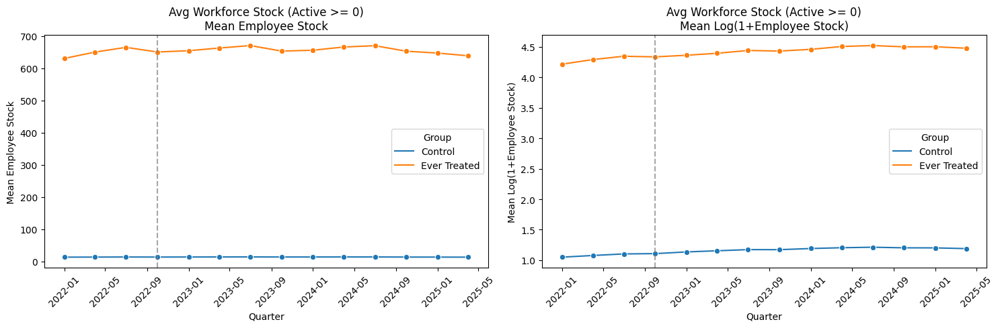

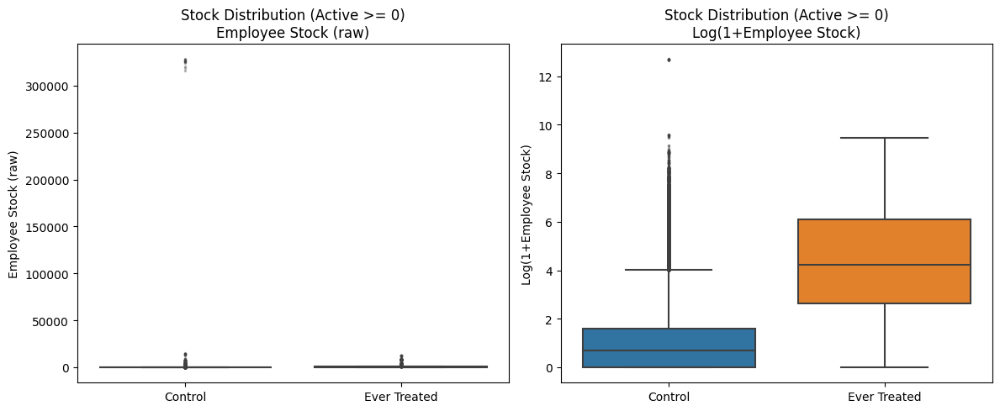

Saved: ../data/Positions/firm_quarter_stock_active_contained_ge0_chatgpt_treated.dta | Rows: 1,485,190

Building FLOW panel (Active >= 0)...


Flow quarters: 100%|██████████| 14/14 [00:02<00:00,  4.90it/s]


  Firms: 106,085 | Treated: 289 | Control: 105,796

Quarterly averages (new hires):
quarter    Treatment      mean  median  n_firms
 2022Q1      Control  1.230321     0.0   105796
 2022Q1 Ever Treated 65.754325     7.0      289
 2022Q2      Control  1.176585     0.0   105796
 2022Q2 Ever Treated 67.678201     7.0      289
 2022Q3      Control  1.212343     0.0   105796
 2022Q3 Ever Treated 71.366782     8.0      289
 2022Q4      Control  0.830608     0.0   105796
 2022Q4 Ever Treated 44.152249     6.0      289
 2023Q1      Control  1.079975     0.0   105796
 2023Q1 Ever Treated 52.768166     6.0      289
 2023Q2      Control  0.974782     0.0   105796
 2023Q2 Ever Treated 47.640138     5.0      289
 2023Q3      Control  0.987731     0.0   105796
 2023Q3 Ever Treated 53.667820     6.0      289
 2023Q4      Control  0.625118     0.0   105796
 2023Q4 Ever Treated 31.193772     4.0      289
 2024Q1      Control  0.861583     0.0   105796
 2024Q1 Ever Treated 42.100346     6.0      289
 202

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

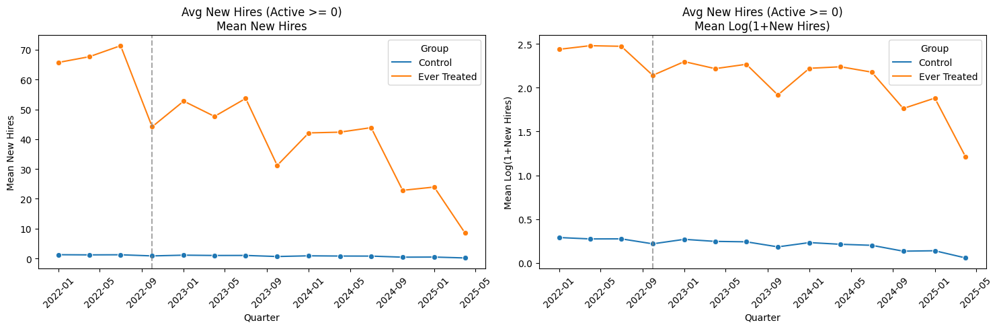

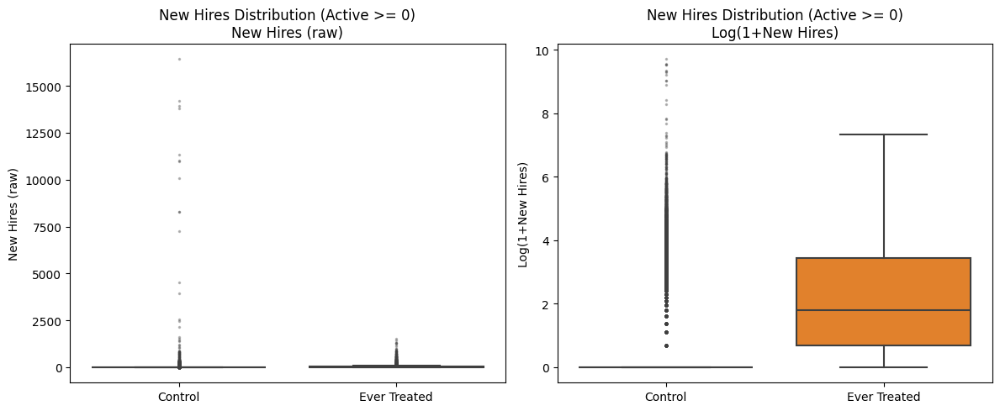

Saved: ../data/Positions/firm_quarter_flow_active_contained_ge0_chatgpt_treated.dta | Rows: 1,485,190

THRESHOLD: >= 5 hires
Active firms: 28,043

Building STOCK panel (Active >= 5)...


Stock quarters: 100%|██████████| 14/14 [00:09<00:00,  1.41it/s]


  Firms: 28,043 | Treated: 269 | Control: 27,774

Quarterly averages (stock):
quarter    Treatment       mean  median  n_firms
 2022Q1      Control  45.089076     9.0    27774
 2022Q1 Ever Treated 676.814126    70.0      269
 2022Q2      Control  45.903687     9.0    27774
 2022Q2 Ever Treated 697.988848    76.0      269
 2022Q3      Control  46.705192     9.0    27774
 2022Q3 Ever Treated 713.773234    82.0      269
 2022Q4      Control  46.081839     9.0    27774
 2022Q4 Ever Treated 698.230483    79.0      269
 2023Q1      Control  46.592425    10.0    27774
 2023Q1 Ever Treated 702.605948    83.0      269
 2023Q2      Control  47.029668    10.0    27774
 2023Q2 Ever Treated 711.483271    80.0      269
 2023Q3      Control  47.432023    10.0    27774
 2023Q3 Ever Treated 719.769517    82.0      269
 2023Q4      Control  46.466443    10.0    27774
 2023Q4 Ever Treated 701.282528    83.0      269
 2024Q1      Control  46.633002    10.0    27774
 2024Q1 Ever Treated 704.167286    84.0 

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

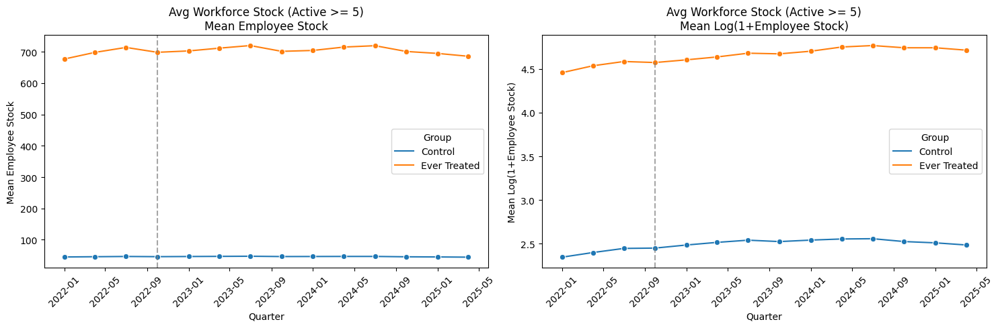

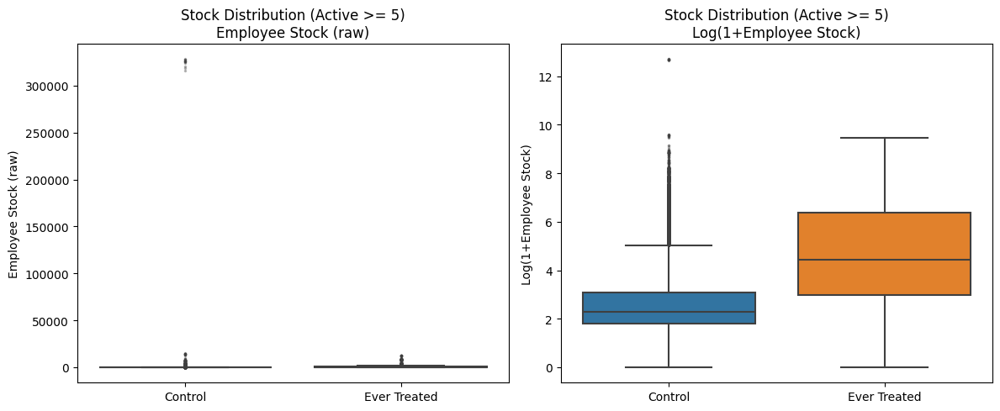

Saved: ../data/Positions/firm_quarter_stock_active_contained_ge5_chatgpt_treated.dta | Rows: 392,602

Building FLOW panel (Active >= 5)...


Flow quarters: 100%|██████████| 14/14 [00:01<00:00, 10.16it/s]


  Firms: 28,043 | Treated: 269 | Control: 27,774

Quarterly averages (new hires):
quarter    Treatment      mean  median  n_firms
 2022Q1      Control  4.304133     1.0    27774
 2022Q1 Ever Treated 70.639405     9.0      269
 2022Q2      Control  4.167855     1.0    27774
 2022Q2 Ever Treated 72.691450     9.0      269
 2022Q3      Control  4.309174     1.0    27774
 2022Q3 Ever Treated 76.650558    10.0      269
 2022Q4      Control  2.919385     1.0    27774
 2022Q4 Ever Treated 47.427509     7.0      269
 2023Q1      Control  3.773781     1.0    27774
 2023Q1 Ever Treated 56.687732     8.0      269
 2023Q2      Control  3.427054     1.0    27774
 2023Q2 Ever Treated 51.174721     6.0      269
 2023Q3      Control  3.483510     1.0    27774
 2023Q3 Ever Treated 57.635688     8.0      269
 2023Q4      Control  2.165082     0.0    27774
 2023Q4 Ever Treated 33.509294     5.0      269
 2024Q1      Control  2.992115     1.0    27774
 2024Q1 Ever Treated 45.223048     7.0      269
 2024Q

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

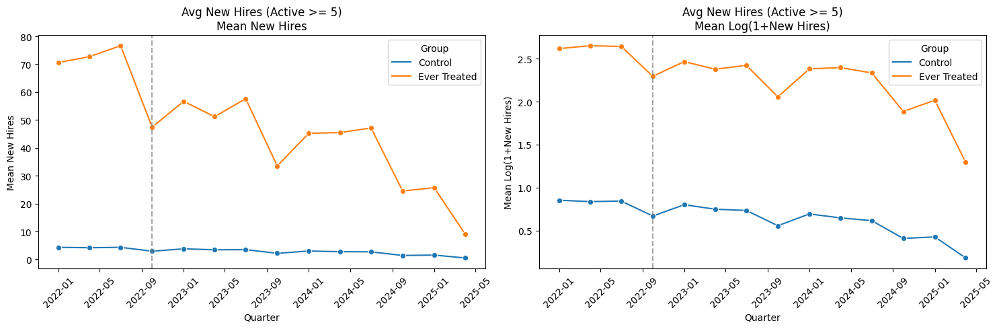

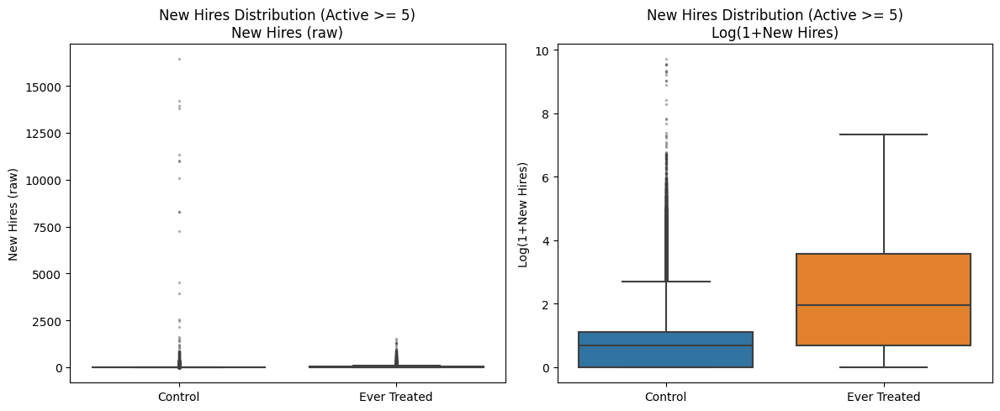

Saved: ../data/Positions/firm_quarter_flow_active_contained_ge5_chatgpt_treated.dta | Rows: 392,602

THRESHOLD: >= 10 hires
Active firms: 16,758

Building STOCK panel (Active >= 10)...


Stock quarters: 100%|██████████| 14/14 [00:09<00:00,  1.48it/s]


  Firms: 16,758 | Treated: 248 | Control: 16,510

Quarterly averages (stock):
quarter    Treatment       mean  median  n_firms
 2022Q1      Control  72.024833    15.0    16510
 2022Q1 Ever Treated 733.814516    93.5      248
 2022Q2      Control  73.310902    16.0    16510
 2022Q2 Ever Treated 756.766129    97.0      248
 2022Q3      Control  74.580133    17.0    16510
 2022Q3 Ever Treated 773.866935    97.0      248
 2022Q4      Control  73.555058    16.0    16510
 2022Q4 Ever Treated 756.995968    99.5      248
 2023Q1      Control  74.347002    17.0    16510
 2023Q1 Ever Treated 761.721774   104.5      248
 2023Q2      Control  75.022471    17.0    16510
 2023Q2 Ever Treated 771.354839   114.0      248
 2023Q3      Control  75.653119    17.0    16510
 2023Q3 Ever Treated 780.326613   117.5      248
 2023Q4      Control  74.082738    17.0    16510
 2023Q4 Ever Treated 760.270161   120.0      248
 2024Q1      Control  74.322895    17.0    16510
 2024Q1 Ever Treated 763.370968   118.5 

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

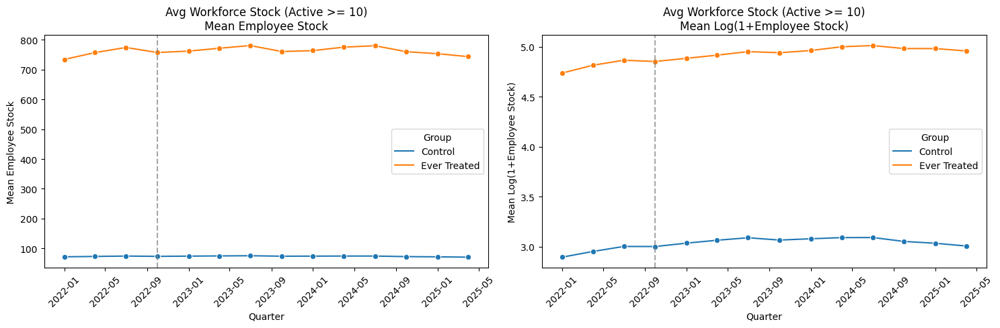

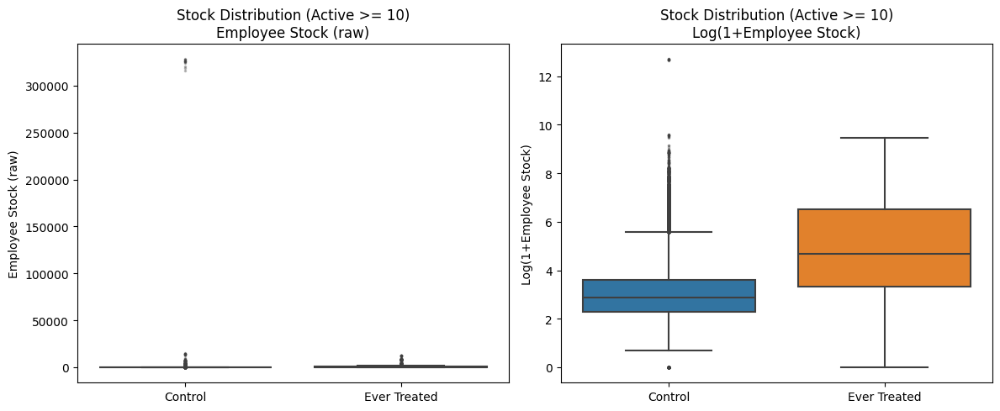

Saved: ../data/Positions/firm_quarter_stock_active_contained_ge10_chatgpt_treated.dta | Rows: 234,612

Building FLOW panel (Active >= 10)...


Flow quarters: 100%|██████████| 14/14 [00:01<00:00, 11.57it/s]


  Firms: 16,758 | Treated: 248 | Control: 16,510

Quarterly averages (new hires):
quarter    Treatment      mean  median  n_firms
 2022Q1      Control  6.842944     2.0    16510
 2022Q1 Ever Treated 76.600806    10.5      248
 2022Q2      Control  6.641975     2.0    16510
 2022Q2 Ever Treated 78.810484    12.0      248
 2022Q3      Control  6.882253     2.0    16510
 2022Q3 Ever Treated 83.112903    13.0      248
 2022Q4      Control  4.637492     1.0    16510
 2022Q4 Ever Treated 51.403226     9.0      248
 2023Q1      Control  5.996063     2.0    16510
 2023Q1 Ever Treated 61.459677     9.0      248
 2023Q2      Control  5.442277     2.0    16510
 2023Q2 Ever Treated 55.467742     8.0      248
 2023Q3      Control  5.556511     2.0    16510
 2023Q3 Ever Treated 62.487903     9.0      248
 2023Q4      Control  3.426590     1.0    16510
 2023Q4 Ever Treated 36.330645     6.0      248
 2024Q1      Control  4.735191     1.0    16510
 2024Q1 Ever Treated 48.991935     8.5      248
 2024Q

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

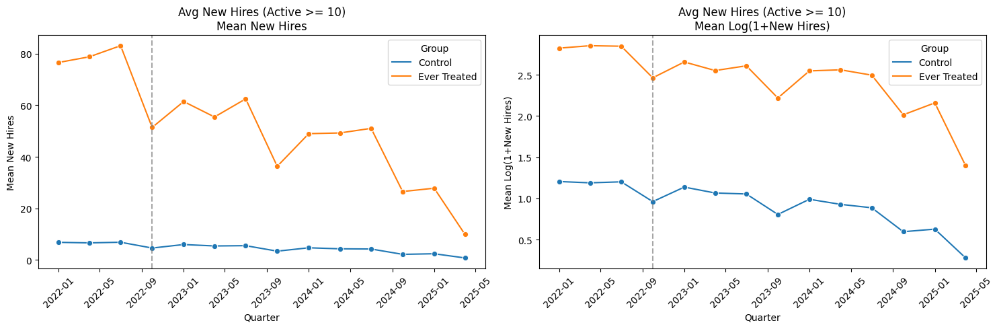

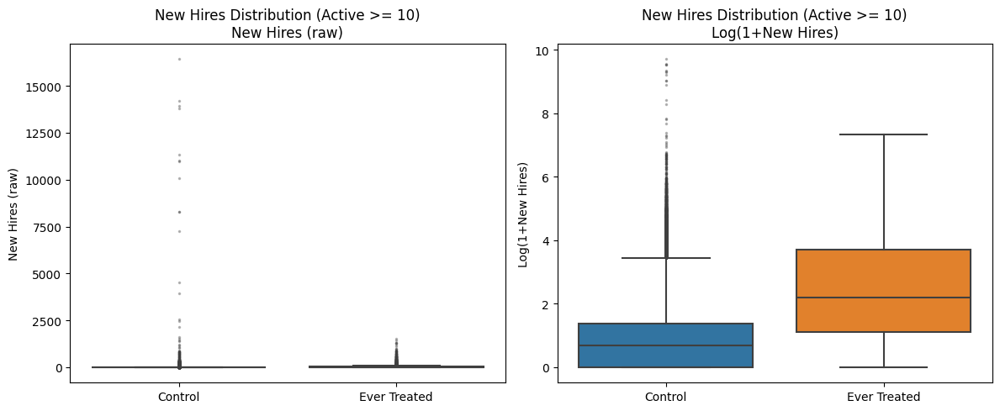

Saved: ../data/Positions/firm_quarter_flow_active_contained_ge10_chatgpt_treated.dta | Rows: 234,612

THRESHOLD: >= 15 hires
Active firms: 12,090

Building STOCK panel (Active >= 15)...


Stock quarters: 100%|██████████| 14/14 [00:11<00:00,  1.17it/s]


  Firms: 12,090 | Treated: 235 | Control: 11,855

Quarterly averages (stock):
quarter    Treatment       mean  median  n_firms
 2022Q1      Control  96.635344    22.0    11855
 2022Q1 Ever Treated 774.080851   123.0      235
 2022Q2      Control  98.333277    23.0    11855
 2022Q2 Ever Treated 798.272340   126.0      235
 2022Q3      Control 100.015690    24.0    11855
 2022Q3 Ever Treated 816.306383   126.0      235
 2022Q4      Control  98.647744    23.0    11855
 2022Q4 Ever Treated 798.514894   127.0      235
 2023Q1      Control  99.686799    24.0    11855
 2023Q1 Ever Treated 803.476596   128.0      235
 2023Q2      Control 100.574694    24.0    11855
 2023Q2 Ever Treated 813.638298   131.0      235
 2023Q3      Control 101.392240    24.0    11855
 2023Q3 Ever Treated 823.080851   140.0      235
 2023Q4      Control  99.271784    24.0    11855
 2023Q4 Ever Treated 801.914894   131.0      235
 2024Q1      Control  99.579334    24.0    11855
 2024Q1 Ever Treated 805.165957   131.0 

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

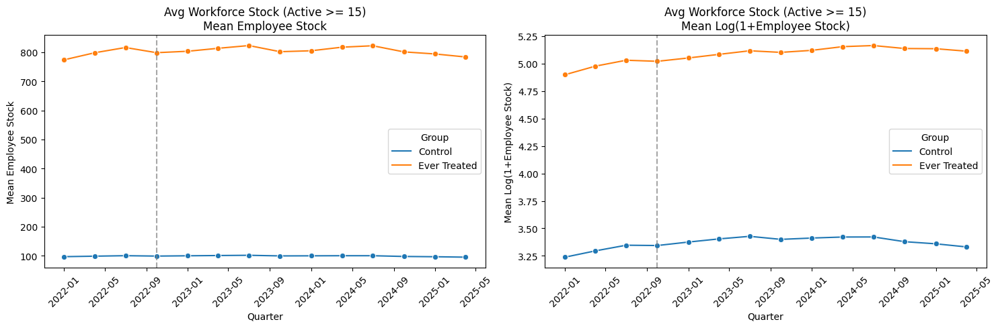

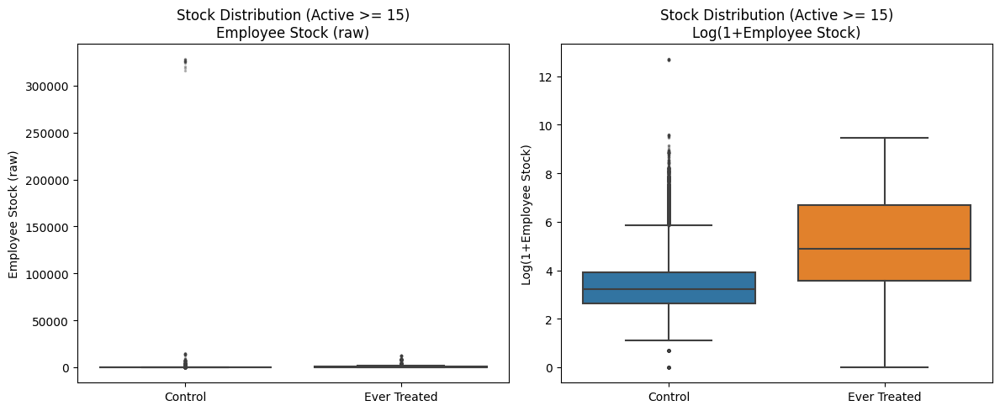

Saved: ../data/Positions/firm_quarter_stock_active_contained_ge15_chatgpt_treated.dta | Rows: 169,260

Building FLOW panel (Active >= 15)...


Flow quarters: 100%|██████████| 14/14 [00:02<00:00,  6.29it/s]


  Firms: 12,090 | Treated: 235 | Control: 11,855

Quarterly averages (new hires):
quarter    Treatment      mean  median  n_firms
 2022Q1      Control  9.105863     3.0    11855
 2022Q1 Ever Treated 80.787234    13.0      235
 2022Q2      Control  8.853986     3.0    11855
 2022Q2 Ever Treated 83.097872    14.0      235
 2022Q3      Control  9.188275     3.0    11855
 2022Q3 Ever Treated 87.672340    14.0      235
 2022Q4      Control  6.180177     2.0    11855
 2022Q4 Ever Treated 54.221277    11.0      235
 2023Q1      Control  7.967524     3.0    11855
 2023Q1 Ever Treated 64.812766    11.0      235
 2023Q2      Control  7.249093     2.0    11855
 2023Q2 Ever Treated 58.514894    11.0      235
 2023Q3      Control  7.406748     2.0    11855
 2023Q3 Ever Treated 65.910638    11.0      235
 2023Q4      Control  4.550485     1.0    11855
 2023Q4 Ever Treated 38.319149     7.0      235
 2024Q1      Control  6.292366     2.0    11855
 2024Q1 Ever Treated 51.659574     9.0      235
 2024Q

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

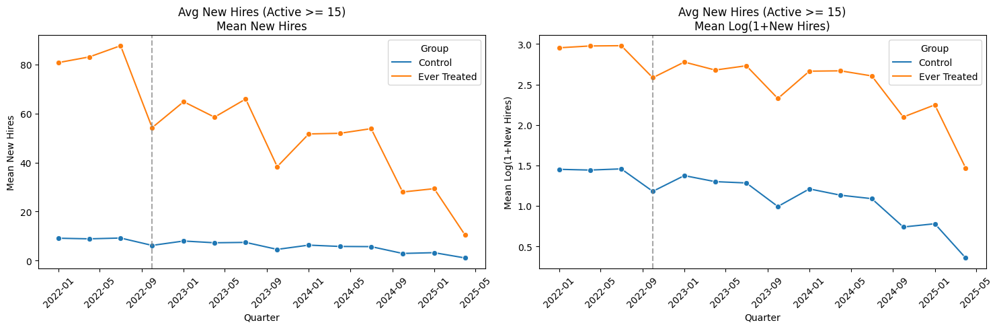

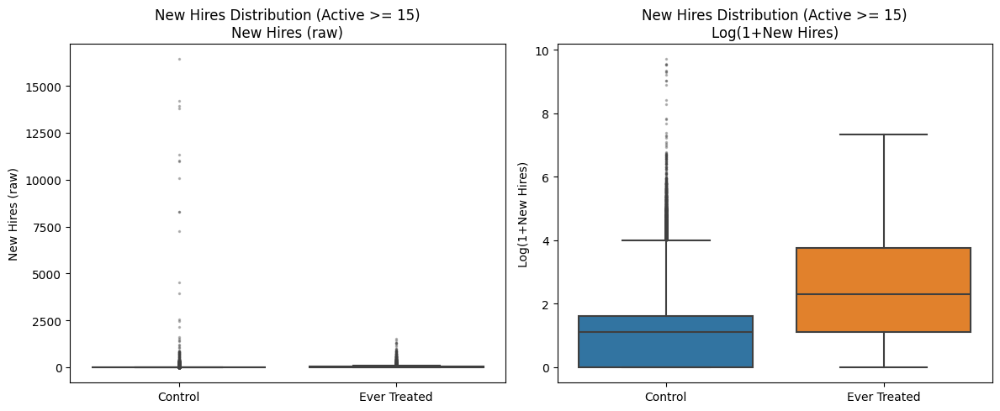

Saved: ../data/Positions/firm_quarter_flow_active_contained_ge15_chatgpt_treated.dta | Rows: 169,260

THRESHOLD: >= 20 hires
Active firms: 9,346

Building STOCK panel (Active >= 20)...


Stock quarters: 100%|██████████| 14/14 [00:14<00:00,  1.05s/it]


  Firms: 9,346 | Treated: 224 | Control: 9,122

Quarterly averages (stock):
quarter    Treatment       mean  median  n_firms
 2022Q1      Control 121.635168    29.0     9122
 2022Q1 Ever Treated 811.665179   155.5      224
 2022Q2      Control 123.730761    30.0     9122
 2022Q2 Ever Treated 837.000000   152.0      224
 2022Q3      Control 125.820873    31.0     9122
 2022Q3 Ever Treated 855.892857   157.0      224
 2022Q4      Control 124.104363    31.0     9122
 2022Q4 Ever Treated 837.245536   153.0      224
 2023Q1      Control 125.395747    31.0     9122
 2023Q1 Ever Treated 842.446429   156.5      224
 2023Q2      Control 126.484104    32.0     9122
 2023Q2 Ever Treated 853.044643   160.0      224
 2023Q3      Control 127.485420    32.0     9122
 2023Q3 Ever Treated 862.919643   163.0      224
 2023Q4      Control 124.811774    31.0     9122
 2023Q4 Ever Treated 840.732143   164.5      224
 2024Q1      Control 125.163999    31.0     9122
 2024Q1 Ever Treated 844.093750   168.0   

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

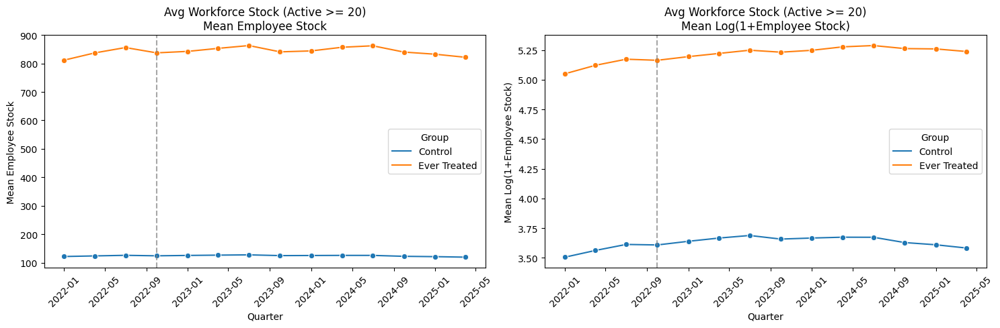

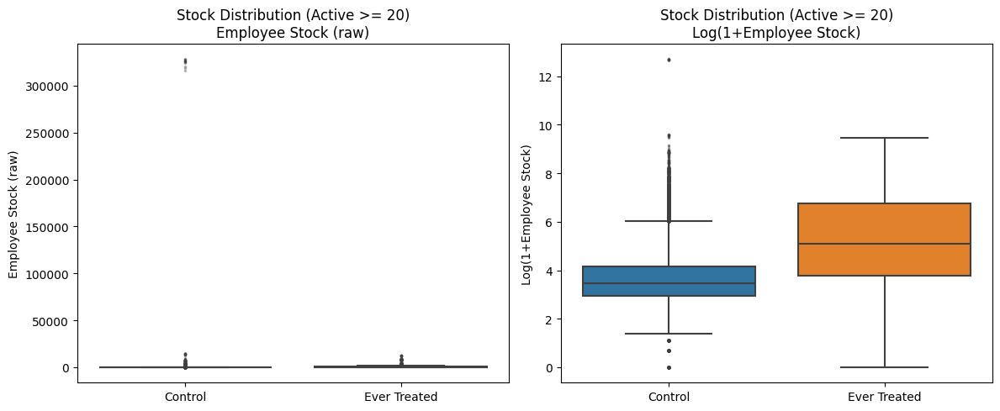

Saved: ../data/Positions/firm_quarter_stock_active_contained_ge20_chatgpt_treated.dta | Rows: 130,844

Building FLOW panel (Active >= 20)...


Flow quarters: 100%|██████████| 14/14 [00:02<00:00,  6.72it/s]


  Firms: 9,346 | Treated: 224 | Control: 9,122

Quarterly averages (new hires):
quarter    Treatment      mean  median  n_firms
 2022Q1      Control 11.377658     4.0     9122
 2022Q1 Ever Treated 84.687500    16.0      224
 2022Q2      Control 11.056676     4.0     9122
 2022Q2 Ever Treated 87.111607    16.0      224
 2022Q3      Control 11.499342     4.0     9122
 2022Q3 Ever Treated 91.924107    16.5      224
 2022Q4      Control  7.720237     3.0     9122
 2022Q4 Ever Treated 56.861607    12.0      224
 2023Q1      Control  9.946174     3.0     9122
 2023Q1 Ever Treated 67.959821    14.5      224
 2023Q2      Control  9.044617     3.0     9122
 2023Q2 Ever Treated 61.299107    13.5      224
 2023Q3      Control  9.265402     3.0     9122
 2023Q3 Ever Treated 69.089286    12.5      224
 2023Q4      Control  5.666630     2.0     9122
 2023Q4 Ever Treated 40.138393     8.0      224
 2024Q1      Control  7.818790     3.0     9122
 2024Q1 Ever Treated 54.107143    11.0      224
 2024Q2 

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

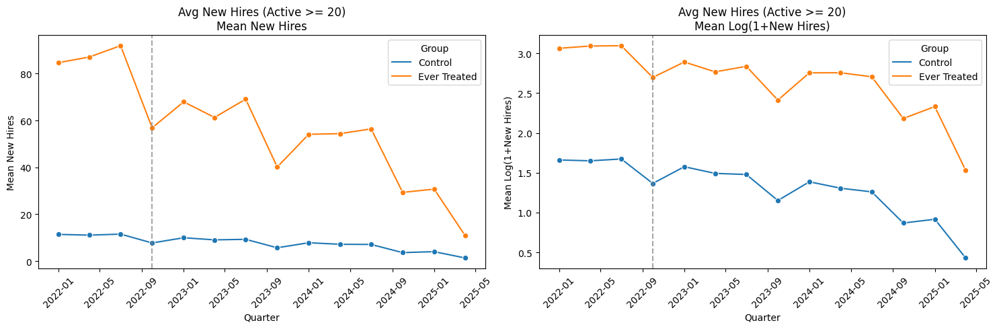

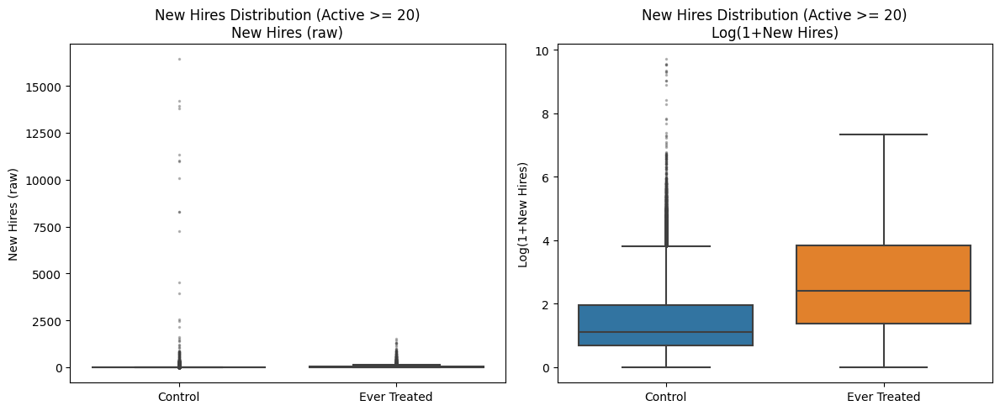

Saved: ../data/Positions/firm_quarter_flow_active_contained_ge20_chatgpt_treated.dta | Rows: 130,844


In [17]:
# =============================================================
# MAIN: load + clean ONCE, then build all panels
# =============================================================

POSITIONS_PATH  = r"C:\LocalOneDrive\Documents\Desktop\NUS\Y4S1\FYP\causal-impact-GenAI\data\Positions\positions_stock.csv"
POST1_PATH      = "../data/flagged_postings_gpt_predictions.csv"
POST2_PATH      = "../data/flagged_postings_gpt_predictions_2021Sep_Dec.csv"
TREATED_START   = "2022-11-30"
TREATED_END     = "2025-07-01"
HIRE_START      = "2021-01-01"
HIRE_END        = "2025-07-01"
PANEL_START     = "2022Q1"
PANEL_END       = "2025Q2"
TREAT_Q         = "2022Q4"
THRESHOLDS      = [0, 5, 10, 15, 20]
OUT_DIR         = "../data/Positions/"

RECRUITMENT_INDUSTRIES = [
    "Recruitment and Staffing Services",
    "Employment and Staffing Services",
    "Employment and Recruitment Services",
    "Human Resources and Recruitment Services",
    "Online Employment Platforms",
    "Human Resources and Workforce Solutions",
    "Business Process Outsourcing Services",
]

# ---- Step 1: Load and clean once ----
clean_positions = load_and_clean_positions(POSITIONS_PATH, RECRUITMENT_INDUSTRIES)

# ---- Step 2: Treated firms once ----
treated_firms = load_treated_firms(POST1_PATH, POST2_PATH, TREATED_START, TREATED_END)

# ---- Step 3: Build all panels per threshold ----
stock_results = {}
flow_results  = {}

for thr in THRESHOLDS:
    print(f"\n{'='*60}")
    print(f"THRESHOLD: >= {thr} hires")
    print(f"{'='*60}")

    active_firms = get_active_firms(clean_positions, HIRE_START, HIRE_END, thr)
    print(f"Active firms: {len(active_firms):,}")

    stock_panel, _ = build_stock_panel(
        positions=clean_positions,
        treated_firms=treated_firms,
        active_firms=active_firms,
        panel_start_q=PANEL_START,
        panel_end_q=PANEL_END,
        treat_q=TREAT_Q,
        active_threshold=thr,
        out_path=f"{OUT_DIR}firm_quarter_stock_active_contained_ge{thr}_chatgpt_treated.dta",
        make_plots=True,
    )

    flow_panel, _ = build_flow_panel(
        positions=clean_positions,
        treated_firms=treated_firms,
        active_firms=active_firms,
        panel_start_q=PANEL_START,
        panel_end_q=PANEL_END,
        treat_q=TREAT_Q,
        active_threshold=thr,
        out_path=f"{OUT_DIR}firm_quarter_flow_active_contained_ge{thr}_chatgpt_treated.dta",
        make_plots=True,
    )

    stock_results[thr] = stock_panel
    flow_results[thr]  = flow_panel

Understanding SENIORITY dimension

In [20]:
def build_stock_panel_seniority(
    positions: pd.DataFrame,
    treated_firms: set,
    active_firms: set,
    panel_start_q: str,
    panel_end_q: str,
    treat_q: str,
    active_threshold: int,
    out_path: str,
    make_plots: bool = True,
) -> tuple:
    quarters = pd.period_range(panel_start_q, panel_end_q, freq="Q")
    cutoff = pd.Period(treat_q, freq="Q").to_timestamp()
    stata_epoch = pd.Period("1960Q1", freq="Q")

    # Seniority filter and indicators
    pos = positions[positions["company_name"].isin(active_firms)].copy()
    pos = pos[pos["seniority"].between(1, 7)].copy()
    pos["is_junior"] = pos["seniority"].between(1, 3).astype(int)
    pos["is_senior"] = pos["seniority"].between(4, 7).astype(int)

    print(f"\nBuilding STOCK SENIORITY panel (Active >= {active_threshold})...")
    stock_list = []
    for q in tqdm(quarters, desc="Stock seniority quarters"):
        q_start = q.start_time
        q_end   = q.end_time

        active = pos[
            (pos["startdate"] <= q_end)
            & (pos["enddate"].isna() | (pos["enddate"] >= q_start))
        ]

        # Compute total, junior, senior in one pass per quarter
        results = {"quarter": q}
        for label, mask in [
            ("stock_total",  pd.Series(True, index=active.index)),
            ("stock_junior", active["is_junior"] == 1),
            ("stock_senior", active["is_senior"] == 1),
        ]:
            results[label] = (
                active[mask]
                .groupby("company_name")["user_id"]
                .nunique()
                .rename(label)
            )

        quarter_df = (
            pd.DataFrame(results["stock_total"])
            .join(results["stock_junior"], how="left")
            .join(results["stock_senior"], how="left")
            .fillna(0)
            .astype(int)
            .reset_index()
        )
        quarter_df["quarter"] = q
        stock_list.append(quarter_df)

    stock_panel = pd.concat(stock_list, ignore_index=True)

    # Balance
    full = (
        pd.DataFrame({"company_name": sorted(active_firms)}).assign(_tmp=1)
        .merge(pd.DataFrame({"quarter": quarters}).assign(_tmp=1), on="_tmp")
        .drop(columns="_tmp")
    )
    stock_panel = full.merge(stock_panel, on=["company_name", "quarter"], how="left")
    for c in ["stock_total", "stock_junior", "stock_senior"]:
        stock_panel[c] = stock_panel[c].fillna(0).astype(int)

    # Treatment + derived columns
    stock_panel["treated"]      = stock_panel["company_name"].isin(treated_firms).astype(int)
    stock_panel["Treatment"]    = stock_panel["treated"].map({0: "Control", 1: "Ever Treated"})
    stock_panel["quarter_date"] = stock_panel["quarter"].dt.to_timestamp()
    stock_panel["firm_id"]      = stock_panel["company_name"].astype("category").cat.codes + 1
    stock_panel["tq"]           = stock_panel["quarter"].apply(lambda p: (p - stata_epoch).n).astype(int)
    for raw, log in [("stock_total", "log_stock_total"), ("stock_junior", "log_stock_junior"), ("stock_senior", "log_stock_senior")]:
        stock_panel[log] = np.log1p(stock_panel[raw])

    # Summary
    print(f"  Firms: {stock_panel['company_name'].nunique():,} | "
          f"Treated: {stock_panel.loc[stock_panel['treated']==1,'company_name'].nunique():,} | "
          f"Control: {stock_panel.loc[stock_panel['treated']==0,'company_name'].nunique():,}")
    for col in ["stock_total", "stock_junior", "stock_senior"]:
        avg = stock_panel.groupby(["quarter", "Treatment"])[col].agg(mean="mean", median="median", n_firms="count").reset_index()
        print(f"\nQuarterly averages — {col}:\n{avg.to_string(index=False)}")

    # Plots
    if make_plots:
        log_cols   = ["log_stock_total", "log_stock_junior", "log_stock_senior"]
        log_labels = ["log(1+stock_total)", "log(1+stock_junior)", "log(1+stock_senior)"]

        fig, axes = plt.subplots(1, 3, figsize=(20, 5))
        for ax, col, ylabel in zip(axes, log_cols, log_labels):
            plot_data = stock_panel.groupby(["quarter_date", "Treatment"])[col].mean().reset_index()
            sns.lineplot(data=plot_data, x="quarter_date", y=col, hue="Treatment", marker="o", ax=ax)
            ax.axvline(cutoff, linestyle="--", color="grey", alpha=0.7)
            ax.set_title(f"Active >= {active_threshold}\n{ylabel}")
            ax.set_xlabel("Quarter")
            ax.set_ylabel(f"Mean {ylabel}")
            ax.tick_params(axis="x", rotation=45)
            ax.legend(title="Group")
        plt.suptitle("Workforce Stock Over Time: Total / Junior / Senior", fontsize=13, y=1.02)
        plt.tight_layout()
        plt.savefig(f"stock_seniority_line_thr{active_threshold}.png", dpi=150)
        plt.show()

        fig, axes = plt.subplots(1, 2, figsize=(14, 5))
        for ax, label in zip(axes, ["Control", "Ever Treated"]):
            subset = stock_panel[stock_panel["Treatment"] == label]
            for col, marker, lbl in [("log_stock_junior", "o", "Junior (1-3)"), ("log_stock_senior", "s", "Senior (4-7)")]:
                plot_data = subset.groupby("quarter_date")[col].mean().reset_index()
                ax.plot(plot_data["quarter_date"], plot_data[col], marker=marker, label=lbl)
            ax.axvline(cutoff, linestyle="--", color="grey", alpha=0.7)
            ax.set_title(f"{label} firms\nJunior vs Senior Stock")
            ax.set_xlabel("Quarter")
            ax.set_ylabel("Mean log(1+stock)")
            ax.tick_params(axis="x", rotation=45)
            ax.legend()
        plt.suptitle(f"Junior vs Senior Stock (Active >= {active_threshold})", fontsize=13, y=1.02)
        plt.tight_layout()
        plt.savefig(f"stock_junior_vs_senior_thr{active_threshold}.png", dpi=150)
        plt.show()

        fig, axes = plt.subplots(1, 3, figsize=(18, 5))
        for ax, col, ylabel in zip(axes, log_cols, log_labels):
            sns.boxplot(data=stock_panel, x="Treatment", y=col, order=["Control", "Ever Treated"], ax=ax,
                        flierprops=dict(marker=".", alpha=0.3, markersize=3))
            ax.set_title(f"{ylabel}\n(Active >= {active_threshold})")
            ax.set_xlabel("")
            ax.set_ylabel(ylabel)
        plt.tight_layout()
        plt.savefig(f"stock_seniority_box_thr{active_threshold}.png", dpi=150)
        plt.show()

    # Save
    out_cols = ["firm_id", "company_name", "tq", "treated",
                "stock_total", "stock_junior", "stock_senior",
                "log_stock_total", "log_stock_junior", "log_stock_senior"]
    stata_df = stock_panel[out_cols].copy()
    for c, t in [("firm_id", int), ("tq", int), ("treated", int)]:
        stata_df[c] = stata_df[c].astype(t)
    for c in ["stock_total", "stock_junior", "stock_senior", "log_stock_total", "log_stock_junior", "log_stock_senior"]:
        stata_df[c] = stata_df[c].astype(float)

    pyreadstat.write_dta(stata_df, out_path, version=14)
    print(f"Saved: {out_path} | Rows: {len(stata_df):,}")
    return stock_panel, stata_df


def build_flow_panel_seniority(
    positions: pd.DataFrame,
    treated_firms: set,
    active_firms: set,
    panel_start_q: str,
    panel_end_q: str,
    treat_q: str,
    active_threshold: int,
    out_path: str,
    make_plots: bool = True,
) -> tuple:
    quarters = pd.period_range(panel_start_q, panel_end_q, freq="Q")
    cutoff = pd.Period(treat_q, freq="Q").to_timestamp()
    stata_epoch = pd.Period("1960Q1", freq="Q")

    pos = positions[positions["company_name"].isin(active_firms)].copy()
    pos = pos[pos["seniority"].between(1, 7)].copy()
    pos["is_junior"] = pos["seniority"].between(1, 3).astype(int)
    pos["is_senior"] = pos["seniority"].between(4, 7).astype(int)

    print(f"\nBuilding FLOW SENIORITY panel (Active >= {active_threshold})...")
    flow_list = []
    for q in tqdm(quarters, desc="Flow seniority quarters"):
        q_start      = q.start_time
        next_q_start = (q + 1).start_time

        started = pos[
            (pos["startdate"] >= q_start)
            & (pos["startdate"] < next_q_start)
        ]

        results = {}
        for label, mask in [
            ("new_hires_total",  pd.Series(True, index=started.index)),
            ("new_hires_junior", started["is_junior"] == 1),
            ("new_hires_senior", started["is_senior"] == 1),
        ]:
            results[label] = (
                started[mask]
                .groupby("company_name")["user_id"]
                .nunique()
                .rename(label)
            )

        quarter_df = (
            pd.DataFrame(results["new_hires_total"])
            .join(results["new_hires_junior"], how="left")
            .join(results["new_hires_senior"], how="left")
            .fillna(0)
            .astype(int)
            .reset_index()
        )
        quarter_df["quarter"] = q
        flow_list.append(quarter_df)

    flow_panel = pd.concat(flow_list, ignore_index=True)

    # Balance
    full = (
        pd.DataFrame({"company_name": sorted(active_firms)}).assign(_tmp=1)
        .merge(pd.DataFrame({"quarter": quarters}).assign(_tmp=1), on="_tmp")
        .drop(columns="_tmp")
    )
    panel = full.merge(flow_panel, on=["company_name", "quarter"], how="left")
    for c in ["new_hires_total", "new_hires_junior", "new_hires_senior"]:
        panel[c] = panel[c].fillna(0).astype(int)

    # Treatment + derived columns
    panel["treated"]      = panel["company_name"].isin(treated_firms).astype(int)
    panel["Treatment"]    = panel["treated"].map({0: "Control", 1: "Ever Treated"})
    panel["post"]         = (panel["quarter"] >= pd.Period(treat_q, freq="Q")).astype(int)
    panel["quarter_date"] = panel["quarter"].dt.to_timestamp()
    panel["firm_id"]      = panel["company_name"].astype("category").cat.codes + 1
    panel["tq"]           = panel["quarter"].apply(lambda p: (p - stata_epoch).n).astype(int)
    for raw, log in [("new_hires_total", "log_new_hires_total"), ("new_hires_junior", "log_new_hires_junior"), ("new_hires_senior", "log_new_hires_senior")]:
        panel[log] = np.log1p(panel[raw])

    # Summary
    print(f"  Firms: {panel['company_name'].nunique():,} | "
          f"Treated: {panel.loc[panel['treated']==1,'company_name'].nunique():,} | "
          f"Control: {panel.loc[panel['treated']==0,'company_name'].nunique():,}")
    for col in ["new_hires_total", "new_hires_junior", "new_hires_senior"]:
        avg = panel.groupby(["quarter", "Treatment"])[col].agg(mean="mean", median="median", n_firms="count").reset_index()
        print(f"\nQuarterly averages — {col}:\n{avg.to_string(index=False)}")

    # Plots — identical structure to stock, just different column names
    if make_plots:
        log_cols   = ["log_new_hires_total", "log_new_hires_junior", "log_new_hires_senior"]
        log_labels = ["log(1+hires_total)", "log(1+hires_junior)", "log(1+hires_senior)"]

        fig, axes = plt.subplots(1, 3, figsize=(20, 5))
        for ax, col, ylabel in zip(axes, log_cols, log_labels):
            plot_data = panel.groupby(["quarter_date", "Treatment"])[col].mean().reset_index()
            sns.lineplot(data=plot_data, x="quarter_date", y=col, hue="Treatment", marker="o", ax=ax)
            ax.axvline(cutoff, linestyle="--", color="grey", alpha=0.7)
            ax.set_title(f"Active >= {active_threshold}\n{ylabel}")
            ax.set_xlabel("Quarter")
            ax.set_ylabel(f"Mean {ylabel}")
            ax.tick_params(axis="x", rotation=45)
            ax.legend(title="Group")
        plt.suptitle("New Hires Over Time: Total / Junior / Senior", fontsize=13, y=1.02)
        plt.tight_layout()
        plt.savefig(f"flow_seniority_line_thr{active_threshold}.png", dpi=150)
        plt.show()

        fig, axes = plt.subplots(1, 2, figsize=(14, 5))
        for ax, label in zip(axes, ["Control", "Ever Treated"]):
            subset = panel[panel["Treatment"] == label]
            for col, marker, lbl in [("log_new_hires_junior", "o", "Junior (1-3)"), ("log_new_hires_senior", "s", "Senior (4-7)")]:
                plot_data = subset.groupby("quarter_date")[col].mean().reset_index()
                ax.plot(plot_data["quarter_date"], plot_data[col], marker=marker, label=lbl)
            ax.axvline(cutoff, linestyle="--", color="grey", alpha=0.7)
            ax.set_title(f"{label} firms\nJunior vs Senior New Hires")
            ax.set_xlabel("Quarter")
            ax.set_ylabel("Mean log(1+new hires)")
            ax.tick_params(axis="x", rotation=45)
            ax.legend()
        plt.suptitle(f"Junior vs Senior New Hires (Active >= {active_threshold})", fontsize=13, y=1.02)
        plt.tight_layout()
        plt.savefig(f"flow_junior_vs_senior_thr{active_threshold}.png", dpi=150)
        plt.show()

        fig, axes = plt.subplots(1, 3, figsize=(18, 5))
        for ax, col, ylabel in zip(axes, log_cols, log_labels):
            sns.boxplot(data=panel, x="Treatment", y=col, order=["Control", "Ever Treated"], ax=ax,
                        flierprops=dict(marker=".", alpha=0.3, markersize=3))
            ax.set_title(f"{ylabel}\n(Active >= {active_threshold})")
            ax.set_xlabel("")
            ax.set_ylabel(ylabel)
        plt.tight_layout()
        plt.savefig(f"flow_seniority_box_thr{active_threshold}.png", dpi=150)
        plt.show()

    # Save
    out_cols = ["firm_id", "company_name", "tq", "treated", "post",
                "new_hires_total", "new_hires_junior", "new_hires_senior",
                "log_new_hires_total", "log_new_hires_junior", "log_new_hires_senior"]
    stata_df = panel[out_cols].copy()
    for c, t in [("firm_id", int), ("tq", int), ("treated", int), ("post", int)]:
        stata_df[c] = stata_df[c].astype(t)
    for c in ["new_hires_total", "new_hires_junior", "new_hires_senior",
              "log_new_hires_total", "log_new_hires_junior", "log_new_hires_senior"]:
        stata_df[c] = stata_df[c].astype(float)

    pyreadstat.write_dta(stata_df, out_path, version=14)
    print(f"Saved: {out_path} | Rows: {len(stata_df):,}")
    return panel, stata_df


THRESHOLD: >= 0 hires

Building STOCK SENIORITY panel (Active >= 0)...


Stock seniority quarters: 100%|██████████| 14/14 [00:47<00:00,  3.37s/it]


  Firms: 106,085 | Treated: 289 | Control: 105,796

Quarterly averages — stock_total:
quarter    Treatment       mean  median  n_firms
 2022Q1      Control  12.866016     1.0   105796
 2022Q1 Ever Treated 630.280277    61.0      289
 2022Q2      Control  13.094692     1.0   105796
 2022Q2 Ever Treated 649.993080    64.0      289
 2022Q3      Control  13.320693     1.0   105796
 2022Q3 Ever Treated 664.702422    67.0      289
 2022Q4      Control  13.154250     1.0   105796
 2022Q4 Ever Treated 650.235294    63.0      289
 2023Q1      Control  13.314766     1.0   105796
 2023Q1 Ever Treated 654.294118    64.0      289
 2023Q2      Control  13.444856     1.0   105796
 2023Q2 Ever Treated 662.564014    67.0      289
 2023Q3      Control  13.568963     1.0   105796
 2023Q3 Ever Treated 670.290657    68.0      289
 2023Q4      Control  13.315267     1.0   105796
 2023Q4 Ever Treated 653.076125    70.0      289
 2024Q1      Control  13.381064     1.0   105796
 2024Q1 Ever Treated 655.754325 

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

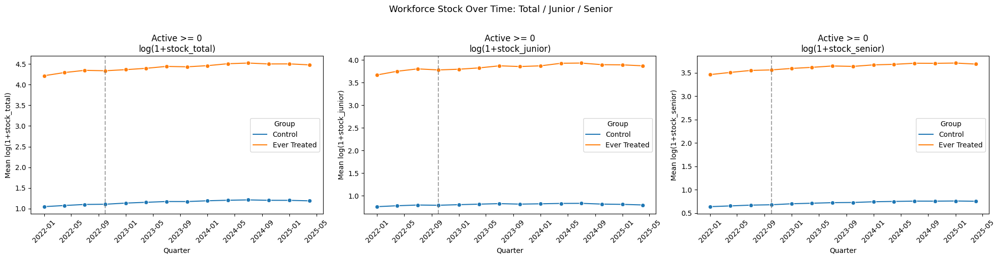

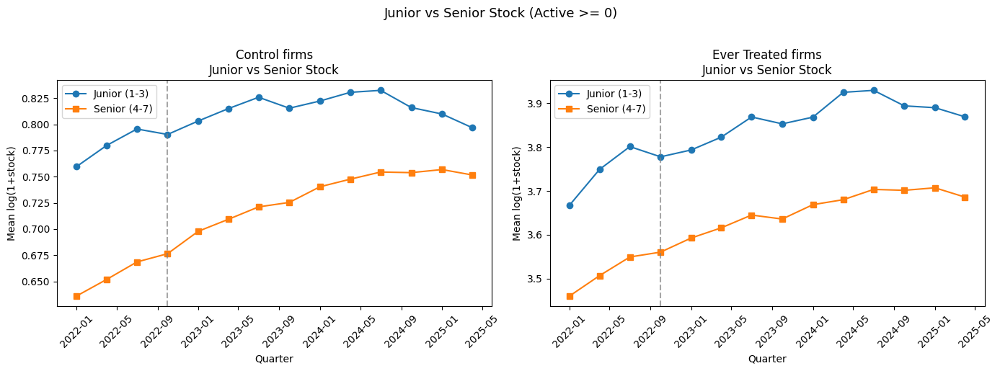

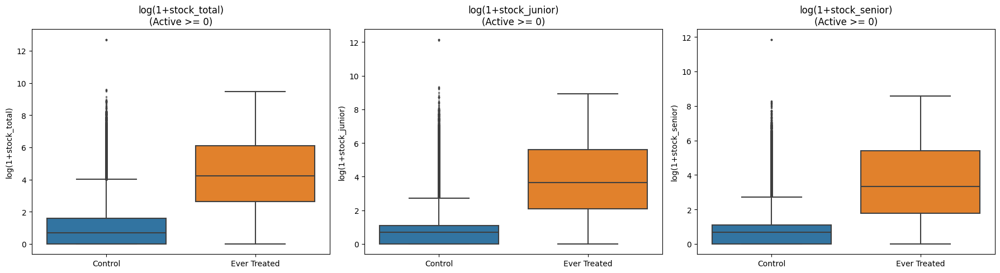

Saved: ../data/Positions/firm_quarter_stock_seniority_active_contained_ge0_chatgpt_treated.dta | Rows: 1,485,190

Building FLOW SENIORITY panel (Active >= 0)...


Flow seniority quarters: 100%|██████████| 14/14 [00:06<00:00,  2.26it/s]


  Firms: 106,085 | Treated: 289 | Control: 105,796

Quarterly averages — new_hires_total:
quarter    Treatment      mean  median  n_firms
 2022Q1      Control  1.230321     0.0   105796
 2022Q1 Ever Treated 65.754325     7.0      289
 2022Q2      Control  1.176585     0.0   105796
 2022Q2 Ever Treated 67.678201     7.0      289
 2022Q3      Control  1.212343     0.0   105796
 2022Q3 Ever Treated 71.366782     8.0      289
 2022Q4      Control  0.830608     0.0   105796
 2022Q4 Ever Treated 44.152249     6.0      289
 2023Q1      Control  1.079975     0.0   105796
 2023Q1 Ever Treated 52.768166     6.0      289
 2023Q2      Control  0.974782     0.0   105796
 2023Q2 Ever Treated 47.640138     5.0      289
 2023Q3      Control  0.987731     0.0   105796
 2023Q3 Ever Treated 53.667820     6.0      289
 2023Q4      Control  0.625118     0.0   105796
 2023Q4 Ever Treated 31.193772     4.0      289
 2024Q1      Control  0.861583     0.0   105796
 2024Q1 Ever Treated 42.100346     6.0      28

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

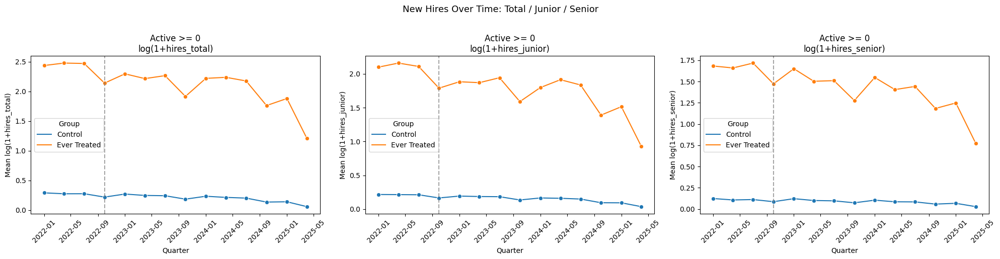

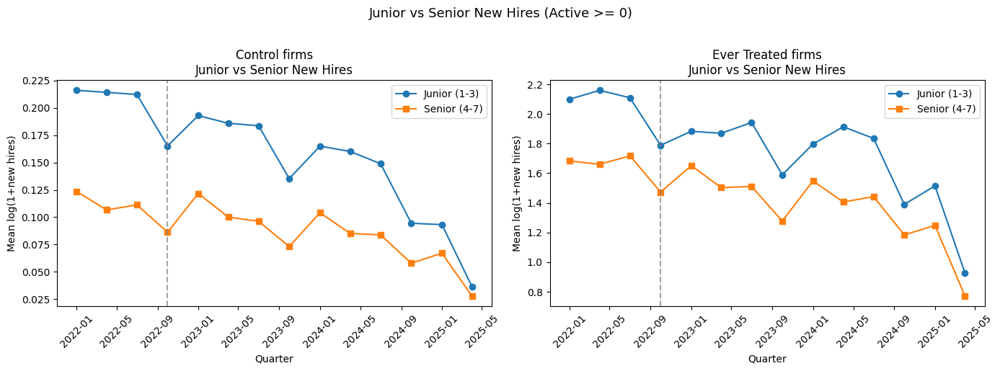

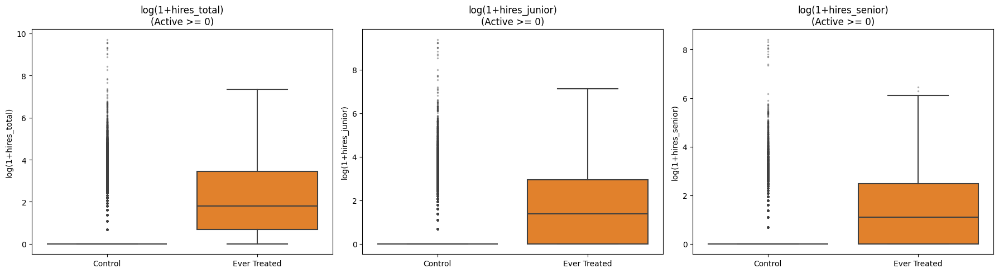

Saved: ../data/Positions/firm_quarter_flow_seniority_active_contained_ge0_chatgpt_treated.dta | Rows: 1,485,190

THRESHOLD: >= 5 hires

Building STOCK SENIORITY panel (Active >= 5)...


Stock seniority quarters: 100%|██████████| 14/14 [00:46<00:00,  3.33s/it]


  Firms: 28,043 | Treated: 269 | Control: 27,774

Quarterly averages — stock_total:
quarter    Treatment       mean  median  n_firms
 2022Q1      Control  45.089076     9.0    27774
 2022Q1 Ever Treated 676.814126    70.0      269
 2022Q2      Control  45.903687     9.0    27774
 2022Q2 Ever Treated 697.988848    76.0      269
 2022Q3      Control  46.705192     9.0    27774
 2022Q3 Ever Treated 713.773234    82.0      269
 2022Q4      Control  46.081839     9.0    27774
 2022Q4 Ever Treated 698.230483    79.0      269
 2023Q1      Control  46.592425    10.0    27774
 2023Q1 Ever Treated 702.605948    83.0      269
 2023Q2      Control  47.029668    10.0    27774
 2023Q2 Ever Treated 711.483271    80.0      269
 2023Q3      Control  47.432023    10.0    27774
 2023Q3 Ever Treated 719.769517    82.0      269
 2023Q4      Control  46.466443    10.0    27774
 2023Q4 Ever Treated 701.282528    83.0      269
 2024Q1      Control  46.633002    10.0    27774
 2024Q1 Ever Treated 704.167286   

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

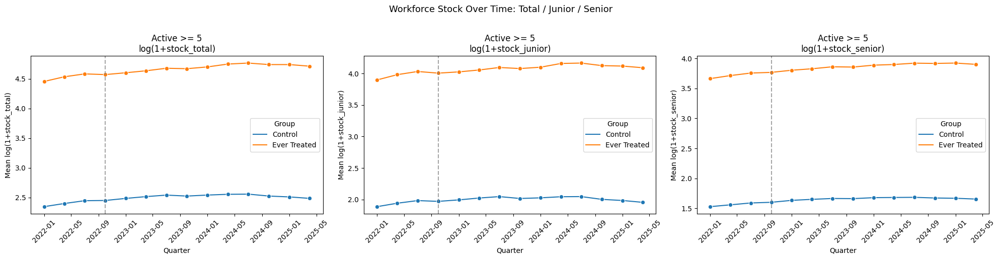

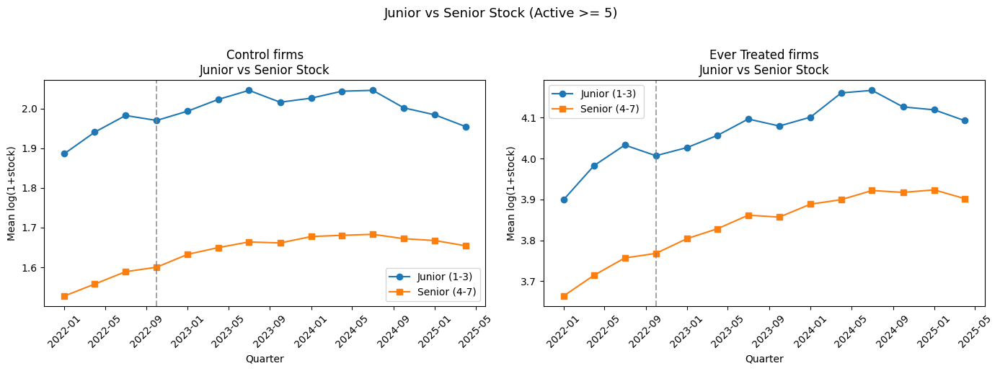

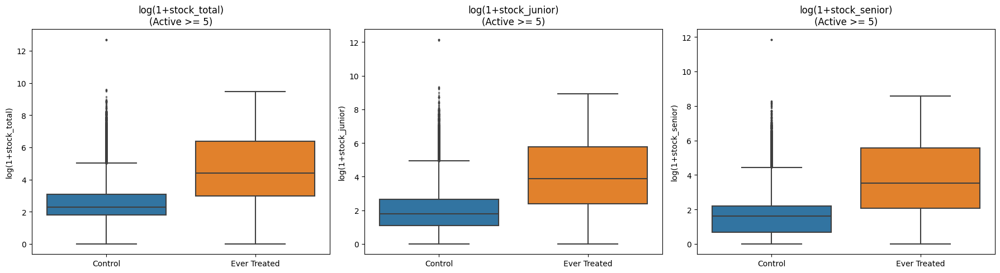

Saved: ../data/Positions/firm_quarter_stock_seniority_active_contained_ge5_chatgpt_treated.dta | Rows: 392,602

Building FLOW SENIORITY panel (Active >= 5)...


Flow seniority quarters: 100%|██████████| 14/14 [00:03<00:00,  3.97it/s]


  Firms: 28,043 | Treated: 269 | Control: 27,774

Quarterly averages — new_hires_total:
quarter    Treatment      mean  median  n_firms
 2022Q1      Control  4.304133     1.0    27774
 2022Q1 Ever Treated 70.639405     9.0      269
 2022Q2      Control  4.167855     1.0    27774
 2022Q2 Ever Treated 72.691450     9.0      269
 2022Q3      Control  4.309174     1.0    27774
 2022Q3 Ever Treated 76.650558    10.0      269
 2022Q4      Control  2.919385     1.0    27774
 2022Q4 Ever Treated 47.427509     7.0      269
 2023Q1      Control  3.773781     1.0    27774
 2023Q1 Ever Treated 56.687732     8.0      269
 2023Q2      Control  3.427054     1.0    27774
 2023Q2 Ever Treated 51.174721     6.0      269
 2023Q3      Control  3.483510     1.0    27774
 2023Q3 Ever Treated 57.635688     8.0      269
 2023Q4      Control  2.165082     0.0    27774
 2023Q4 Ever Treated 33.509294     5.0      269
 2024Q1      Control  2.992115     1.0    27774
 2024Q1 Ever Treated 45.223048     7.0      269


c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

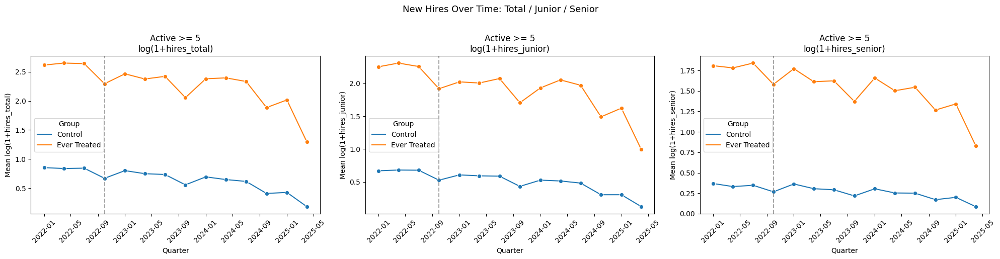

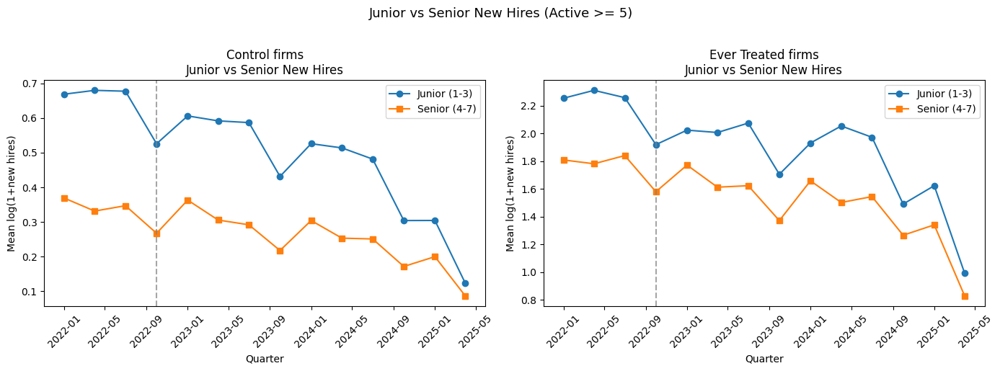

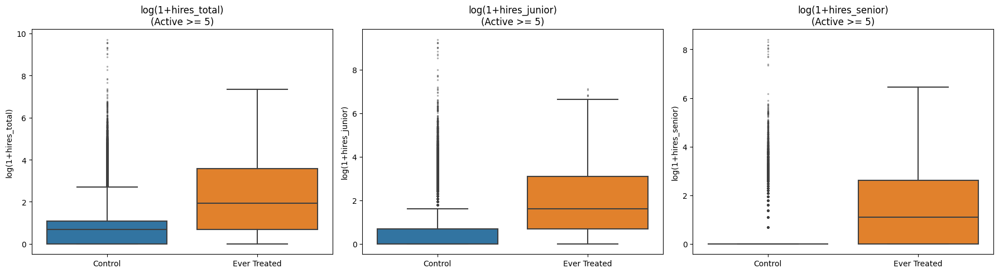

Saved: ../data/Positions/firm_quarter_flow_seniority_active_contained_ge5_chatgpt_treated.dta | Rows: 392,602

THRESHOLD: >= 10 hires

Building STOCK SENIORITY panel (Active >= 10)...


Stock seniority quarters: 100%|██████████| 14/14 [00:19<00:00,  1.37s/it]


  Firms: 16,758 | Treated: 248 | Control: 16,510

Quarterly averages — stock_total:
quarter    Treatment       mean  median  n_firms
 2022Q1      Control  72.024833    15.0    16510
 2022Q1 Ever Treated 733.814516    93.5      248
 2022Q2      Control  73.310902    16.0    16510
 2022Q2 Ever Treated 756.766129    97.0      248
 2022Q3      Control  74.580133    17.0    16510
 2022Q3 Ever Treated 773.866935    97.0      248
 2022Q4      Control  73.555058    16.0    16510
 2022Q4 Ever Treated 756.995968    99.5      248
 2023Q1      Control  74.347002    17.0    16510
 2023Q1 Ever Treated 761.721774   104.5      248
 2023Q2      Control  75.022471    17.0    16510
 2023Q2 Ever Treated 771.354839   114.0      248
 2023Q3      Control  75.653119    17.0    16510
 2023Q3 Ever Treated 780.326613   117.5      248
 2023Q4      Control  74.082738    17.0    16510
 2023Q4 Ever Treated 760.270161   120.0      248
 2024Q1      Control  74.322895    17.0    16510
 2024Q1 Ever Treated 763.370968   

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

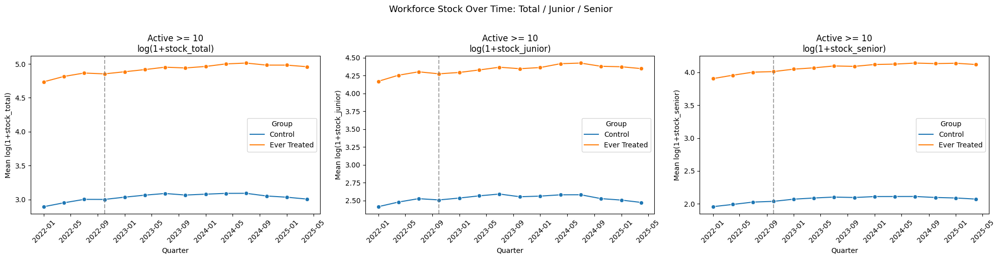

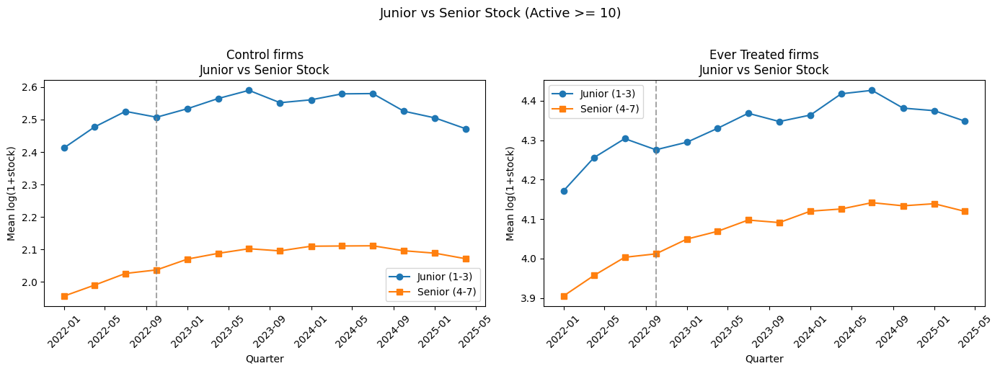

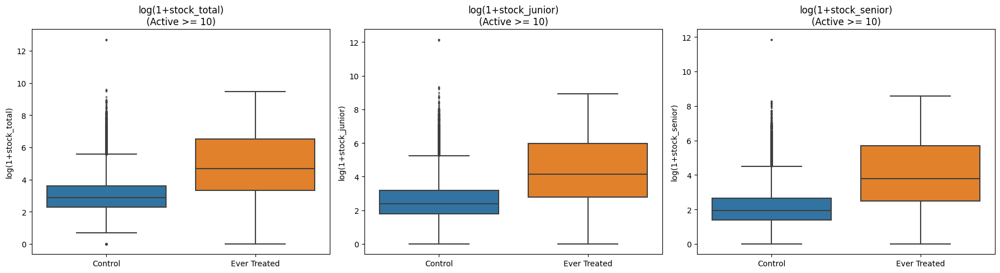

Saved: ../data/Positions/firm_quarter_stock_seniority_active_contained_ge10_chatgpt_treated.dta | Rows: 234,612

Building FLOW SENIORITY panel (Active >= 10)...


Flow seniority quarters: 100%|██████████| 14/14 [00:02<00:00,  6.20it/s]


  Firms: 16,758 | Treated: 248 | Control: 16,510

Quarterly averages — new_hires_total:
quarter    Treatment      mean  median  n_firms
 2022Q1      Control  6.842944     2.0    16510
 2022Q1 Ever Treated 76.600806    10.5      248
 2022Q2      Control  6.641975     2.0    16510
 2022Q2 Ever Treated 78.810484    12.0      248
 2022Q3      Control  6.882253     2.0    16510
 2022Q3 Ever Treated 83.112903    13.0      248
 2022Q4      Control  4.637492     1.0    16510
 2022Q4 Ever Treated 51.403226     9.0      248
 2023Q1      Control  5.996063     2.0    16510
 2023Q1 Ever Treated 61.459677     9.0      248
 2023Q2      Control  5.442277     2.0    16510
 2023Q2 Ever Treated 55.467742     8.0      248
 2023Q3      Control  5.556511     2.0    16510
 2023Q3 Ever Treated 62.487903     9.0      248
 2023Q4      Control  3.426590     1.0    16510
 2023Q4 Ever Treated 36.330645     6.0      248
 2024Q1      Control  4.735191     1.0    16510
 2024Q1 Ever Treated 48.991935     8.5      248


c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

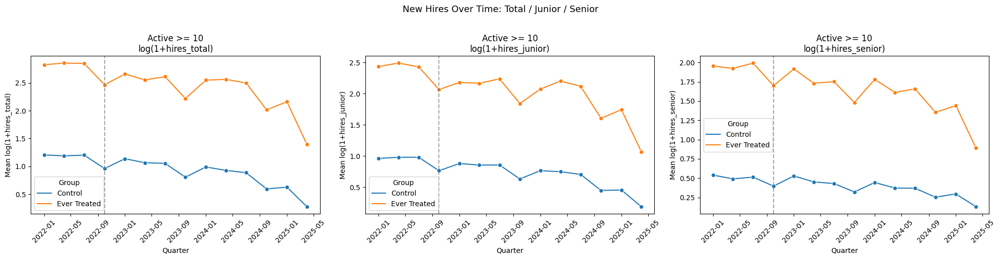

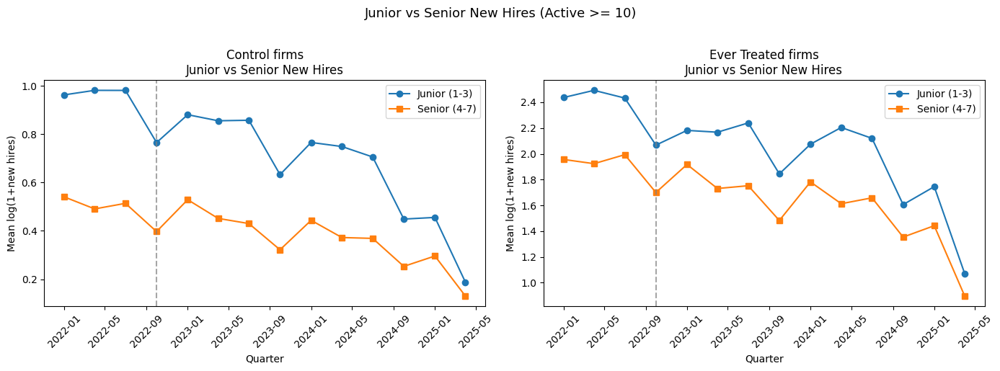

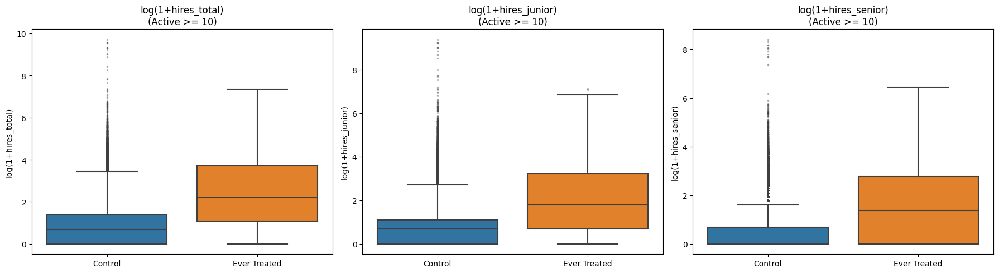

Saved: ../data/Positions/firm_quarter_flow_seniority_active_contained_ge10_chatgpt_treated.dta | Rows: 234,612

THRESHOLD: >= 15 hires

Building STOCK SENIORITY panel (Active >= 15)...


Stock seniority quarters: 100%|██████████| 14/14 [00:20<00:00,  1.45s/it]


  Firms: 12,090 | Treated: 235 | Control: 11,855

Quarterly averages — stock_total:
quarter    Treatment       mean  median  n_firms
 2022Q1      Control  96.635344    22.0    11855
 2022Q1 Ever Treated 774.080851   123.0      235
 2022Q2      Control  98.333277    23.0    11855
 2022Q2 Ever Treated 798.272340   126.0      235
 2022Q3      Control 100.015690    24.0    11855
 2022Q3 Ever Treated 816.306383   126.0      235
 2022Q4      Control  98.647744    23.0    11855
 2022Q4 Ever Treated 798.514894   127.0      235
 2023Q1      Control  99.686799    24.0    11855
 2023Q1 Ever Treated 803.476596   128.0      235
 2023Q2      Control 100.574694    24.0    11855
 2023Q2 Ever Treated 813.638298   131.0      235
 2023Q3      Control 101.392240    24.0    11855
 2023Q3 Ever Treated 823.080851   140.0      235
 2023Q4      Control  99.271784    24.0    11855
 2023Q4 Ever Treated 801.914894   131.0      235
 2024Q1      Control  99.579334    24.0    11855
 2024Q1 Ever Treated 805.165957   

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

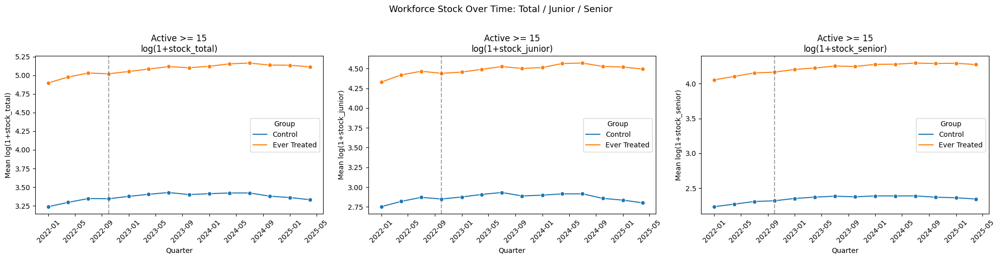

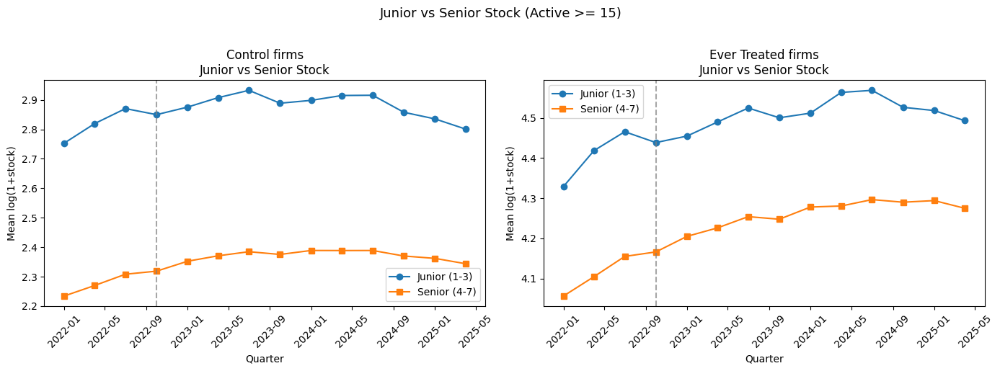

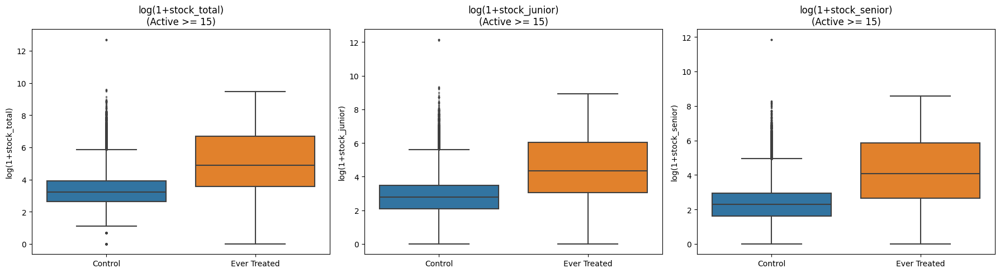

Saved: ../data/Positions/firm_quarter_stock_seniority_active_contained_ge15_chatgpt_treated.dta | Rows: 169,260

Building FLOW SENIORITY panel (Active >= 15)...


Flow seniority quarters: 100%|██████████| 14/14 [00:04<00:00,  3.47it/s]


  Firms: 12,090 | Treated: 235 | Control: 11,855

Quarterly averages — new_hires_total:
quarter    Treatment      mean  median  n_firms
 2022Q1      Control  9.105863     3.0    11855
 2022Q1 Ever Treated 80.787234    13.0      235
 2022Q2      Control  8.853986     3.0    11855
 2022Q2 Ever Treated 83.097872    14.0      235
 2022Q3      Control  9.188275     3.0    11855
 2022Q3 Ever Treated 87.672340    14.0      235
 2022Q4      Control  6.180177     2.0    11855
 2022Q4 Ever Treated 54.221277    11.0      235
 2023Q1      Control  7.967524     3.0    11855
 2023Q1 Ever Treated 64.812766    11.0      235
 2023Q2      Control  7.249093     2.0    11855
 2023Q2 Ever Treated 58.514894    11.0      235
 2023Q3      Control  7.406748     2.0    11855
 2023Q3 Ever Treated 65.910638    11.0      235
 2023Q4      Control  4.550485     1.0    11855
 2023Q4 Ever Treated 38.319149     7.0      235
 2024Q1      Control  6.292366     2.0    11855
 2024Q1 Ever Treated 51.659574     9.0      235


c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

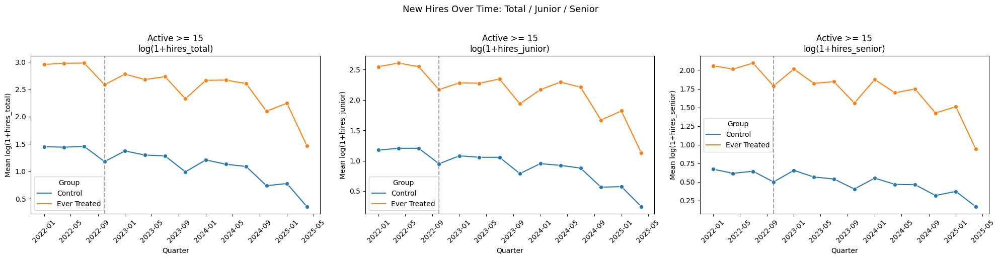

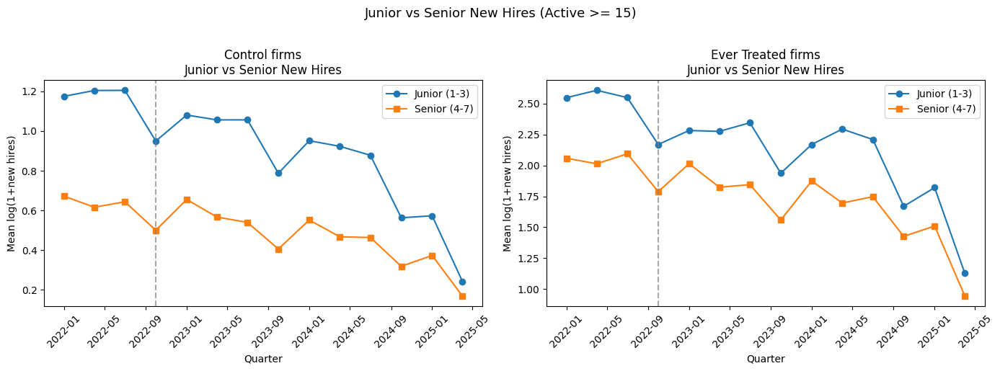

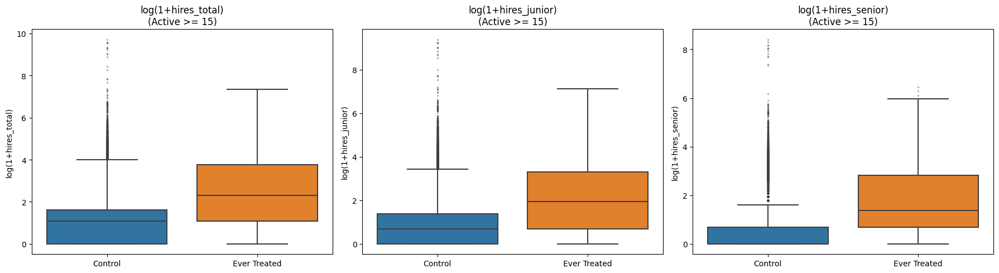

Saved: ../data/Positions/firm_quarter_flow_seniority_active_contained_ge15_chatgpt_treated.dta | Rows: 169,260

THRESHOLD: >= 20 hires

Building STOCK SENIORITY panel (Active >= 20)...


Stock seniority quarters: 100%|██████████| 14/14 [00:31<00:00,  2.25s/it]


  Firms: 9,346 | Treated: 224 | Control: 9,122

Quarterly averages — stock_total:
quarter    Treatment       mean  median  n_firms
 2022Q1      Control 121.635168    29.0     9122
 2022Q1 Ever Treated 811.665179   155.5      224
 2022Q2      Control 123.730761    30.0     9122
 2022Q2 Ever Treated 837.000000   152.0      224
 2022Q3      Control 125.820873    31.0     9122
 2022Q3 Ever Treated 855.892857   157.0      224
 2022Q4      Control 124.104363    31.0     9122
 2022Q4 Ever Treated 837.245536   153.0      224
 2023Q1      Control 125.395747    31.0     9122
 2023Q1 Ever Treated 842.446429   156.5      224
 2023Q2      Control 126.484104    32.0     9122
 2023Q2 Ever Treated 853.044643   160.0      224
 2023Q3      Control 127.485420    32.0     9122
 2023Q3 Ever Treated 862.919643   163.0      224
 2023Q4      Control 124.811774    31.0     9122
 2023Q4 Ever Treated 840.732143   164.5      224
 2024Q1      Control 125.163999    31.0     9122
 2024Q1 Ever Treated 844.093750   16

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

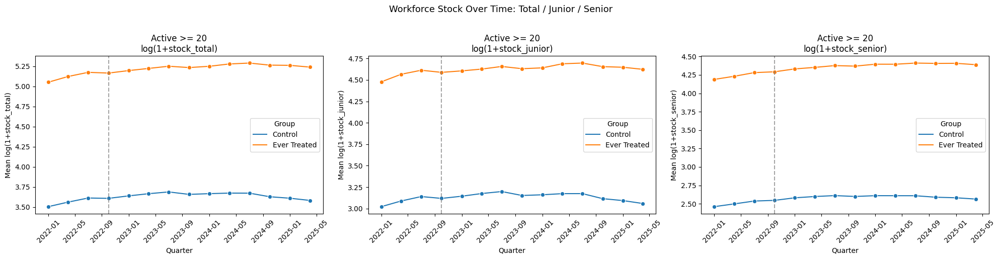

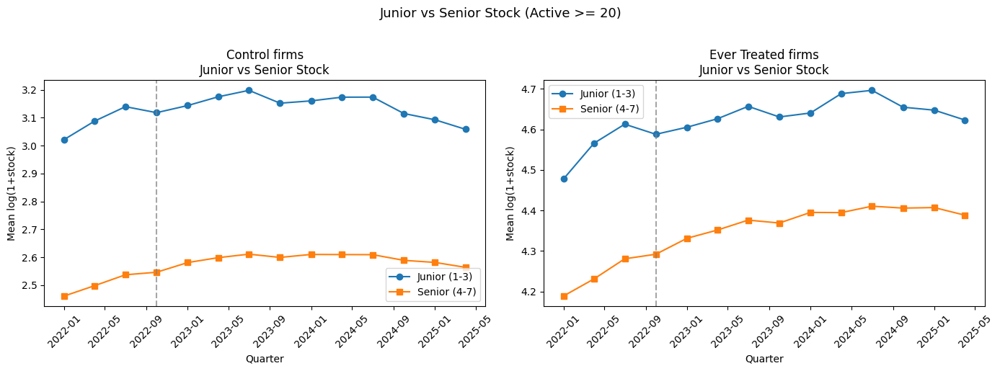

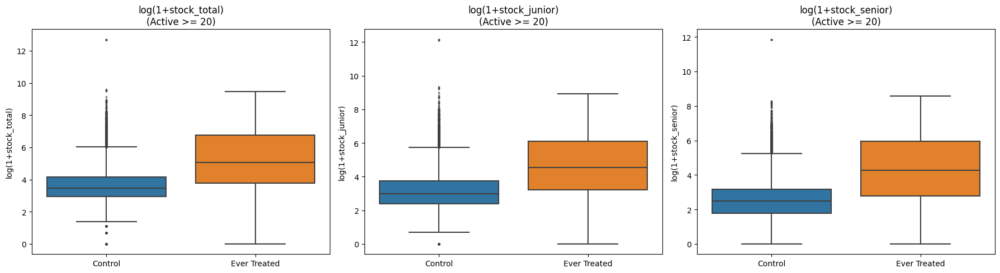

Saved: ../data/Positions/firm_quarter_stock_seniority_active_contained_ge20_chatgpt_treated.dta | Rows: 130,844

Building FLOW SENIORITY panel (Active >= 20)...


Flow seniority quarters: 100%|██████████| 14/14 [00:03<00:00,  4.16it/s]


  Firms: 9,346 | Treated: 224 | Control: 9,122

Quarterly averages — new_hires_total:
quarter    Treatment      mean  median  n_firms
 2022Q1      Control 11.377658     4.0     9122
 2022Q1 Ever Treated 84.687500    16.0      224
 2022Q2      Control 11.056676     4.0     9122
 2022Q2 Ever Treated 87.111607    16.0      224
 2022Q3      Control 11.499342     4.0     9122
 2022Q3 Ever Treated 91.924107    16.5      224
 2022Q4      Control  7.720237     3.0     9122
 2022Q4 Ever Treated 56.861607    12.0      224
 2023Q1      Control  9.946174     3.0     9122
 2023Q1 Ever Treated 67.959821    14.5      224
 2023Q2      Control  9.044617     3.0     9122
 2023Q2 Ever Treated 61.299107    13.5      224
 2023Q3      Control  9.265402     3.0     9122
 2023Q3 Ever Treated 69.089286    12.5      224
 2023Q4      Control  5.666630     2.0     9122
 2023Q4 Ever Treated 40.138393     8.0      224
 2024Q1      Control  7.818790     3.0     9122
 2024Q1 Ever Treated 54.107143    11.0      224
 2

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

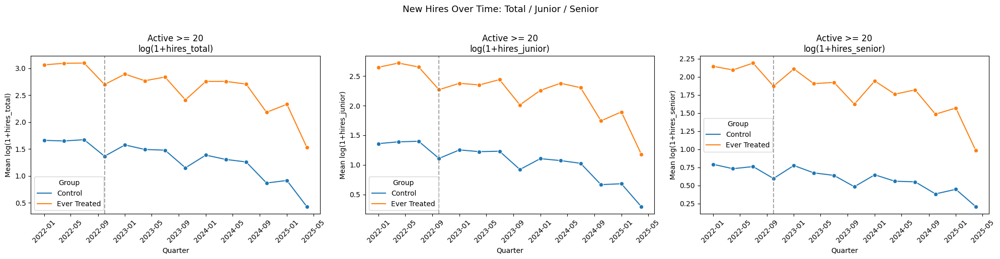

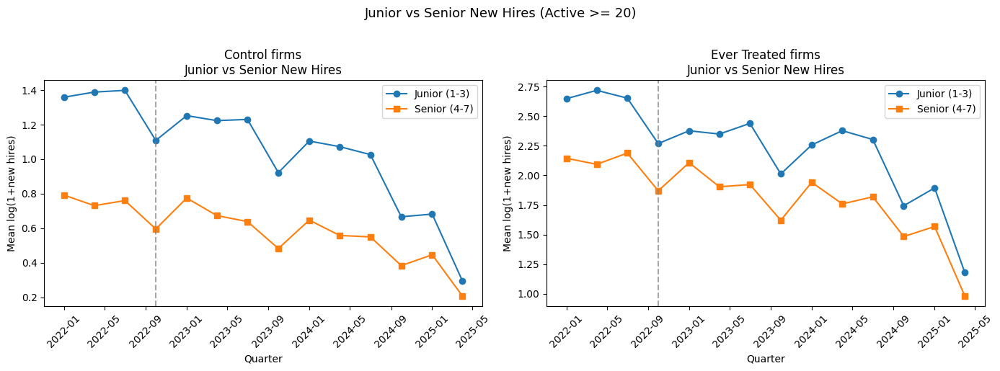

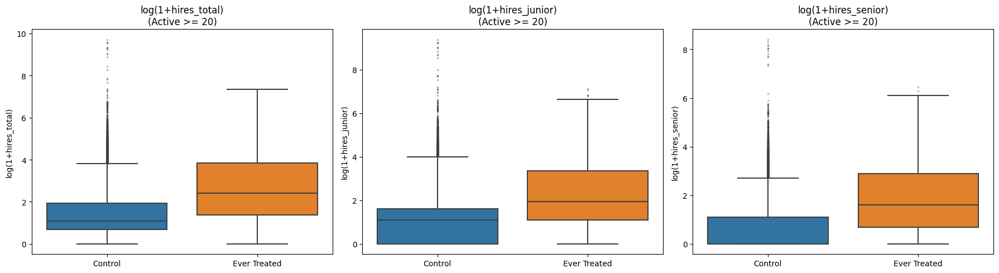

Saved: ../data/Positions/firm_quarter_flow_seniority_active_contained_ge20_chatgpt_treated.dta | Rows: 130,844


In [22]:
# =============================================================
# MAIN: extend the existing run loop to include seniority panels
# =============================================================

for thr in THRESHOLDS:
    print(f"\n{'='*60}")
    print(f"THRESHOLD: >= {thr} hires")
    print(f"{'='*60}")

    active_firms = get_active_firms(clean_positions, HIRE_START, HIRE_END, thr)

    build_stock_panel_seniority(
        positions=clean_positions, treated_firms=treated_firms, active_firms=active_firms,
        panel_start_q=PANEL_START, panel_end_q=PANEL_END, treat_q=TREAT_Q,
        active_threshold=thr, out_path=f"{OUT_DIR}firm_quarter_stock_seniority_active_contained_ge{thr}_chatgpt_treated.dta",
    )
    build_flow_panel_seniority(
        positions=clean_positions, treated_firms=treated_firms, active_firms=active_firms,
        panel_start_q=PANEL_START, panel_end_q=PANEL_END, treat_q=TREAT_Q,
        active_threshold=thr, out_path=f"{OUT_DIR}firm_quarter_flow_seniority_active_contained_ge{thr}_chatgpt_treated.dta",
    )

Understanding SEPARATIONS


THRESHOLD: >= 0 hires
Active firms: 106,085

Building SEPARATIONS panel (Active >= 0)...


Separations quarters: 100%|██████████| 14/14 [00:03<00:00,  4.34it/s]


  Firms: 106,085 | Treated: 289 | Control: 105,796

Quarterly averages (Separations):
quarter    Treatment      mean  median  n_firms
 2022Q1      Control  0.736616     0.0   105796
 2022Q1 Ever Treated 33.768166     3.0      289
 2022Q2      Control  0.775388     0.0   105796
 2022Q2 Ever Treated 39.910035     4.0      289
 2022Q3      Control  0.861016     0.0   105796
 2022Q3 Ever Treated 46.366782     5.0      289
 2022Q4      Control  0.691869     0.0   105796
 2022Q4 Ever Treated 32.768166     4.0      289
 2023Q1      Control  0.661310     0.0   105796
 2023Q1 Ever Treated 27.778547     4.0      289
 2023Q2      Control  0.680196     0.0   105796
 2023Q2 Ever Treated 31.508651     4.0      289
 2023Q3      Control  0.767127     0.0   105796
 2023Q3 Ever Treated 38.743945     4.0      289
 2023Q4      Control  0.597508     0.0   105796
 2023Q4 Ever Treated 25.958478     3.0      289
 2024Q1      Control  0.563925     0.0   105796
 2024Q1 Ever Treated 22.249135     3.0      289
 2

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

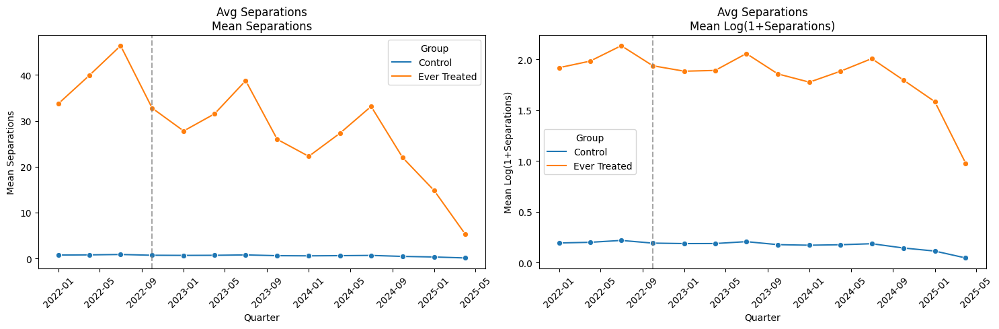

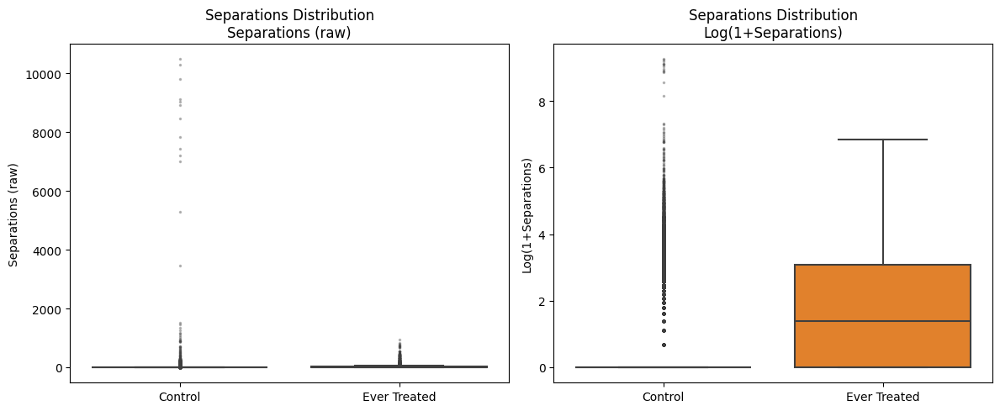

Saved: ../data/Positions/firm_quarter_separations_active_contained_ge0_chatgpt_treated.dta | Rows: 1,485,190

THRESHOLD: >= 5 hires
Active firms: 28,043

Building SEPARATIONS panel (Active >= 5)...


Separations quarters: 100%|██████████| 14/14 [00:02<00:00,  6.04it/s]


  Firms: 28,043 | Treated: 269 | Control: 27,774

Quarterly averages (Separations):
quarter    Treatment      mean  median  n_firms
 2022Q1      Control  2.571938     0.0    27774
 2022Q1 Ever Treated 36.267658     4.0      269
 2022Q2      Control  2.725859     0.0    27774
 2022Q2 Ever Treated 42.873606     5.0      269
 2022Q3      Control  3.039677     1.0    27774
 2022Q3 Ever Treated 49.806691     6.0      269
 2022Q4      Control  2.423094     0.0    27774
 2022Q4 Ever Treated 35.185874     5.0      269
 2023Q1      Control  2.308958     0.0    27774
 2023Q1 Ever Treated 29.843866     4.0      269
 2023Q2      Control  2.399006     0.0    27774
 2023Q2 Ever Treated 33.843866     4.0      269
 2023Q3      Control  2.717146     1.0    27774
 2023Q3 Ever Treated 41.613383     5.0      269
 2023Q4      Control  2.092821     0.0    27774
 2023Q4 Ever Treated 27.873606     4.0      269
 2024Q1      Control  1.969648     0.0    27774
 2024Q1 Ever Treated 23.899628     4.0      269
 202

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

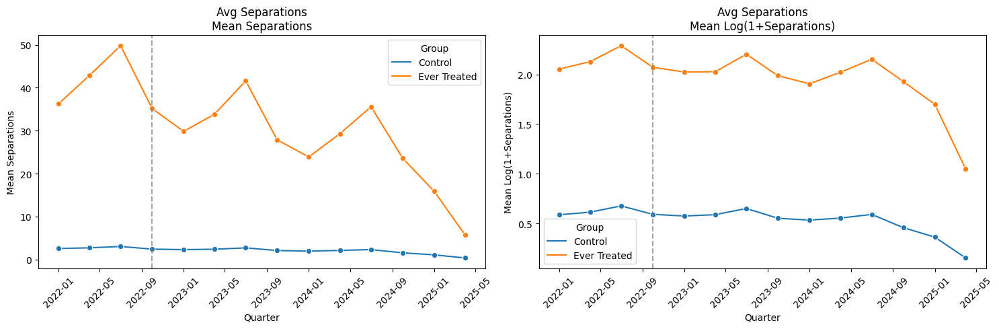

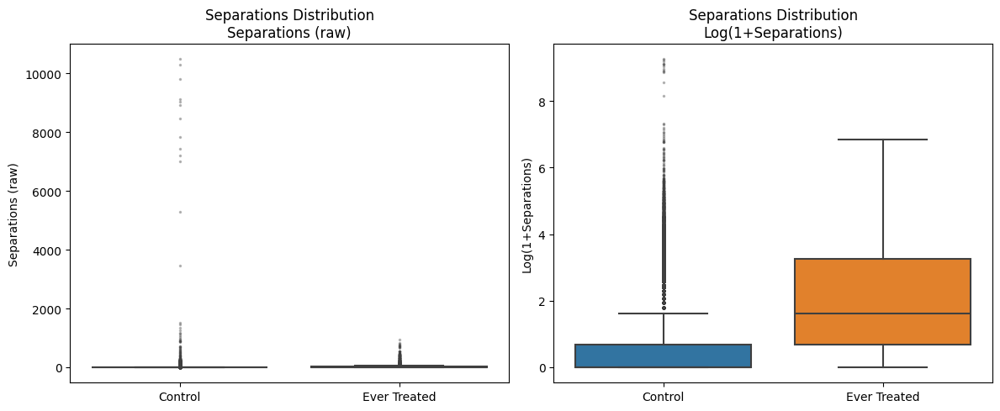

Saved: ../data/Positions/firm_quarter_separations_active_contained_ge5_chatgpt_treated.dta | Rows: 392,602

THRESHOLD: >= 10 hires
Active firms: 16,758

Building SEPARATIONS panel (Active >= 10)...


Separations quarters: 100%|██████████| 14/14 [00:02<00:00,  6.18it/s]


  Firms: 16,758 | Treated: 248 | Control: 16,510

Quarterly averages (Separations):
quarter    Treatment      mean  median  n_firms
 2022Q1      Control  4.079285     1.0    16510
 2022Q1 Ever Treated 39.322581     6.0      248
 2022Q2      Control  4.335373     1.0    16510
 2022Q2 Ever Treated 46.495968     6.0      248
 2022Q3      Control  4.838583     1.0    16510
 2022Q3 Ever Treated 54.000000     8.0      248
 2022Q4      Control  3.837553     1.0    16510
 2022Q4 Ever Treated 38.157258     5.5      248
 2023Q1      Control  3.654512     1.0    16510
 2023Q1 Ever Treated 32.334677     5.0      248
 2023Q2      Control  3.811024     1.0    16510
 2023Q2 Ever Treated 36.697581     5.0      248
 2023Q3      Control  4.320533     1.0    16510
 2023Q3 Ever Treated 45.129032     7.0      248
 2023Q4      Control  3.307511     1.0    16510
 2023Q4 Ever Treated 30.205645     5.0      248
 2024Q1      Control  3.108298     1.0    16510
 2024Q1 Ever Treated 25.903226     5.0      248
 202

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

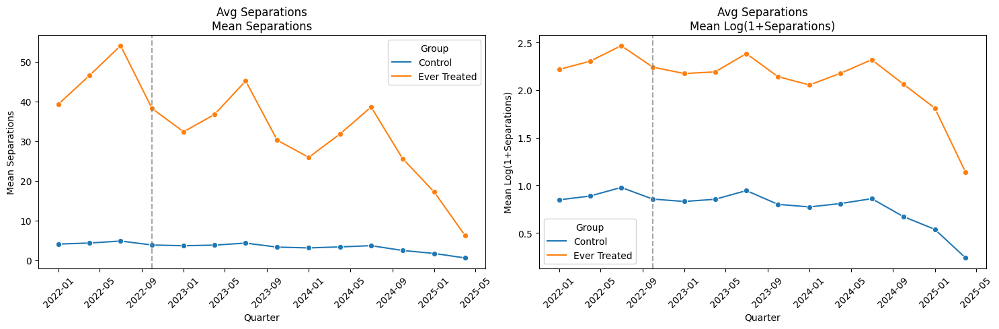

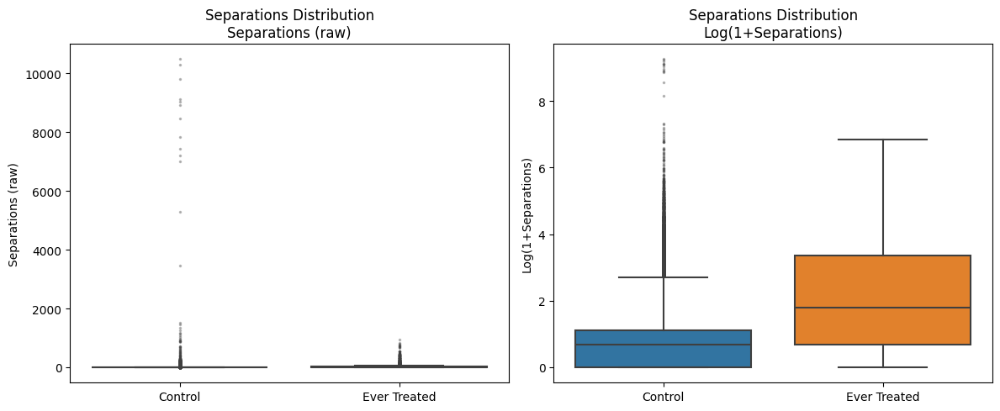

Saved: ../data/Positions/firm_quarter_separations_active_contained_ge10_chatgpt_treated.dta | Rows: 234,612

THRESHOLD: >= 15 hires
Active firms: 12,090

Building SEPARATIONS panel (Active >= 15)...


Separations quarters: 100%|██████████| 14/14 [00:02<00:00,  6.46it/s]


  Firms: 12,090 | Treated: 235 | Control: 11,855

Quarterly averages (Separations):
quarter    Treatment      mean  median  n_firms
 2022Q1      Control  5.420582     2.0    11855
 2022Q1 Ever Treated 41.463830     7.0      235
 2022Q2      Control  5.772923     2.0    11855
 2022Q2 Ever Treated 49.042553     8.0      235
 2022Q3      Control  6.426993     2.0    11855
 2022Q3 Ever Treated 56.948936    10.0      235
 2022Q4      Control  5.086630     2.0    11855
 2022Q4 Ever Treated 40.246809     7.0      235
 2023Q1      Control  4.849684     1.0    11855
 2023Q1 Ever Treated 34.106383     7.0      235
 2023Q2      Control  5.077098     2.0    11855
 2023Q2 Ever Treated 38.719149     6.0      235
 2023Q3      Control  5.752425     2.0    11855
 2023Q3 Ever Treated 47.604255     8.0      235
 2023Q4      Control  4.387853     1.0    11855
 2023Q4 Ever Treated 31.859574     7.0      235
 2024Q1      Control  4.122733     1.0    11855
 2024Q1 Ever Treated 27.302128     6.0      235
 202

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

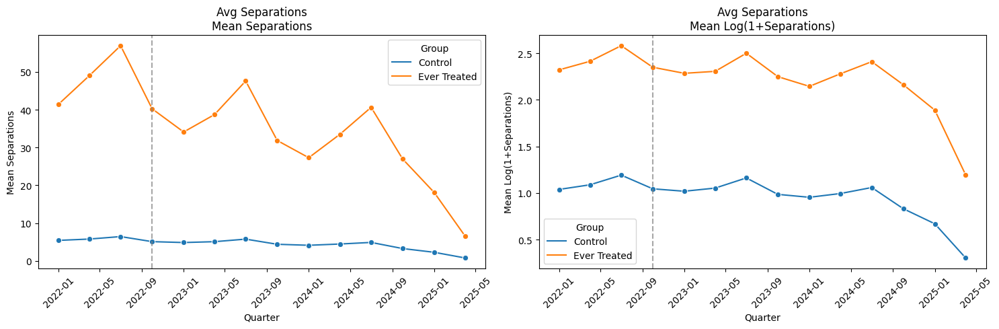

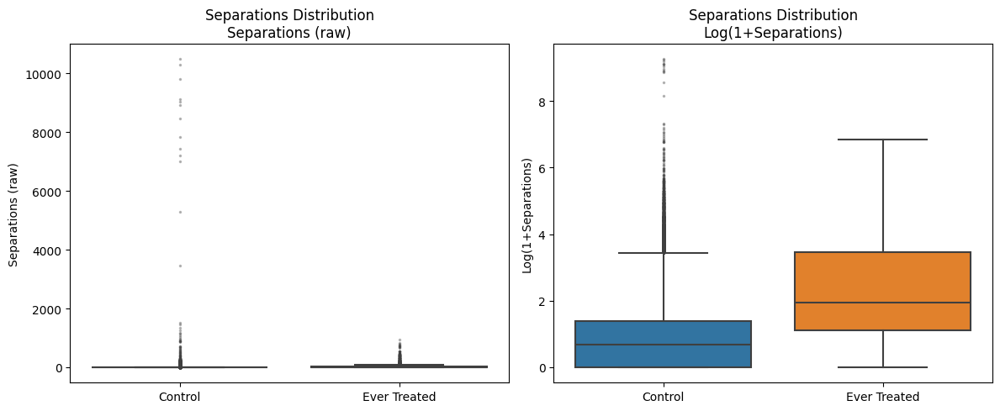

Saved: ../data/Positions/firm_quarter_separations_active_contained_ge15_chatgpt_treated.dta | Rows: 169,260

THRESHOLD: >= 20 hires
Active firms: 9,346

Building SEPARATIONS panel (Active >= 20)...


Separations quarters: 100%|██████████| 14/14 [00:02<00:00,  6.83it/s]


  Firms: 9,346 | Treated: 224 | Control: 9,122

Quarterly averages (Separations):
quarter    Treatment      mean  median  n_firms
 2022Q1      Control  6.756852     2.0     9122
 2022Q1 Ever Treated 43.482143     9.0      224
 2022Q2      Control  7.212892     2.0     9122
 2022Q2 Ever Treated 51.433036    10.0      224
 2022Q3      Control  8.013484     3.0     9122
 2022Q3 Ever Treated 59.709821    11.0      224
 2022Q4      Control  6.333918     2.0     9122
 2022Q4 Ever Treated 42.196429     9.0      224
 2023Q1      Control  6.040013     2.0     9122
 2023Q1 Ever Treated 35.758929     7.5      224
 2023Q2      Control  6.346635     2.0     9122
 2023Q2 Ever Treated 40.593750     7.0      224
 2023Q3      Control  7.174633     3.0     9122
 2023Q3 Ever Treated 49.861607    10.0      224
 2023Q4      Control  5.461193     2.0     9122
 2023Q4 Ever Treated 33.397321     7.0      224
 2024Q1      Control  5.135058     2.0     9122
 2024Q1 Ever Treated 28.638393     6.0      224
 2024Q

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

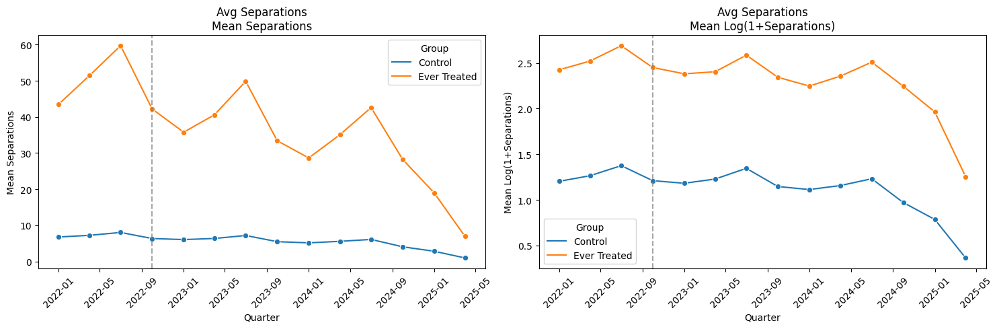

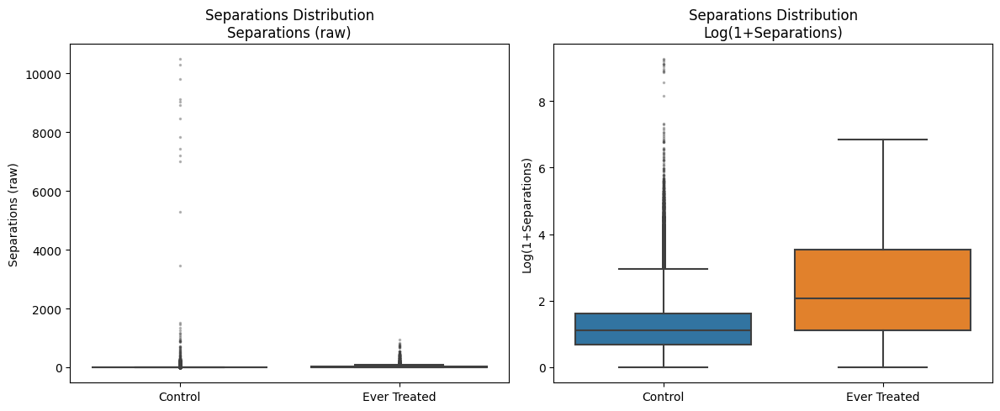

Saved: ../data/Positions/firm_quarter_separations_active_contained_ge20_chatgpt_treated.dta | Rows: 130,844


In [23]:
# ------------------------------------------------------------
# Helpers (shared by stock / flow / separations)
# ------------------------------------------------------------

def make_firm_quarter_grid(active_firms: set, quarters: pd.PeriodIndex) -> pd.DataFrame:
    return (
        pd.DataFrame({"company_name": sorted(active_firms)}).assign(_tmp=1)
        .merge(pd.DataFrame({"quarter": quarters}).assign(_tmp=1), on="_tmp")
        .drop(columns="_tmp")
    )

def add_common_panel_columns(panel: pd.DataFrame, treated_firms: set, treat_q: str) -> pd.DataFrame:
    stata_epoch = pd.Period("1960Q1", freq="Q")
    panel = panel.copy()
    panel["treated"]      = panel["company_name"].isin(treated_firms).astype(int)
    panel["Treatment"]    = panel["treated"].map({0: "Control", 1: "Ever Treated"})
    panel["post"]         = (panel["quarter"] >= pd.Period(treat_q, freq="Q")).astype(int)
    panel["quarter_date"] = panel["quarter"].dt.to_timestamp()
    panel["firm_id"]      = panel["company_name"].astype("category").cat.codes + 1
    panel["tq"]           = panel["quarter"].apply(lambda p: (p - stata_epoch).n).astype(int)
    return panel

def plot_mean_and_box(panel: pd.DataFrame, value_col: str, log_col: str, cutoff_q: str, title_prefix: str, out_prefix: str):
    cutoff = pd.Period(cutoff_q, freq="Q").to_timestamp()

    fig, axes = plt.subplots(1, 2, figsize=(15, 5))
    for ax, col, ylabel in zip(
        axes,
        [value_col, log_col],
        [f"Mean {title_prefix}", f"Mean Log(1+{title_prefix})"],
    ):
        plot_data = panel.groupby(["quarter_date", "Treatment"])[col].mean().reset_index()
        sns.lineplot(data=plot_data, x="quarter_date", y=col, hue="Treatment", marker="o", ax=ax)
        ax.axvline(cutoff, linestyle="--", color="grey", alpha=0.7)
        ax.set_title(f"Avg {title_prefix}\n{ylabel}")
        ax.set_xlabel("Quarter")
        ax.set_ylabel(ylabel)
        ax.tick_params(axis="x", rotation=45)
        ax.legend(title="Group")
    plt.tight_layout()
    plt.savefig(f"{out_prefix}_line.png", dpi=150)
    plt.show()

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    for ax, col, ylabel in zip(
        axes,
        [value_col, log_col],
        [f"{title_prefix} (raw)", f"Log(1+{title_prefix})"],
    ):
        sns.boxplot(
            data=panel, x="Treatment", y=col,
            order=["Control", "Ever Treated"], ax=ax,
            flierprops=dict(marker=".", alpha=0.3, markersize=3),
        )
        ax.set_title(f"{title_prefix} Distribution\n{ylabel}")
        ax.set_xlabel("")
        ax.set_ylabel(ylabel)
    plt.tight_layout()
    plt.savefig(f"{out_prefix}_box.png", dpi=150)
    plt.show()

def build_firm_quarter_panel_from_events(
    positions: pd.DataFrame,
    treated_firms: set,
    active_firms: set,
    panel_start_q: str,
    panel_end_q: str,
    treat_q: str,
    active_threshold: int,
    out_path: str,
    event_extractor,           # function(pos_subset, quarter) -> df(company_name, value)
    value_col: str,
    make_plots: bool = True,
    plot_title: str = "",
    plot_out_prefix: str = "",
) -> tuple:
    quarters = pd.period_range(panel_start_q, panel_end_q, freq="Q")

    # Important: only subset to active_firms AFTER any “global” annotations are already computed
    pos = positions[positions["company_name"].isin(active_firms)].copy()

    print(f"\nBuilding {plot_title.upper()} panel (Active >= {active_threshold})...")
    pieces = []
    for q in tqdm(quarters, desc=f"{plot_title} quarters"):
        out = event_extractor(pos, q)
        out["quarter"] = q
        pieces.append(out)

    panel = pd.concat(pieces, ignore_index=True) if len(pieces) else pd.DataFrame(columns=["company_name", value_col, "quarter"])
    full = make_firm_quarter_grid(active_firms, quarters)
    panel = full.merge(panel, on=["company_name", "quarter"], how="left")
    panel[value_col] = panel[value_col].fillna(0).astype(int)

    panel = add_common_panel_columns(panel, treated_firms, treat_q)
    log_col = f"log_{value_col}"
    panel[log_col] = np.log1p(panel[value_col])

    print(f"  Firms: {panel['company_name'].nunique():,} | "
          f"Treated: {panel.loc[panel['treated']==1,'company_name'].nunique():,} | "
          f"Control: {panel.loc[panel['treated']==0,'company_name'].nunique():,}")

    quarterly_avg = (
        panel.groupby(["quarter", "Treatment"])[value_col]
        .agg(mean="mean", median="median", n_firms="count")
        .reset_index()
    )
    print(f"\nQuarterly averages ({plot_title}):")
    print(quarterly_avg.to_string(index=False))

    if make_plots:
        plot_mean_and_box(
            panel=panel,
            value_col=value_col,
            log_col=log_col,
            cutoff_q=treat_q,
            title_prefix=plot_title,
            out_prefix=plot_out_prefix or f"{plot_title}_thr{active_threshold}",
        )

    # Minimal Stata export (match your style)
    stata_df = panel[["firm_id", "company_name", "tq", value_col, log_col, "treated", "post"]].copy()
    for c, t in [("firm_id", int), ("tq", int), ("treated", int), ("post", int),
                 (value_col, float), (log_col, float)]:
        stata_df[c] = stata_df[c].astype(t)

    pyreadstat.write_dta(stata_df, out_path, version=14)
    print(f"Saved: {out_path} | Rows: {len(stata_df):,}")

    return panel, stata_df


# ------------------------------------------------------------
# Separation-specific logic
# ------------------------------------------------------------

def annotate_next_employer(positions: pd.DataFrame) -> pd.DataFrame:
    """
    Adds next_company_name for each position spell, based on the worker's next chronological spell.
    This must be computed on the FULL cleaned positions (not restricted to active_firms),
    otherwise separations get misclassified as 'no next job'.
    """
    df = positions.copy()

    # Sort within user by startdate; break ties deterministically (enddate then company)
    df = df.sort_values(["user_id", "startdate", "enddate", "company_name"], kind="mergesort")

    # Next spell info for that user
    df["next_company_name"] = df.groupby("user_id")["company_name"].shift(-1)
    df["next_startdate"]    = df.groupby("user_id")["startdate"].shift(-1)

    return df

def separations_event_extractor(pos_subset: pd.DataFrame, q: pd.Period) -> pd.DataFrame:
    """
    For a given quarter, count separations by firm:
    separation if enddate in quarter AND (next company is different OR missing).
    Not a separation if next company is the same firm (internal move/promotion).
    """
    q_start = q.start_time
    next_q_start = (q + 1).start_time

    ended = pos_subset[
        pos_subset["enddate"].notna()
        & (pos_subset["enddate"] >= q_start)
        & (pos_subset["enddate"] < next_q_start)
    ].copy()

    is_exit = ended["next_company_name"].isna() | (ended["next_company_name"] != ended["company_name"])
    ended = ended[is_exit]

    out = (
        ended.groupby("company_name")["user_id"]
        .nunique()
        .reset_index()
        .rename(columns={"user_id": "separations"})
    )
    return out


def build_separations_panel(
    positions: pd.DataFrame,
    treated_firms: set,
    active_firms: set,
    panel_start_q: str,
    panel_end_q: str,
    treat_q: str,
    active_threshold: int,
    out_path: str,
    make_plots: bool = True,
) -> tuple:
    return build_firm_quarter_panel_from_events(
        positions=positions,
        treated_firms=treated_firms,
        active_firms=active_firms,
        panel_start_q=panel_start_q,
        panel_end_q=panel_end_q,
        treat_q=treat_q,
        active_threshold=active_threshold,
        out_path=out_path,
        event_extractor=separations_event_extractor,
        value_col="separations",
        make_plots=make_plots,
        plot_title="Separations",
        plot_out_prefix=f"separations_thr{active_threshold}",
    )


# ------------------------------------------------------------
# MAIN usage (matches your threshold loop, minimal changes)
# ------------------------------------------------------------

# After you already did:
# clean_positions = load_and_clean_positions(...)
# treated_firms = load_treated_firms(...)

# NEW: annotate next employer ONCE on the full cleaned positions
clean_positions_with_next = annotate_next_employer(clean_positions)

sep_results = {}

for thr in THRESHOLDS:
    print(f"\n{'='*60}")
    print(f"THRESHOLD: >= {thr} hires")
    print(f"{'='*60}")

    active_firms = get_active_firms(clean_positions_with_next, HIRE_START, HIRE_END, thr)
    print(f"Active firms: {len(active_firms):,}")

    sep_panel, _ = build_separations_panel(
        positions=clean_positions_with_next,
        treated_firms=treated_firms,
        active_firms=active_firms,
        panel_start_q=PANEL_START,
        panel_end_q=PANEL_END,
        treat_q=TREAT_Q,
        active_threshold=thr,
        out_path=f"{OUT_DIR}firm_quarter_separations_active_contained_ge{thr}_chatgpt_treated.dta",
        make_plots=True,
    )

    sep_results[thr] = sep_panel

In [29]:
def build_separations_panel_seniority(
    positions: pd.DataFrame,
    treated_firms: set,
    active_firms: set,
    panel_start_q: str,
    panel_end_q: str,
    treat_q: str,
    active_threshold: int,
    out_path: str,
    make_plots: bool = True,
) -> tuple:
    quarters = pd.period_range(panel_start_q, panel_end_q, freq="Q")
    cutoff = pd.Period(treat_q, freq="Q").to_timestamp()
    stata_epoch = pd.Period("1960Q1", freq="Q")

    # Filter + seniority indicators
    pos = positions[positions["company_name"].isin(active_firms)].copy()
    pos = pos[pos["seniority"].between(1, 7)].copy()
    pos["is_junior"] = pos["seniority"].between(1, 3).astype(int)
    pos["is_senior"] = pos["seniority"].between(4, 7).astype(int)

    if "next_company_name" not in pos.columns:
        raise ValueError("positions must include 'next_company_name'. Run annotate_next_employer() once before building separations panels.")

    print(f"\nBuilding SEPARATIONS SENIORITY panel (Active >= {active_threshold})...")
    sep_list = []
    for q in tqdm(quarters, desc="Separations seniority quarters"):
        q_start = q.start_time
        next_q_start = (q + 1).start_time

        ended = pos[
            pos["enddate"].notna()
            & (pos["enddate"] >= q_start)
            & (pos["enddate"] < next_q_start)
        ].copy()

        # Exit from firm if next employer is different OR missing (not an internal move)
        is_exit = ended["next_company_name"].isna() | (ended["next_company_name"] != ended["company_name"])
        ended = ended[is_exit]

        results = {}
        for label, mask in [
            ("separations_total",  pd.Series(True, index=ended.index)),
            ("separations_junior", ended["is_junior"] == 1),
            ("separations_senior", ended["is_senior"] == 1),
        ]:
            results[label] = (
                ended[mask]
                .groupby("company_name")["user_id"]
                .nunique()
                .rename(label)
            )

        quarter_df = (
            pd.DataFrame(results["separations_total"])
            .join(results["separations_junior"], how="left")
            .join(results["separations_senior"], how="left")
            .fillna(0)
            .astype(int)
            .reset_index()
        )
        quarter_df["quarter"] = q
        sep_list.append(quarter_df)

    sep_panel = pd.concat(sep_list, ignore_index=True)

    # Balance
    full = (
        pd.DataFrame({"company_name": sorted(active_firms)}).assign(_tmp=1)
        .merge(pd.DataFrame({"quarter": quarters}).assign(_tmp=1), on="_tmp")
        .drop(columns="_tmp")
    )
    panel = full.merge(sep_panel, on=["company_name", "quarter"], how="left")
    for c in ["separations_total", "separations_junior", "separations_senior"]:
        panel[c] = panel[c].fillna(0).astype(int)

    # Treatment + derived columns
    panel["treated"]      = panel["company_name"].isin(treated_firms).astype(int)
    panel["Treatment"]    = panel["treated"].map({0: "Control", 1: "Ever Treated"})
    panel["post"]         = (panel["quarter"] >= pd.Period(treat_q, freq="Q")).astype(int)
    panel["quarter_date"] = panel["quarter"].dt.to_timestamp()
    panel["firm_id"]      = panel["company_name"].astype("category").cat.codes + 1
    panel["tq"]           = panel["quarter"].apply(lambda p: (p - stata_epoch).n).astype(int)

    for raw, log in [
        ("separations_total", "log_separations_total"),
        ("separations_junior", "log_separations_junior"),
        ("separations_senior", "log_separations_senior"),
    ]:
        panel[log] = np.log1p(panel[raw])

    # Summary
    print(f"  Firms: {panel['company_name'].nunique():,} | Treated: {panel.loc[panel['treated']==1,'company_name'].nunique():,} | Control: {panel.loc[panel['treated']==0,'company_name'].nunique():,}")
    for col in ["separations_total", "separations_junior", "separations_senior"]:
        avg = panel.groupby(["quarter", "Treatment"])[col].agg(mean="mean", median="median", n_firms="count").reset_index()
        print(f"\nQuarterly averages — {col}:\n{avg.to_string(index=False)}")

    # Plots (same style as your stock/flow seniority)
    if make_plots:
        log_cols   = ["log_separations_total", "log_separations_junior", "log_separations_senior"]
        log_labels = ["log(1+seps_total)", "log(1+seps_junior)", "log(1+seps_senior)"]

        fig, axes = plt.subplots(1, 3, figsize=(20, 5))
        for ax, col, ylabel in zip(axes, log_cols, log_labels):
            plot_data = panel.groupby(["quarter_date", "Treatment"])[col].mean().reset_index()
            sns.lineplot(data=plot_data, x="quarter_date", y=col, hue="Treatment", marker="o", ax=ax)
            ax.axvline(cutoff, linestyle="--", color="grey", alpha=0.7)
            ax.set_title(f"Active >= {active_threshold}\n{ylabel}")
            ax.set_xlabel("Quarter")
            ax.set_ylabel(f"Mean {ylabel}")
            ax.tick_params(axis="x", rotation=45)
            ax.legend(title="Group")
        plt.suptitle("Separations Over Time: Total / Junior / Senior", fontsize=13, y=1.02)
        plt.tight_layout()
        plt.savefig(f"separations_seniority_line_thr{active_threshold}.png", dpi=150)
        plt.show()

        fig, axes = plt.subplots(1, 2, figsize=(14, 5))
        for ax, label in zip(axes, ["Control", "Ever Treated"]):
            subset = panel[panel["Treatment"] == label]
            for col, marker, lbl in [("log_separations_junior", "o", "Junior (1-3)"), ("log_separations_senior", "s", "Senior (4-7)")]:
                plot_data = subset.groupby("quarter_date")[col].mean().reset_index()
                ax.plot(plot_data["quarter_date"], plot_data[col], marker=marker, label=lbl)
            ax.axvline(cutoff, linestyle="--", color="grey", alpha=0.7)
            ax.set_title(f"{label} firms\nJunior vs Senior Separations")
            ax.set_xlabel("Quarter")
            ax.set_ylabel("Mean log(1+separations)")
            ax.tick_params(axis="x", rotation=45)
            ax.legend()
        plt.suptitle(f"Junior vs Senior Separations (Active >= {active_threshold})", fontsize=13, y=1.02)
        plt.tight_layout()
        plt.savefig(f"separations_junior_vs_senior_thr{active_threshold}.png", dpi=150)
        plt.show()

        fig, axes = plt.subplots(1, 3, figsize=(18, 5))
        for ax, col, ylabel in zip(axes, log_cols, log_labels):
            sns.boxplot(data=panel, x="Treatment", y=col, order=["Control", "Ever Treated"], ax=ax, flierprops=dict(marker=".", alpha=0.3, markersize=3))
            ax.set_title(f"{ylabel}\n(Active >= {active_threshold})")
            ax.set_xlabel("")
            ax.set_ylabel(ylabel)
        plt.tight_layout()
        plt.savefig(f"separations_seniority_box_thr{active_threshold}.png", dpi=150)
        plt.show()

    # Save
    out_cols = ["firm_id", "company_name", "tq", "treated", "post",
                "separations_total", "separations_junior", "separations_senior",
                "log_separations_total", "log_separations_junior", "log_separations_senior"]
    stata_df = panel[out_cols].copy()
    for c, t in [("firm_id", int), ("tq", int), ("treated", int), ("post", int)]:
        stata_df[c] = stata_df[c].astype(t)
    for c in ["separations_total", "separations_junior", "separations_senior",
              "log_separations_total", "log_separations_junior", "log_separations_senior"]:
        stata_df[c] = stata_df[c].astype(float)

    pyreadstat.write_dta(stata_df, out_path, version=14)
    print(f"Saved: {out_path} | Rows: {len(stata_df):,}")
    return panel, stata_df


Building SEPARATIONS SENIORITY panel (Active >= 0)...


Separations seniority quarters: 100%|██████████| 14/14 [00:03<00:00,  3.86it/s]


  Firms: 106,085 | Treated: 289 | Control: 105,796

Quarterly averages — separations_total:
quarter    Treatment      mean  median  n_firms
 2022Q1      Control  0.736616     0.0   105796
 2022Q1 Ever Treated 33.768166     3.0      289
 2022Q2      Control  0.775388     0.0   105796
 2022Q2 Ever Treated 39.910035     4.0      289
 2022Q3      Control  0.861016     0.0   105796
 2022Q3 Ever Treated 46.366782     5.0      289
 2022Q4      Control  0.691869     0.0   105796
 2022Q4 Ever Treated 32.768166     4.0      289
 2023Q1      Control  0.661310     0.0   105796
 2023Q1 Ever Treated 27.778547     4.0      289
 2023Q2      Control  0.680196     0.0   105796
 2023Q2 Ever Treated 31.508651     4.0      289
 2023Q3      Control  0.767127     0.0   105796
 2023Q3 Ever Treated 38.743945     4.0      289
 2023Q4      Control  0.597508     0.0   105796
 2023Q4 Ever Treated 25.958478     3.0      289
 2024Q1      Control  0.563925     0.0   105796
 2024Q1 Ever Treated 22.249135     3.0      

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

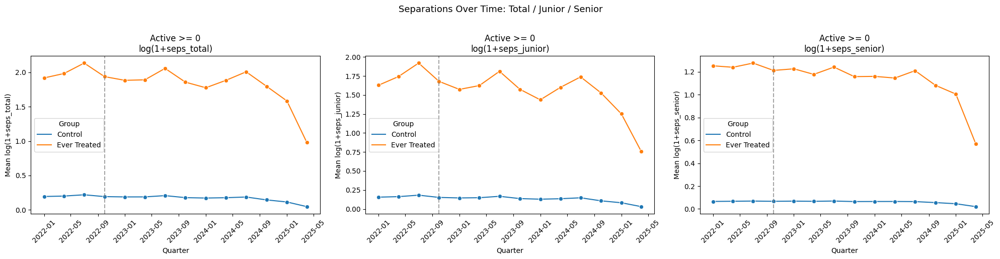

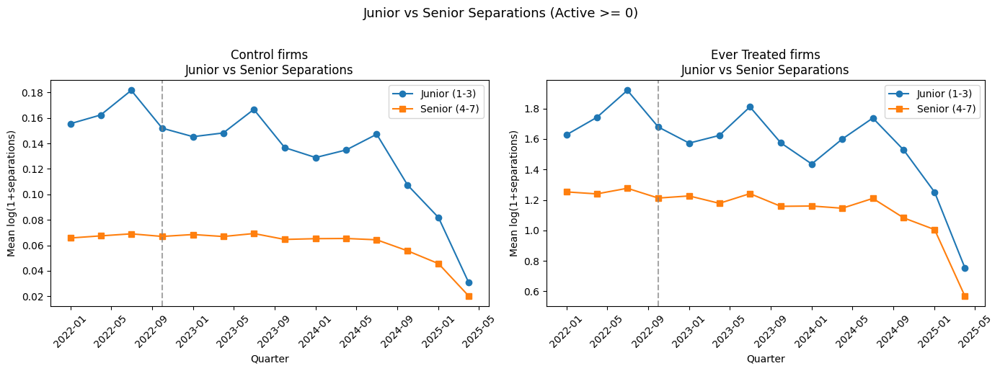

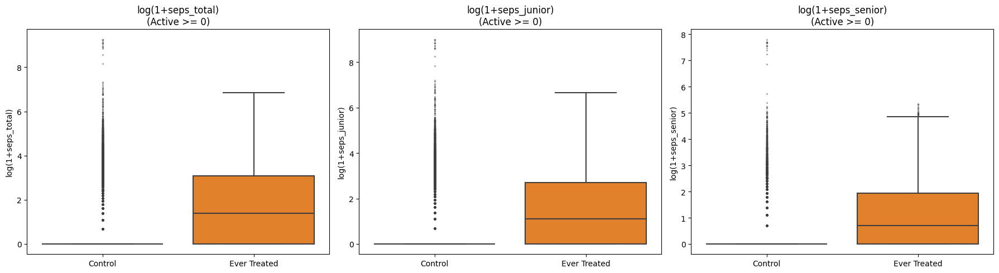

Saved: ../data/Positions/firm_quarter_separations_seniority_active_contained_ge0_chatgpt_treated.dta | Rows: 1,485,190

Building SEPARATIONS SENIORITY panel (Active >= 5)...


Separations seniority quarters: 100%|██████████| 14/14 [00:04<00:00,  3.46it/s]


  Firms: 28,043 | Treated: 269 | Control: 27,774

Quarterly averages — separations_total:
quarter    Treatment      mean  median  n_firms
 2022Q1      Control  2.571938     0.0    27774
 2022Q1 Ever Treated 36.267658     4.0      269
 2022Q2      Control  2.725859     0.0    27774
 2022Q2 Ever Treated 42.873606     5.0      269
 2022Q3      Control  3.039677     1.0    27774
 2022Q3 Ever Treated 49.806691     6.0      269
 2022Q4      Control  2.423094     0.0    27774
 2022Q4 Ever Treated 35.185874     5.0      269
 2023Q1      Control  2.308958     0.0    27774
 2023Q1 Ever Treated 29.843866     4.0      269
 2023Q2      Control  2.399006     0.0    27774
 2023Q2 Ever Treated 33.843866     4.0      269
 2023Q3      Control  2.717146     1.0    27774
 2023Q3 Ever Treated 41.613383     5.0      269
 2023Q4      Control  2.092821     0.0    27774
 2023Q4 Ever Treated 27.873606     4.0      269
 2024Q1      Control  1.969648     0.0    27774
 2024Q1 Ever Treated 23.899628     4.0      26

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

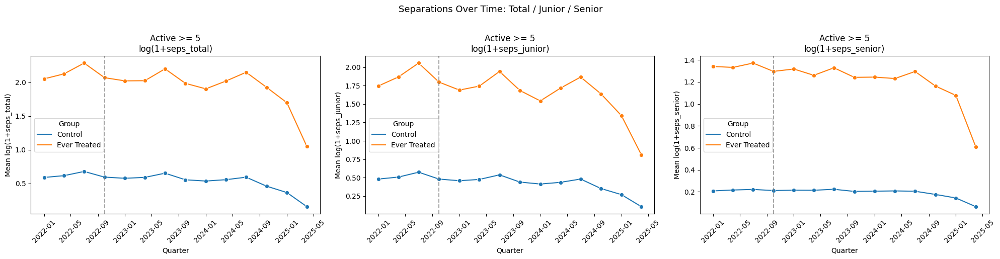

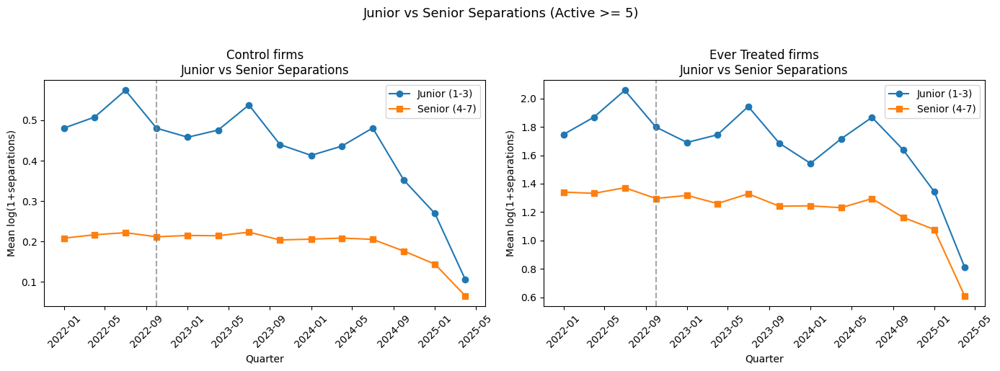

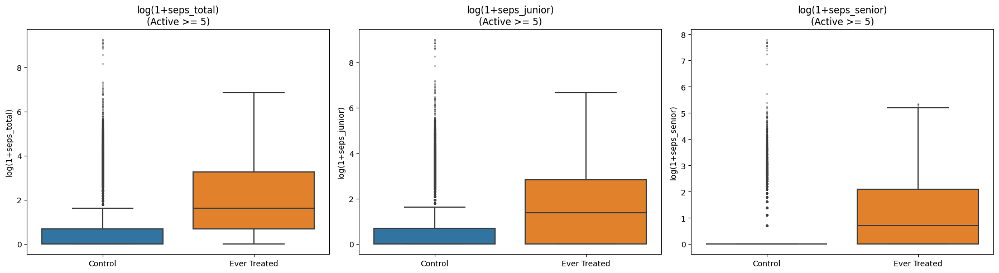

Saved: ../data/Positions/firm_quarter_separations_seniority_active_contained_ge5_chatgpt_treated.dta | Rows: 392,602

Building SEPARATIONS SENIORITY panel (Active >= 10)...


Separations seniority quarters: 100%|██████████| 14/14 [00:03<00:00,  4.46it/s]


  Firms: 16,758 | Treated: 248 | Control: 16,510

Quarterly averages — separations_total:
quarter    Treatment      mean  median  n_firms
 2022Q1      Control  4.079285     1.0    16510
 2022Q1 Ever Treated 39.322581     6.0      248
 2022Q2      Control  4.335373     1.0    16510
 2022Q2 Ever Treated 46.495968     6.0      248
 2022Q3      Control  4.838583     1.0    16510
 2022Q3 Ever Treated 54.000000     8.0      248
 2022Q4      Control  3.837553     1.0    16510
 2022Q4 Ever Treated 38.157258     5.5      248
 2023Q1      Control  3.654512     1.0    16510
 2023Q1 Ever Treated 32.334677     5.0      248
 2023Q2      Control  3.811024     1.0    16510
 2023Q2 Ever Treated 36.697581     5.0      248
 2023Q3      Control  4.320533     1.0    16510
 2023Q3 Ever Treated 45.129032     7.0      248
 2023Q4      Control  3.307511     1.0    16510
 2023Q4 Ever Treated 30.205645     5.0      248
 2024Q1      Control  3.108298     1.0    16510
 2024Q1 Ever Treated 25.903226     5.0      24

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

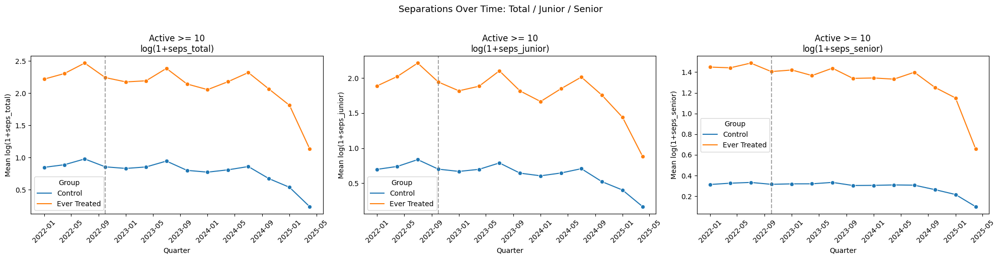

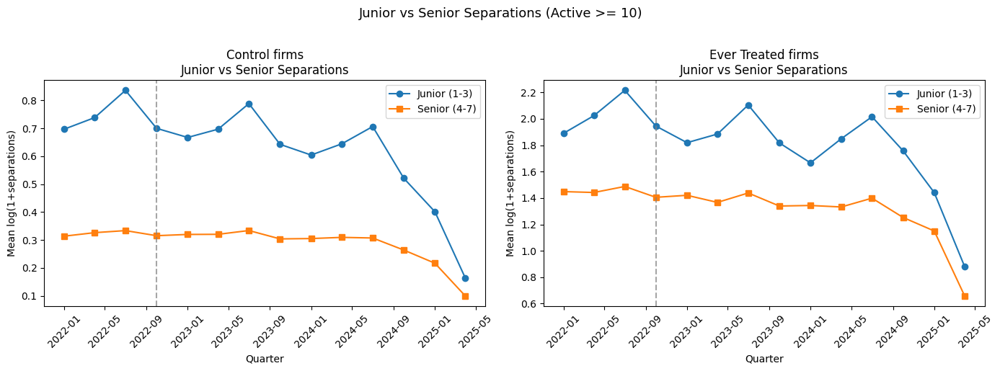

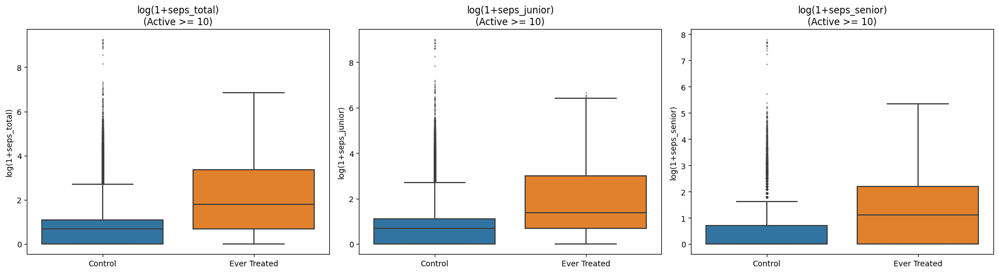

Saved: ../data/Positions/firm_quarter_separations_seniority_active_contained_ge10_chatgpt_treated.dta | Rows: 234,612

Building SEPARATIONS SENIORITY panel (Active >= 15)...


Separations seniority quarters: 100%|██████████| 14/14 [00:02<00:00,  5.03it/s]


  Firms: 12,090 | Treated: 235 | Control: 11,855

Quarterly averages — separations_total:
quarter    Treatment      mean  median  n_firms
 2022Q1      Control  5.420582     2.0    11855
 2022Q1 Ever Treated 41.463830     7.0      235
 2022Q2      Control  5.772923     2.0    11855
 2022Q2 Ever Treated 49.042553     8.0      235
 2022Q3      Control  6.426993     2.0    11855
 2022Q3 Ever Treated 56.948936    10.0      235
 2022Q4      Control  5.086630     2.0    11855
 2022Q4 Ever Treated 40.246809     7.0      235
 2023Q1      Control  4.849684     1.0    11855
 2023Q1 Ever Treated 34.106383     7.0      235
 2023Q2      Control  5.077098     2.0    11855
 2023Q2 Ever Treated 38.719149     6.0      235
 2023Q3      Control  5.752425     2.0    11855
 2023Q3 Ever Treated 47.604255     8.0      235
 2023Q4      Control  4.387853     1.0    11855
 2023Q4 Ever Treated 31.859574     7.0      235
 2024Q1      Control  4.122733     1.0    11855
 2024Q1 Ever Treated 27.302128     6.0      23

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

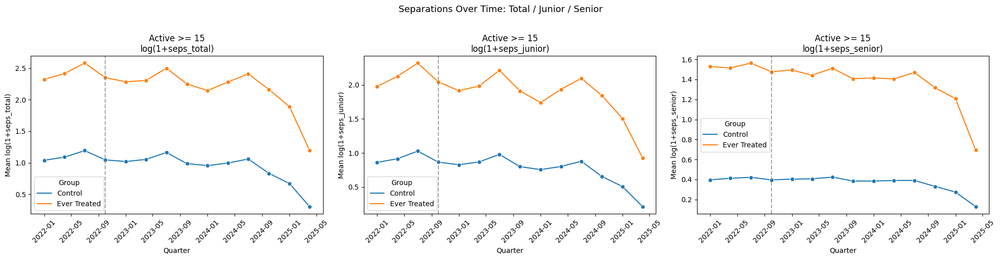

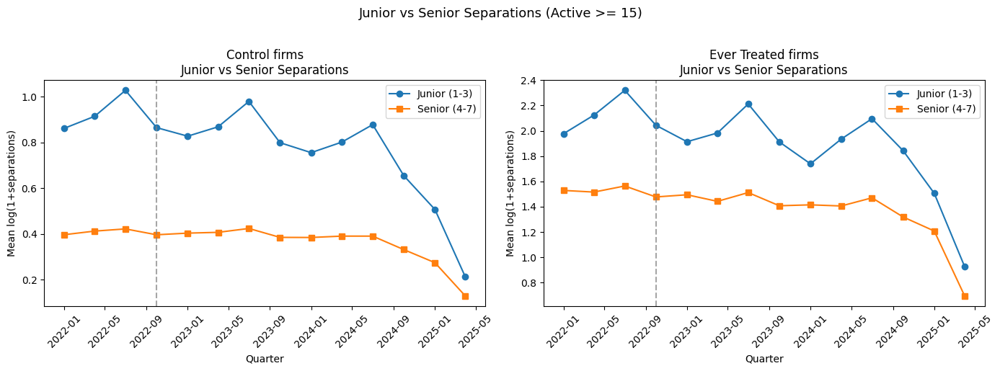

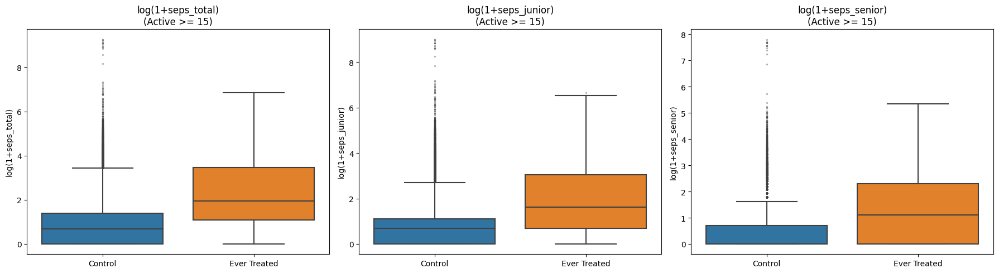

Saved: ../data/Positions/firm_quarter_separations_seniority_active_contained_ge15_chatgpt_treated.dta | Rows: 169,260

Building SEPARATIONS SENIORITY panel (Active >= 20)...


Separations seniority quarters: 100%|██████████| 14/14 [00:02<00:00,  5.09it/s]


  Firms: 9,346 | Treated: 224 | Control: 9,122

Quarterly averages — separations_total:
quarter    Treatment      mean  median  n_firms
 2022Q1      Control  6.756852     2.0     9122
 2022Q1 Ever Treated 43.482143     9.0      224
 2022Q2      Control  7.212892     2.0     9122
 2022Q2 Ever Treated 51.433036    10.0      224
 2022Q3      Control  8.013484     3.0     9122
 2022Q3 Ever Treated 59.709821    11.0      224
 2022Q4      Control  6.333918     2.0     9122
 2022Q4 Ever Treated 42.196429     9.0      224
 2023Q1      Control  6.040013     2.0     9122
 2023Q1 Ever Treated 35.758929     7.5      224
 2023Q2      Control  6.346635     2.0     9122
 2023Q2 Ever Treated 40.593750     7.0      224
 2023Q3      Control  7.174633     3.0     9122
 2023Q3 Ever Treated 49.861607    10.0      224
 2023Q4      Control  5.461193     2.0     9122
 2023Q4 Ever Treated 33.397321     7.0      224
 2024Q1      Control  5.135058     2.0     9122
 2024Q1 Ever Treated 28.638393     6.0      224


c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

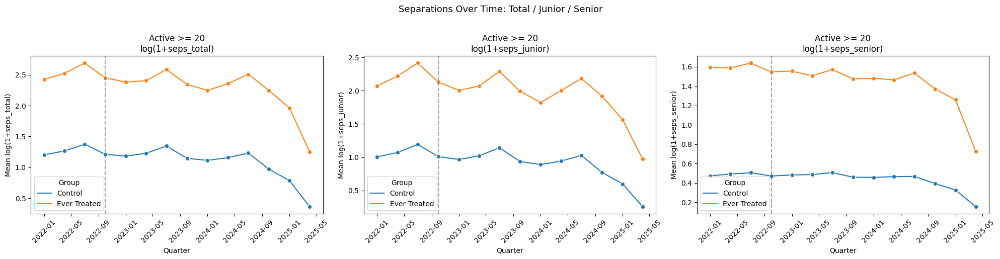

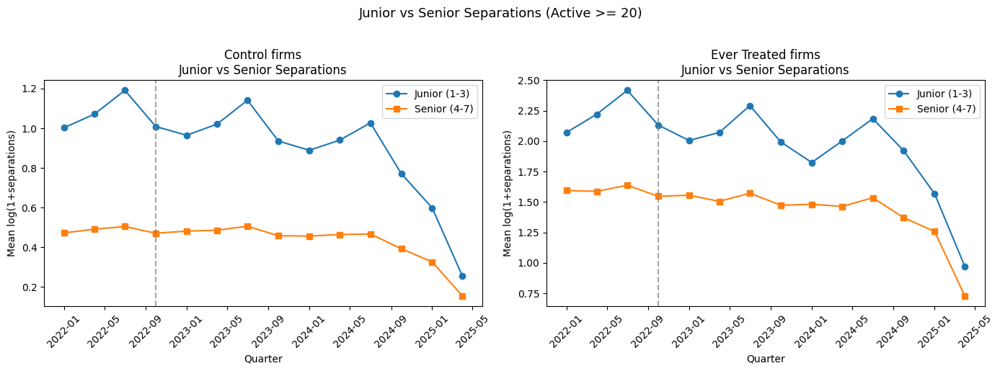

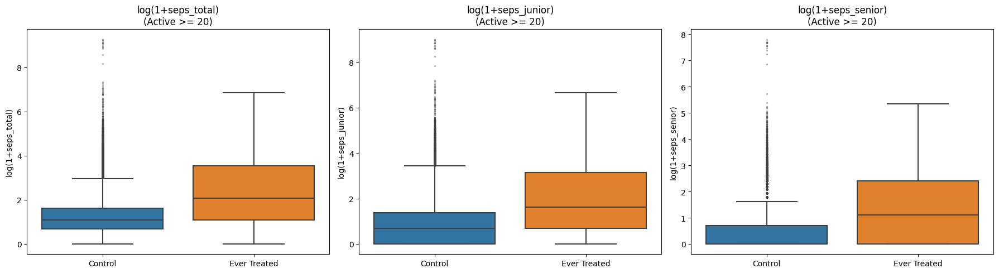

Saved: ../data/Positions/firm_quarter_separations_seniority_active_contained_ge20_chatgpt_treated.dta | Rows: 130,844


In [26]:
sep_seniority_results = {}

for thr in THRESHOLDS:
    active_firms = get_active_firms(clean_positions_with_next, HIRE_START, HIRE_END, thr)

    sep_sen_panel, _ = build_separations_panel_seniority(
        positions=clean_positions_with_next,
        treated_firms=treated_firms,
        active_firms=active_firms,
        panel_start_q=PANEL_START,
        panel_end_q=PANEL_END,
        treat_q=TREAT_Q,
        active_threshold=thr,
        out_path=f"{OUT_DIR}firm_quarter_separations_seniority_active_contained_ge{thr}_chatgpt_treated.dta",
        make_plots=True,
    )
    sep_seniority_results[thr] = sep_sen_panel

Understanding PROMOTIONS

In [30]:
def annotate_next_spell_for_promotions(positions: pd.DataFrame) -> pd.DataFrame:
    """
    Adds next_company_name, next_startdate, next_seniority for each spell, within user_id.
    Use on FULL cleaned positions (not restricted to active_firms).
    """
    df = positions.copy()
    df = df.sort_values(["user_id", "startdate", "enddate", "company_name"], kind="mergesort")

    df["next_company_name"] = df.groupby("user_id")["company_name"].shift(-1)
    df["next_startdate"]    = df.groupby("user_id")["startdate"].shift(-1)
    df["next_seniority"]    = df.groupby("user_id")["seniority"].shift(-1)

    return df

def build_firm_quarter_panel_from_events_simple(
    positions: pd.DataFrame,
    treated_firms: set,
    active_firms: set,
    panel_start_q: str,
    panel_end_q: str,
    treat_q: str,
    active_threshold: int,
    out_path: str,
    event_extractor,
    value_col: str,
    make_plots: bool = True,
    title: str = "",
) -> tuple:
    quarters = pd.period_range(panel_start_q, panel_end_q, freq="Q")
    stata_epoch = pd.Period("1960Q1", freq="Q")
    cutoff = pd.Period(treat_q, freq="Q").to_timestamp()

    pos = positions[positions["company_name"].isin(active_firms)].copy()

    print(f"\nBuilding {title} panel (Active >= {active_threshold})...")
    pieces = []
    for q in tqdm(quarters, desc=f"{title} quarters"):
        out = event_extractor(pos, q)
        out["quarter"] = q
        pieces.append(out)

    panel = pd.concat(pieces, ignore_index=True) if len(pieces) else pd.DataFrame(columns=["company_name", value_col, "quarter"])

    full = (
        pd.DataFrame({"company_name": sorted(active_firms)}).assign(_tmp=1)
        .merge(pd.DataFrame({"quarter": quarters}).assign(_tmp=1), on="_tmp")
        .drop(columns="_tmp")
    )
    panel = full.merge(panel, on=["company_name", "quarter"], how="left")
    panel[value_col] = panel[value_col].fillna(0).astype(int)

    panel["treated"]      = panel["company_name"].isin(treated_firms).astype(int)
    panel["Treatment"]    = panel["treated"].map({0: "Control", 1: "Ever Treated"})
    panel["post"]         = (panel["quarter"] >= pd.Period(treat_q, freq="Q")).astype(int)
    panel["quarter_date"] = panel["quarter"].dt.to_timestamp()
    panel["firm_id"]      = panel["company_name"].astype("category").cat.codes + 1
    panel["tq"]           = panel["quarter"].apply(lambda p: (p - stata_epoch).n).astype(int)

    log_col = f"log_{value_col}"
    panel[log_col] = np.log1p(panel[value_col])

    print(f"  Firms: {panel['company_name'].nunique():,} | Treated: {panel.loc[panel['treated']==1,'company_name'].nunique():,} | Control: {panel.loc[panel['treated']==0,'company_name'].nunique():,}")
    avg = panel.groupby(["quarter", "Treatment"])[value_col].agg(mean="mean", median="median", n_firms="count").reset_index()
    print(f"\nQuarterly averages — {value_col}:\n{avg.to_string(index=False)}")

    if make_plots:
        fig, ax = plt.subplots(1, 1, figsize=(10, 4))
        plot_data = panel.groupby(["quarter_date", "Treatment"])[log_col].mean().reset_index()
        sns.lineplot(data=plot_data, x="quarter_date", y=log_col, hue="Treatment", marker="o", ax=ax)
        ax.axvline(cutoff, linestyle="--", color="grey", alpha=0.7)
        ax.set_title(f"{title}: Mean log(1+{value_col}) (Active >= {active_threshold})")
        ax.set_xlabel("Quarter")
        ax.set_ylabel(f"Mean log(1+{value_col})")
        ax.tick_params(axis="x", rotation=45)
        plt.tight_layout()
        plt.savefig(f"{title.lower().replace(' ','_')}_line_thr{active_threshold}.png", dpi=150)
        plt.show()

    stata_df = panel[["firm_id", "company_name", "tq", value_col, log_col, "treated", "post"]].copy()
    for c, t in [("firm_id", int), ("tq", int), ("treated", int), ("post", int), (value_col, float), (log_col, float)]:
        stata_df[c] = stata_df[c].astype(t)

    pyreadstat.write_dta(stata_df, out_path, version=14)
    print(f"Saved: {out_path} | Rows: {len(stata_df):,}")

    return panel, stata_df

def promotions_j2s_event_extractor(pos_subset: pd.DataFrame, q: pd.Period) -> pd.DataFrame:
    """
    Counts unique users who get promoted from junior(1-3) to senior(4-7) within the same firm.
    Promotion is timestamped at next_startdate (start of senior spell).
    """
    q_start = q.start_time
    next_q_start = (q + 1).start_time

    # Need next_* columns present
    required = {"next_company_name", "next_startdate", "next_seniority"}
    missing = required - set(pos_subset.columns)
    if missing:
        raise ValueError(f"Missing columns for promotions: {missing}. Run annotate_next_spell_for_promotions() once.")

    df = pos_subset.copy()
    df = df[df["seniority"].between(1, 7) & df["next_seniority"].between(1, 7)].copy()

    is_junior_now = df["seniority"].between(1, 3)
    is_senior_next = df["next_seniority"].between(4, 7)
    same_firm = df["next_company_name"] == df["company_name"]
    has_next_start = df["next_startdate"].notna()

    promoted = df[is_junior_now & is_senior_next & same_firm & has_next_start].copy()

    # Promotion quarter is quarter of next_startdate (senior role begins)
    promoted_in_q = promoted[
        (promoted["next_startdate"] >= q_start) & (promoted["next_startdate"] < next_q_start)
    ]

    out = (
        promoted_in_q.groupby("company_name")["user_id"]
        .nunique()
        .reset_index()
        .rename(columns={"user_id": "promotions_j2s"})
    )
    return out

def build_promotions_panel_j2s_rate(
    positions: pd.DataFrame,
    treated_firms: set,
    active_firms: set,
    panel_start_q: str,
    panel_end_q: str,
    treat_q: str,
    active_threshold: int,
    out_path: str,
    make_plots: bool = True,
) -> tuple:
    quarters = pd.period_range(panel_start_q, panel_end_q, freq="Q")
    cutoff = pd.Period(treat_q, freq="Q").to_timestamp()
    stata_epoch = pd.Period("1960Q1", freq="Q")

    pos = positions[positions["company_name"].isin(active_firms)].copy()
    pos = pos[pos["seniority"].between(1, 7)].copy()
    pos["is_junior"] = pos["seniority"].between(1, 3).astype(int)

    if not {"next_company_name", "next_startdate", "next_seniority"}.issubset(pos.columns):
        raise ValueError("positions must include next_* columns. Run annotate_next_spell_for_promotions() once first.")

    print(f"\nBuilding PROMOTIONS J2S RATE panel (Active >= {active_threshold})...")
    rows = []
    for q in tqdm(quarters, desc="Promotions rate quarters"):
        q_start = q.start_time
        q_end = q.end_time
        next_q_start = (q + 1).start_time

        # Junior stock in quarter q (same stock logic as your stock panel)
        active = pos[(pos["startdate"] <= q_end) & (pos["enddate"].isna() | (pos["enddate"] >= q_start))]
        junior_stock = (
            active[active["is_junior"] == 1]
            .groupby("company_name")["user_id"]
            .nunique()
            .rename("junior_stock")
        )

        # Promotions in quarter q (timestamped at next_startdate)
        promo_df = promotions_j2s_event_extractor(pos, q).set_index("company_name")["promotions_j2s"]

        quarter_df = (
            pd.DataFrame(index=sorted(active_firms))
            .join(junior_stock, how="left")
            .join(promo_df, how="left")
            .fillna(0)
            .astype(int)
            .reset_index()
            .rename(columns={"index": "company_name"})
        )
        quarter_df["quarter"] = q
        rows.append(quarter_df)

    panel = pd.concat(rows, ignore_index=True)

    # Add treatment + ids + time
    panel["treated"]      = panel["company_name"].isin(treated_firms).astype(int)
    panel["Treatment"]    = panel["treated"].map({0: "Control", 1: "Ever Treated"})
    panel["post"]         = (panel["quarter"] >= pd.Period(treat_q, freq="Q")).astype(int)
    panel["quarter_date"] = panel["quarter"].dt.to_timestamp()
    panel["firm_id"]      = panel["company_name"].astype("category").cat.codes + 1
    panel["tq"]           = panel["quarter"].apply(lambda p: (p - stata_epoch).n).astype(int)

    # Lagged junior stock (denominator)
    panel = panel.sort_values(["company_name", "quarter"])
    panel["lag_junior_stock"] = panel.groupby("company_name")["junior_stock"].shift(1)

    # Promotion probability/rate: promotions / lagged junior stock
    panel["promo_rate_j2s"] = np.where(
        panel["lag_junior_stock"] > 0,
        panel["promotions_j2s"] / panel["lag_junior_stock"],
        np.nan
    )

    # Optional log transform (handy for event study)
    panel["log_promo_rate_j2s"] = np.log(panel["promo_rate_j2s"] + 1e-6)

    # Summaries
    print(f"  Firms: {panel['company_name'].nunique():,} | Treated: {panel.loc[panel['treated']==1,'company_name'].nunique():,} | Control: {panel.loc[panel['treated']==0,'company_name'].nunique():,}")
    avg = panel.groupby(["quarter", "Treatment"])["promo_rate_j2s"].agg(mean="mean", median="median", n_firms="count").reset_index()
    print("\nQuarterly averages — promo_rate_j2s:\n" + avg.to_string(index=False))

    if make_plots:
        fig, ax = plt.subplots(1, 1, figsize=(10, 4))
        plot_data = panel.groupby(["quarter_date", "Treatment"])["promo_rate_j2s"].mean().reset_index()
        sns.lineplot(data=plot_data, x="quarter_date", y="promo_rate_j2s", hue="Treatment", marker="o", ax=ax)
        ax.axvline(cutoff, linestyle="--", color="grey", alpha=0.7)
        ax.set_title(f"Mean Promotion Rate J2S (Active >= {active_threshold})")
        ax.set_xlabel("Quarter")
        ax.set_ylabel("Promotions / Lag Junior Stock")
        ax.tick_params(axis="x", rotation=45)
        plt.tight_layout()
        plt.savefig(f"promotions_j2s_rate_line_thr{active_threshold}.png", dpi=150)
        plt.show()

    # Save (include both count + rate so you can check accounting)
    out_cols = [
        "firm_id","company_name","tq","treated","post",
        "promotions_j2s","junior_stock","lag_junior_stock",
        "promo_rate_j2s","log_promo_rate_j2s"
    ]
    stata_df = panel[out_cols].copy()

    # types
    for c in ["firm_id","tq","treated","post"]:
        stata_df[c] = stata_df[c].astype(int)
    for c in ["promotions_j2s","junior_stock","lag_junior_stock","promo_rate_j2s","log_promo_rate_j2s"]:
        stata_df[c] = stata_df[c].astype(float)

    pyreadstat.write_dta(stata_df, out_path, version=14)
    print(f"Saved: {out_path} | Rows: {len(stata_df):,}")

    return panel, stata_df


Building PROMOTIONS J2S RATE panel (Active >= 0)...


Promotions rate quarters: 100%|██████████| 14/14 [00:36<00:00,  2.63s/it]


  Firms: 106,085 | Treated: 289 | Control: 105,796

Quarterly averages — promo_rate_j2s:
quarter    Treatment     mean  median  n_firms
 2022Q1      Control      NaN     NaN        0
 2022Q1 Ever Treated      NaN     NaN        0
 2022Q2      Control 0.004527     0.0    51595
 2022Q2 Ever Treated 0.007431     0.0      257
 2022Q3      Control 0.004188     0.0    53074
 2022Q3 Ever Treated 0.006254     0.0      260
 2022Q4      Control 0.002941     0.0    54332
 2022Q4 Ever Treated 0.004296     0.0      263
 2023Q1      Control 0.006040     0.0    54555
 2023Q1 Ever Treated 0.008082     0.0      264
 2023Q2      Control 0.003790     0.0    55946
 2023Q2 Ever Treated 0.006357     0.0      266
 2023Q3      Control 0.003694     0.0    56853
 2023Q3 Ever Treated 0.006703     0.0      267
 2023Q4      Control 0.002282     0.0    57804
 2023Q4 Ever Treated 0.002804     0.0      273
 2024Q1      Control 0.004742     0.0    57645
 2024Q1 Ever Treated 0.008815     0.0      276
 2024Q2      Contr

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

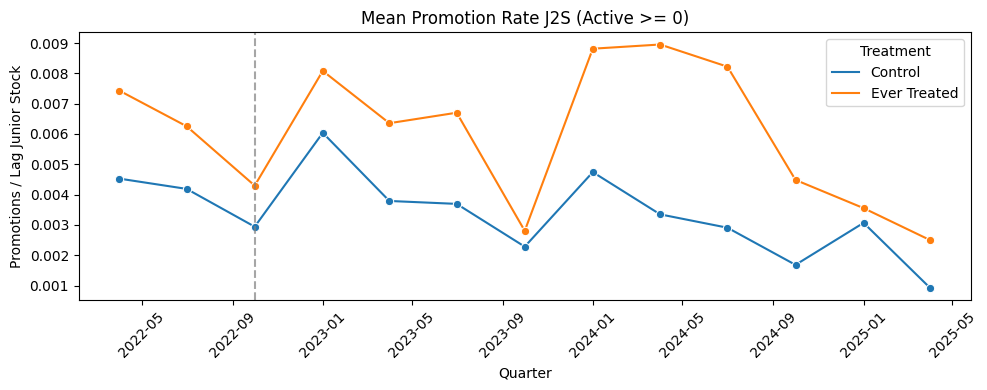

Saved: ../data/Positions/firm_quarter_promotions_j2s_rate_active_contained_ge0_chatgpt_treated.dta | Rows: 1,485,190

Building PROMOTIONS J2S RATE panel (Active >= 5)...


Promotions rate quarters: 100%|██████████| 14/14 [00:37<00:00,  2.65s/it]


  Firms: 28,043 | Treated: 269 | Control: 27,774

Quarterly averages — promo_rate_j2s:
quarter    Treatment     mean  median  n_firms
 2022Q1      Control      NaN     NaN        0
 2022Q1 Ever Treated      NaN     NaN        0
 2022Q2      Control 0.006320     0.0    23725
 2022Q2 Ever Treated 0.007670     0.0      249
 2022Q3      Control 0.005747     0.0    24262
 2022Q3 Ever Treated 0.006479     0.0      251
 2022Q4      Control 0.003803     0.0    24702
 2022Q4 Ever Treated 0.004466     0.0      253
 2023Q1      Control 0.008727     0.0    24861
 2023Q1 Ever Treated 0.008433     0.0      253
 2023Q2      Control 0.005703     0.0    25190
 2023Q2 Ever Treated 0.006631     0.0      255
 2023Q3      Control 0.005141     0.0    25488
 2023Q3 Ever Treated 0.006991     0.0      256
 2023Q4      Control 0.003265     0.0    25732
 2023Q4 Ever Treated 0.002944     0.0      260
 2024Q1      Control 0.006886     0.0    25728
 2024Q1 Ever Treated 0.009251     0.0      263
 2024Q2      Control

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

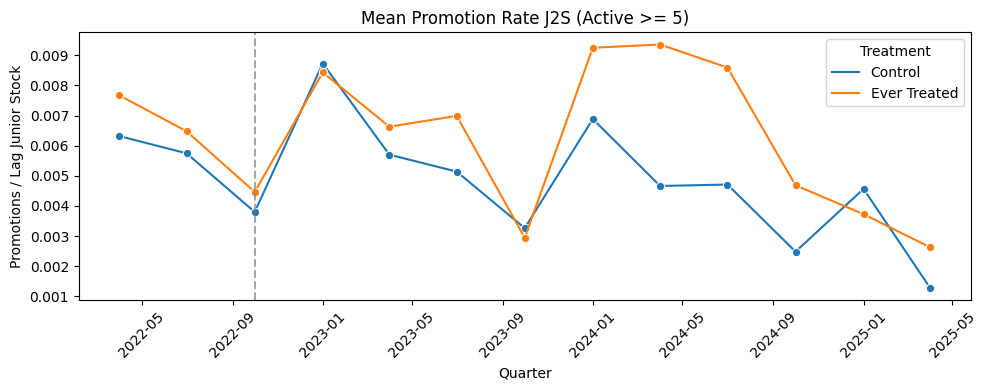

Saved: ../data/Positions/firm_quarter_promotions_j2s_rate_active_contained_ge5_chatgpt_treated.dta | Rows: 392,602

Building PROMOTIONS J2S RATE panel (Active >= 10)...


Promotions rate quarters: 100%|██████████| 14/14 [00:21<00:00,  1.56s/it]


  Firms: 16,758 | Treated: 248 | Control: 16,510

Quarterly averages — promo_rate_j2s:
quarter    Treatment     mean  median  n_firms
 2022Q1      Control      NaN     NaN        0
 2022Q1 Ever Treated      NaN     NaN        0
 2022Q2      Control 0.007212     0.0    15315
 2022Q2 Ever Treated 0.008058     0.0      237
 2022Q3      Control 0.006564     0.0    15536
 2022Q3 Ever Treated 0.006832     0.0      238
 2022Q4      Control 0.004113     0.0    15691
 2022Q4 Ever Treated 0.004727     0.0      239
 2023Q1      Control 0.010085     0.0    15785
 2023Q1 Ever Treated 0.008890     0.0      240
 2023Q2      Control 0.006929     0.0    15931
 2023Q2 Ever Treated 0.006470     0.0      242
 2023Q3      Control 0.006145     0.0    16026
 2023Q3 Ever Treated 0.007335     0.0      244
 2023Q4      Control 0.003740     0.0    16109
 2023Q4 Ever Treated 0.003112     0.0      246
 2024Q1      Control 0.008019     0.0    16121
 2024Q1 Ever Treated 0.009810     0.0      248
 2024Q2      Control

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

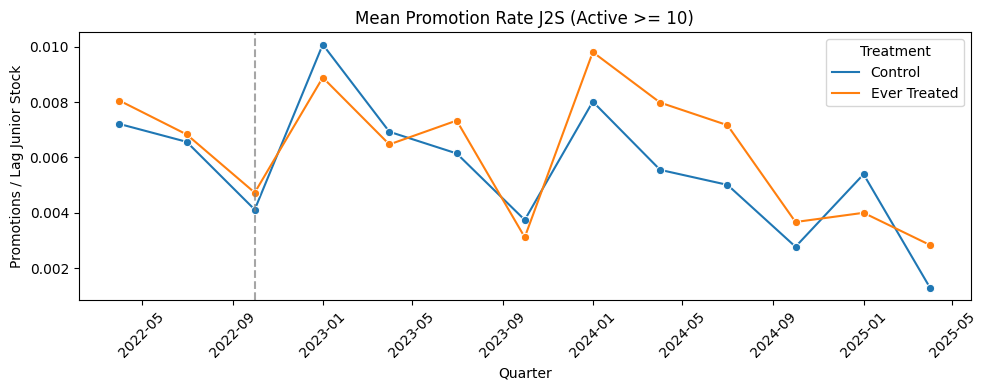

Saved: ../data/Positions/firm_quarter_promotions_j2s_rate_active_contained_ge10_chatgpt_treated.dta | Rows: 234,612

Building PROMOTIONS J2S RATE panel (Active >= 15)...


Promotions rate quarters: 100%|██████████| 14/14 [00:20<00:00,  1.47s/it]


  Firms: 12,090 | Treated: 235 | Control: 11,855

Quarterly averages — promo_rate_j2s:
quarter    Treatment     mean  median  n_firms
 2022Q1      Control      NaN     NaN        0
 2022Q1 Ever Treated      NaN     NaN        0
 2022Q2      Control 0.007454     0.0    11349
 2022Q2 Ever Treated 0.007218     0.0      225
 2022Q3      Control 0.007171     0.0    11452
 2022Q3 Ever Treated 0.007164     0.0      227
 2022Q4      Control 0.004302     0.0    11538
 2022Q4 Ever Treated 0.004977     0.0      227
 2023Q1      Control 0.010485     0.0    11574
 2023Q1 Ever Treated 0.009358     0.0      228
 2023Q2      Control 0.007294     0.0    11642
 2023Q2 Ever Treated 0.006808     0.0      230
 2023Q3      Control 0.006568     0.0    11689
 2023Q3 Ever Treated 0.007714     0.0      232
 2023Q4      Control 0.003707     0.0    11726
 2023Q4 Ever Treated 0.003271     0.0      234
 2024Q1      Control 0.008337     0.0    11730
 2024Q1 Ever Treated 0.010353     0.0      235
 2024Q2      Control

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

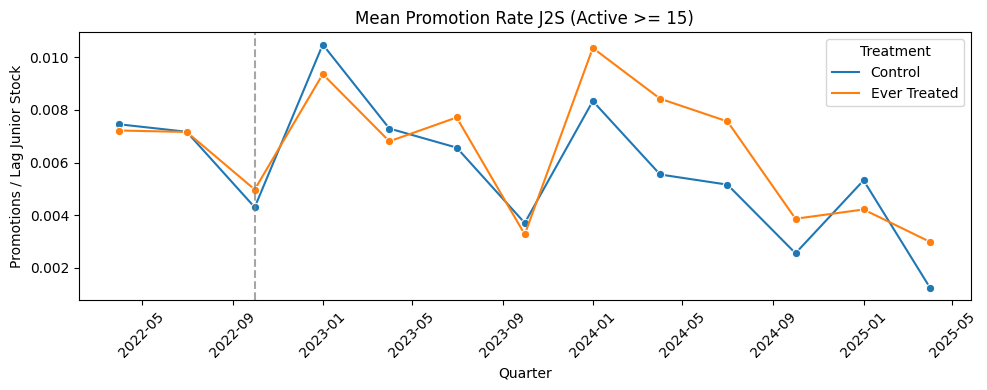

Saved: ../data/Positions/firm_quarter_promotions_j2s_rate_active_contained_ge15_chatgpt_treated.dta | Rows: 169,260

Building PROMOTIONS J2S RATE panel (Active >= 20)...


Promotions rate quarters: 100%|██████████| 14/14 [00:19<00:00,  1.43s/it]


  Firms: 9,346 | Treated: 224 | Control: 9,122

Quarterly averages — promo_rate_j2s:
quarter    Treatment     mean   median  n_firms
 2022Q1      Control      NaN      NaN        0
 2022Q1 Ever Treated      NaN      NaN        0
 2022Q2      Control 0.007752 0.000000     8855
 2022Q2 Ever Treated 0.007485 0.000000      217
 2022Q3      Control 0.007740 0.000000     8911
 2022Q3 Ever Treated 0.007425 0.000000      219
 2022Q4      Control 0.004527 0.000000     8960
 2022Q4 Ever Treated 0.005159 0.000000      219
 2023Q1      Control 0.010983 0.000000     8985
 2023Q1 Ever Treated 0.009698 0.001282      220
 2023Q2      Control 0.007318 0.000000     9024
 2023Q2 Ever Treated 0.006303 0.000000      222
 2023Q3      Control 0.007047 0.000000     9054
 2023Q3 Ever Treated 0.008061 0.000000      222
 2023Q4      Control 0.003864 0.000000     9070
 2023Q4 Ever Treated 0.003433 0.000000      223
 2024Q1      Control 0.008507 0.000000     9073
 2024Q1 Ever Treated 0.009522 0.000000      224
 20

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

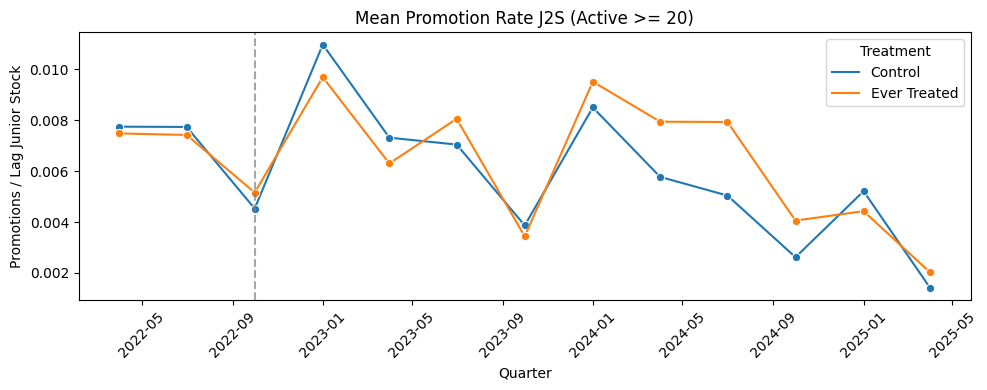

Saved: ../data/Positions/firm_quarter_promotions_j2s_rate_active_contained_ge20_chatgpt_treated.dta | Rows: 130,844


In [31]:
clean_positions_promos = annotate_next_spell_for_promotions(clean_positions)

promo_rate_results = {}

for thr in THRESHOLDS:
    active_firms = get_active_firms(clean_positions_promos, HIRE_START, HIRE_END, thr)

    promo_panel, _ = build_promotions_panel_j2s_rate(
        positions=clean_positions_promos,
        treated_firms=treated_firms,
        active_firms=active_firms,
        panel_start_q=PANEL_START,
        panel_end_q=PANEL_END,
        treat_q=TREAT_Q,
        active_threshold=thr,
        out_path=f"{OUT_DIR}firm_quarter_promotions_j2s_rate_active_contained_ge{thr}_chatgpt_treated.dta",
        make_plots=True,
    )
    promo_rate_results[thr] = promo_panel

Understanding THIRD DIMENSION OF FRESH GRADUATES

In [32]:
def build_flow_panel_freshgrad(
    positions: pd.DataFrame,
    treated_firms: set,
    active_firms: set,
    panel_start_q: str,
    panel_end_q: str,
    treat_q: str,
    active_threshold: int,
    out_path: str,
    make_plots: bool = True,
) -> tuple:
    quarters = pd.period_range(panel_start_q, panel_end_q, freq="Q")
    cutoff = pd.Period(treat_q, freq="Q").to_timestamp()
    stata_epoch = pd.Period("1960Q1", freq="Q")

    # Filter to active firms + relevant seniority groups (exclude 1)
    pos = positions[positions["company_name"].isin(active_firms)].copy()
    pos = pos[pos["seniority"].between(2, 7)].copy()
    pos["is_freshgrad"] = (pos["seniority"] == 2).astype(int)
    pos["is_experienced"] = pos["seniority"].between(3, 7).astype(int)

    print(f"\nBuilding FLOW FRESHGRAD panel (Active >= {active_threshold})...")
    flow_list = []
    for q in tqdm(quarters, desc="Flow freshgrad quarters"):
        q_start = q.start_time
        next_q_start = (q + 1).start_time

        started = pos[(pos["startdate"] >= q_start) & (pos["startdate"] < next_q_start)].copy()

        results = {}
        for label, mask in [
            ("new_hires_total", pd.Series(True, index=started.index)),
            ("new_hires_freshgrad", started["is_freshgrad"] == 1),
            ("new_hires_experienced", started["is_experienced"] == 1),
        ]:
            results[label] = (
                started[mask]
                .groupby("company_name")["user_id"]
                .nunique()
                .rename(label)
            )

        quarter_df = (
            pd.DataFrame(results["new_hires_total"])
            .join(results["new_hires_freshgrad"], how="left")
            .join(results["new_hires_experienced"], how="left")
            .fillna(0)
            .astype(int)
            .reset_index()
        )
        quarter_df["quarter"] = q
        flow_list.append(quarter_df)

    flow_panel = pd.concat(flow_list, ignore_index=True)

    # Balance
    full = (
        pd.DataFrame({"company_name": sorted(active_firms)}).assign(_tmp=1)
        .merge(pd.DataFrame({"quarter": quarters}).assign(_tmp=1), on="_tmp")
        .drop(columns="_tmp")
    )
    panel = full.merge(flow_panel, on=["company_name", "quarter"], how="left")
    for c in ["new_hires_total", "new_hires_freshgrad", "new_hires_experienced"]:
        panel[c] = panel[c].fillna(0).astype(int)

    # Treatment + derived columns
    panel["treated"]      = panel["company_name"].isin(treated_firms).astype(int)
    panel["Treatment"]    = panel["treated"].map({0: "Control", 1: "Ever Treated"})
    panel["post"]         = (panel["quarter"] >= pd.Period(treat_q, freq="Q")).astype(int)
    panel["quarter_date"] = panel["quarter"].dt.to_timestamp()
    panel["firm_id"]      = panel["company_name"].astype("category").cat.codes + 1
    panel["tq"]           = panel["quarter"].apply(lambda p: (p - stata_epoch).n).astype(int)

    for raw, log in [
        ("new_hires_total", "log_new_hires_total"),
        ("new_hires_freshgrad", "log_new_hires_freshgrad"),
        ("new_hires_experienced", "log_new_hires_experienced"),
    ]:
        panel[log] = np.log1p(panel[raw])

    # Summary
    print(f"  Firms: {panel['company_name'].nunique():,} | Treated: {panel.loc[panel['treated']==1,'company_name'].nunique():,} | Control: {panel.loc[panel['treated']==0,'company_name'].nunique():,}")
    for col in ["new_hires_total", "new_hires_freshgrad", "new_hires_experienced"]:
        avg = panel.groupby(["quarter", "Treatment"])[col].agg(mean="mean", median="median", n_firms="count").reset_index()
        print(f"\nQuarterly averages — {col}:\n{avg.to_string(index=False)}")

    # Optional plots (same style as your other panels)
    if make_plots:
        log_cols   = ["log_new_hires_total", "log_new_hires_freshgrad", "log_new_hires_experienced"]
        log_labels = ["log(1+hires_total)", "log(1+hires_freshgrad)", "log(1+hires_experienced)"]

        fig, axes = plt.subplots(1, 3, figsize=(20, 5))
        for ax, col, ylabel in zip(axes, log_cols, log_labels):
            plot_data = panel.groupby(["quarter_date", "Treatment"])[col].mean().reset_index()
            sns.lineplot(data=plot_data, x="quarter_date", y=col, hue="Treatment", marker="o", ax=ax)
            ax.axvline(cutoff, linestyle="--", color="grey", alpha=0.7)
            ax.set_title(f"Active >= {active_threshold}\n{ylabel}")
            ax.set_xlabel("Quarter")
            ax.set_ylabel(f"Mean {ylabel}")
            ax.tick_params(axis="x", rotation=45)
            ax.legend(title="Group")
        plt.suptitle("New Hires Over Time: Total / Fresh Grads / Experienced", fontsize=13, y=1.02)
        plt.tight_layout()
        plt.savefig(f"flow_freshgrad_line_thr{active_threshold}.png", dpi=150)
        plt.show()

    # Save
    out_cols = [
        "firm_id", "company_name", "tq", "treated", "post",
        "new_hires_total", "new_hires_freshgrad", "new_hires_experienced",
        "log_new_hires_total", "log_new_hires_freshgrad", "log_new_hires_experienced",
    ]
    stata_df = panel[out_cols].copy()
    for c, t in [("firm_id", int), ("tq", int), ("treated", int), ("post", int)]:
        stata_df[c] = stata_df[c].astype(t)
    for c in ["new_hires_total", "new_hires_freshgrad", "new_hires_experienced",
              "log_new_hires_total", "log_new_hires_freshgrad", "log_new_hires_experienced"]:
        stata_df[c] = stata_df[c].astype(float)

    pyreadstat.write_dta(stata_df, out_path, version=14)
    print(f"Saved: {out_path} | Rows: {len(stata_df):,}")
    return panel, stata_df


THRESHOLD: >= 0 hires
Active firms: 106,085

Building FLOW FRESHGRAD panel (Active >= 0)...


Flow freshgrad quarters: 100%|██████████| 14/14 [00:01<00:00,  8.18it/s]


  Firms: 106,085 | Treated: 289 | Control: 105,796

Quarterly averages — new_hires_total:
quarter    Treatment      mean  median  n_firms
 2022Q1      Control  0.849314     0.0   105796
 2022Q1 Ever Treated 53.896194     6.0      289
 2022Q2      Control  0.798953     0.0   105796
 2022Q2 Ever Treated 54.038062     6.0      289
 2022Q3      Control  0.837366     0.0   105796
 2022Q3 Ever Treated 57.823529     6.0      289
 2022Q4      Control  0.563717     0.0   105796
 2022Q4 Ever Treated 37.460208     5.0      289
 2023Q1      Control  0.759178     0.0   105796
 2023Q1 Ever Treated 43.910035     5.0      289
 2023Q2      Control  0.661339     0.0   105796
 2023Q2 Ever Treated 36.916955     4.0      289
 2023Q3      Control  0.662350     0.0   105796
 2023Q3 Ever Treated 41.256055     6.0      289
 2023Q4      Control  0.428097     0.0   105796
 2023Q4 Ever Treated 25.622837     3.0      289
 2024Q1      Control  0.599361     0.0   105796
 2024Q1 Ever Treated 33.425606     4.0      28

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

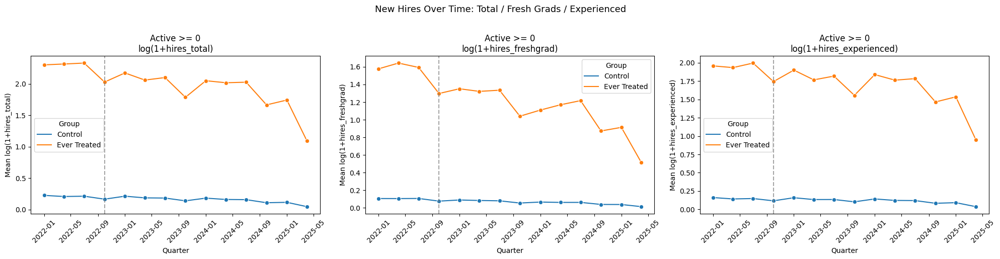

Saved: ../data/Positions/firm_quarter_flow_freshgrad_active_contained_ge0_chatgpt_treated.dta | Rows: 1,485,190

THRESHOLD: >= 5 hires
Active firms: 28,043

Building FLOW FRESHGRAD panel (Active >= 5)...


Flow freshgrad quarters: 100%|██████████| 14/14 [00:01<00:00,  9.19it/s]


  Firms: 28,043 | Treated: 269 | Control: 27,774

Quarterly averages — new_hires_total:
quarter    Treatment      mean  median  n_firms
 2022Q1      Control  2.954382     1.0    27774
 2022Q1 Ever Treated 57.899628     7.0      269
 2022Q2      Control  2.821128     1.0    27774
 2022Q2 Ever Treated 58.037175     8.0      269
 2022Q3      Control  2.967488     1.0    27774
 2022Q3 Ever Treated 62.104089     9.0      269
 2022Q4      Control  1.972996     0.0    27774
 2022Q4 Ever Treated 40.237918     6.0      269
 2023Q1      Control  2.630914     1.0    27774
 2023Q1 Ever Treated 47.171004     6.0      269
 2023Q2      Control  2.312378     0.0    27774
 2023Q2 Ever Treated 39.654275     5.0      269
 2023Q3      Control  2.318175     0.0    27774
 2023Q3 Ever Treated 44.304833     6.0      269
 2023Q4      Control  1.470152     0.0    27774
 2023Q4 Ever Treated 27.527881     4.0      269
 2024Q1      Control  2.057428     0.0    27774
 2024Q1 Ever Treated 35.903346     6.0      269


c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

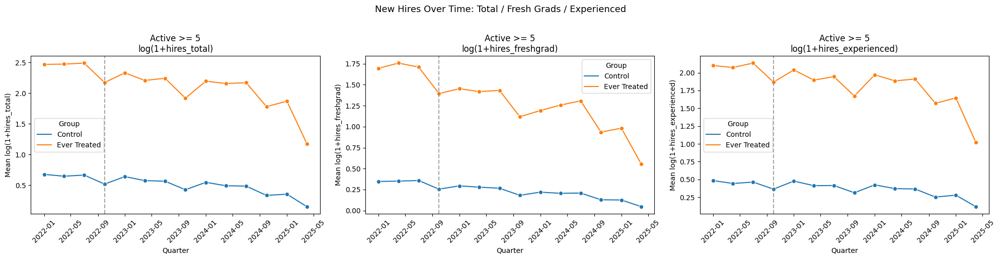

Saved: ../data/Positions/firm_quarter_flow_freshgrad_active_contained_ge5_chatgpt_treated.dta | Rows: 392,602

THRESHOLD: >= 10 hires
Active firms: 16,758

Building FLOW FRESHGRAD panel (Active >= 10)...


Flow freshgrad quarters: 100%|██████████| 14/14 [00:01<00:00, 10.22it/s]


  Firms: 16,758 | Treated: 248 | Control: 16,510

Quarterly averages — new_hires_total:
quarter    Treatment      mean  median  n_firms
 2022Q1      Control  4.689522     1.0    16510
 2022Q1 Ever Treated 62.782258     9.5      248
 2022Q2      Control  4.494852     1.0    16510
 2022Q2 Ever Treated 62.919355    10.0      248
 2022Q3      Control  4.738946     1.0    16510
 2022Q3 Ever Treated 67.338710    11.0      248
 2022Q4      Control  3.133555     1.0    16510
 2022Q4 Ever Treated 43.612903     7.0      248
 2023Q1      Control  4.168262     1.0    16510
 2023Q1 Ever Treated 51.137097     8.0      248
 2023Q2      Control  3.670503     1.0    16510
 2023Q2 Ever Treated 42.971774     6.0      248
 2023Q3      Control  3.691157     1.0    16510
 2023Q3 Ever Treated 48.028226     8.0      248
 2023Q4      Control  2.321381     1.0    16510
 2023Q4 Ever Treated 29.850806     5.0      248
 2024Q1      Control  3.242701     1.0    16510
 2024Q1 Ever Treated 38.899194     7.0      248


c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

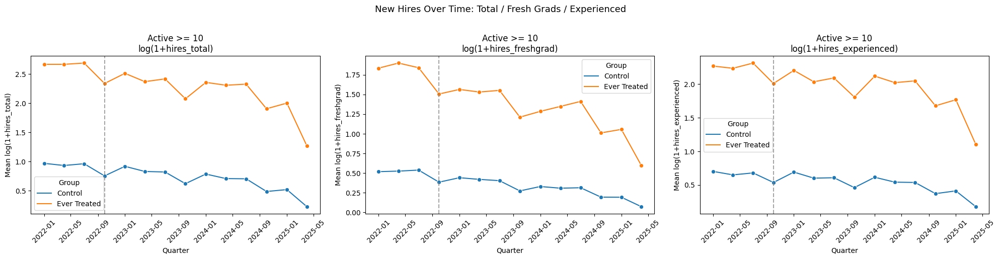

Saved: ../data/Positions/firm_quarter_flow_freshgrad_active_contained_ge10_chatgpt_treated.dta | Rows: 234,612

THRESHOLD: >= 15 hires
Active firms: 12,090

Building FLOW FRESHGRAD panel (Active >= 15)...


Flow freshgrad quarters: 100%|██████████| 14/14 [00:01<00:00, 11.29it/s]


  Firms: 12,090 | Treated: 235 | Control: 11,855

Quarterly averages — new_hires_total:
quarter    Treatment      mean  median  n_firms
 2022Q1      Control  6.233825     2.0    11855
 2022Q1 Ever Treated 66.221277    11.0      235
 2022Q2      Control  5.991396     2.0    11855
 2022Q2 Ever Treated 66.336170    12.0      235
 2022Q3      Control  6.322986     2.0    11855
 2022Q3 Ever Treated 71.034043    13.0      235
 2022Q4      Control  4.170308     1.0    11855
 2022Q4 Ever Treated 46.000000     9.0      235
 2023Q1      Control  5.527457     2.0    11855
 2023Q1 Ever Treated 53.919149    10.0      235
 2023Q2      Control  4.887305     1.0    11855
 2023Q2 Ever Treated 45.327660     8.0      235
 2023Q3      Control  4.912105     1.0    11855
 2023Q3 Ever Treated 50.659574     9.0      235
 2023Q4      Control  3.077014     1.0    11855
 2023Q4 Ever Treated 31.489362     6.0      235
 2024Q1      Control  4.292535     1.0    11855
 2024Q1 Ever Treated 41.017021     8.0      235


c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

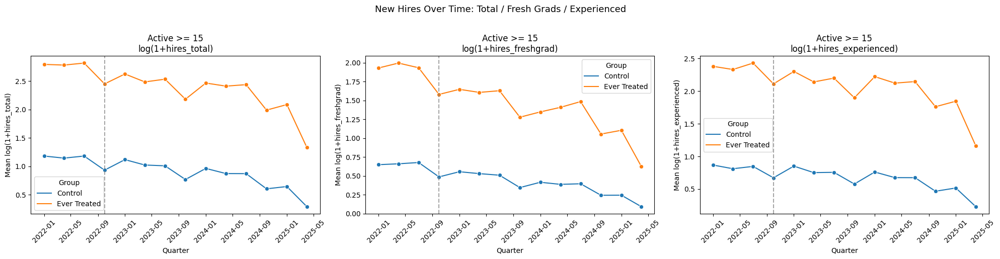

Saved: ../data/Positions/firm_quarter_flow_freshgrad_active_contained_ge15_chatgpt_treated.dta | Rows: 169,260

THRESHOLD: >= 20 hires
Active firms: 9,346

Building FLOW FRESHGRAD panel (Active >= 20)...


Flow freshgrad quarters: 100%|██████████| 14/14 [00:01<00:00, 11.55it/s]


  Firms: 9,346 | Treated: 224 | Control: 9,122

Quarterly averages — new_hires_total:
quarter    Treatment      mean  median  n_firms
 2022Q1      Control  7.781408     3.0     9122
 2022Q1 Ever Treated 69.419643    13.5      224
 2022Q2      Control  7.485858     2.0     9122
 2022Q2 Ever Treated 69.535714    14.0      224
 2022Q3      Control  7.903749     3.0     9122
 2022Q3 Ever Treated 74.477679    14.0      224
 2022Q4      Control  5.206534     2.0     9122
 2022Q4 Ever Treated 48.241071    10.0      224
 2023Q1      Control  6.890704     2.0     9122
 2023Q1 Ever Treated 56.535714    12.5      224
 2023Q2      Control  6.101842     2.0     9122
 2023Q2 Ever Treated 47.486607    10.0      224
 2023Q3      Control  6.139443     2.0     9122
 2023Q3 Ever Treated 53.102679    11.5      224
 2023Q4      Control  3.831725     1.0     9122
 2023Q4 Ever Treated 32.973214     6.0      224
 2024Q1      Control  5.325806     2.0     9122
 2024Q1 Ever Treated 42.959821     9.0      224
 2

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

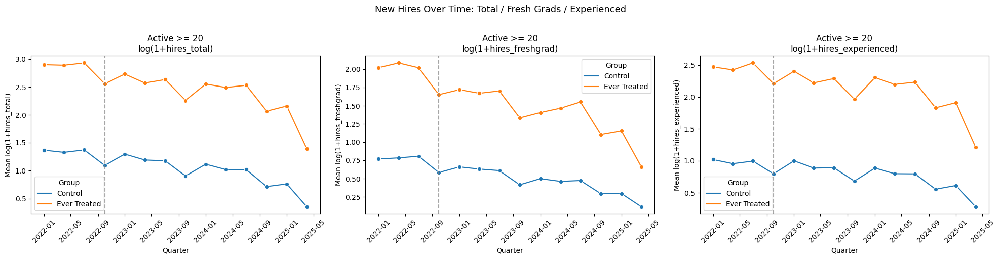

Saved: ../data/Positions/firm_quarter_flow_freshgrad_active_contained_ge20_chatgpt_treated.dta | Rows: 130,844


In [33]:
freshgrad_results = {}

for thr in THRESHOLDS:
    print(f"\n{'='*60}")
    print(f"THRESHOLD: >= {thr} hires")
    print(f"{'='*60}")

    active_firms = get_active_firms(clean_positions, HIRE_START, HIRE_END, thr)
    print(f"Active firms: {len(active_firms):,}")

    fg_panel, _ = build_flow_panel_freshgrad(
        positions=clean_positions,
        treated_firms=treated_firms,
        active_firms=active_firms,
        panel_start_q=PANEL_START,
        panel_end_q=PANEL_END,
        treat_q=TREAT_Q,
        active_threshold=thr,
        out_path=f"{OUT_DIR}firm_quarter_flow_freshgrad_active_contained_ge{thr}_chatgpt_treated.dta",
        make_plots=True,
    )

    freshgrad_results[thr] = fg_panel

Understanding HIGH vs. LOW GENAI EXPOSURE DIMENSION

In [35]:
import pandas as pd
import numpy as np
from tqdm import tqdm
import pyreadstat

def attach_occ_exposure(
    positions: pd.DataFrame,
    occ_exposure_path: str,
    positions_onet_col: str = "onet_code",
    exposure_onet_col: str = "O*NET-SOC Code",
    exposure_value_col: str = "human_beta_rating",  # <-- change to your actual column name in occ_level.csv
    drop_missing_exposure: bool = True,
) -> tuple[pd.DataFrame, float]:
    """
    Merge occupation-level exposure onto positions and create high_exposure based on median split.
    Returns (positions_with_exposure, median_value).
    """

    occ = pd.read_csv(occ_exposure_path)

    # Clean O*NET code formatting
    occ[exposure_onet_col] = occ[exposure_onet_col].astype(str).str.strip()
    positions = positions.copy()
    positions[positions_onet_col] = positions[positions_onet_col].astype(str).str.strip()

    # Ensure exposure numeric
    occ[exposure_value_col] = pd.to_numeric(occ[exposure_value_col], errors="coerce")

    # Merge
    merged = positions.merge(
        occ[[exposure_onet_col, exposure_value_col]].drop_duplicates(subset=[exposure_onet_col]),
        left_on=positions_onet_col,
        right_on=exposure_onet_col,
        how="left",
    )

    # Median split (over non-missing exposure)
    med = merged[exposure_value_col].median(skipna=True)

    merged["high_exposure"] = np.where(
        merged[exposure_value_col].notna(),
        (merged[exposure_value_col] > med).astype(int),
        np.nan
    )

    if drop_missing_exposure:
        before = len(merged)
        merged = merged.dropna(subset=["high_exposure"]).copy()
        merged["high_exposure"] = merged["high_exposure"].astype(int)
        print(f"Dropped missing exposure rows: {before - len(merged):,} | Remaining: {len(merged):,}")

    print(f"Exposure column used: {exposure_value_col} | Median: {med:.4f}")
    return merged, med

def make_balanced_firm_quarter(
    active_firms: set,
    quarters: pd.PeriodIndex
) -> pd.DataFrame:
    return (
        pd.DataFrame({"company_name": sorted(active_firms)}).assign(_tmp=1)
        .merge(pd.DataFrame({"quarter": quarters}).assign(_tmp=1), on="_tmp")
        .drop(columns="_tmp")
    )
    
def build_flow_panel_exposure_split(
    positions: pd.DataFrame,          # must already contain high_exposure
    treated_firms: set,
    active_firms: set,
    panel_start_q: str,
    panel_end_q: str,
    treat_q: str,
    active_threshold: int,
    out_path: str,
    make_plots: bool = False,
) -> tuple[pd.DataFrame, pd.DataFrame]:
    quarters = pd.period_range(panel_start_q, panel_end_q, freq="Q")
    stata_epoch = pd.Period("1960Q1", freq="Q")

    # restrict to active firms + only obs with exposure group defined
    pos = positions[positions["company_name"].isin(active_firms)].copy()
    pos = pos.dropna(subset=["high_exposure"]).copy()
    pos["high_exposure"] = pos["high_exposure"].astype(int)

    print(f"\nBuilding FLOW EXPOSURE panel (Active >= {active_threshold})...")
    out = []
    for q in tqdm(quarters, desc="Flow exposure quarters"):
        q_start = q.start_time
        next_q_start = (q + 1).start_time

        started = pos[(pos["startdate"] >= q_start) & (pos["startdate"] < next_q_start)].copy()

        # counts by firm for low/high exposure hires
        low = (
            started[started["high_exposure"] == 0]
            .groupby("company_name")["user_id"]
            .nunique()
            .rename("new_hires_lowexp")
        )
        high = (
            started[started["high_exposure"] == 1]
            .groupby("company_name")["user_id"]
            .nunique()
            .rename("new_hires_highexp")
        )

        qdf = pd.DataFrame(index=sorted(active_firms)).join(low, how="left").join(high, how="left").fillna(0).astype(int).reset_index()
        qdf = qdf.rename(columns={"index": "company_name"})
        qdf["quarter"] = q
        out.append(qdf)

    panel = pd.concat(out, ignore_index=True)

    # balance already ensured by indexing active_firms each quarter; but keep consistent:
    full = make_balanced_firm_quarter(active_firms, quarters)
    panel = full.merge(panel, on=["company_name", "quarter"], how="left")
    for c in ["new_hires_lowexp", "new_hires_highexp"]:
        panel[c] = panel[c].fillna(0).astype(int)

    # derived vars
    panel["treated"]      = panel["company_name"].isin(treated_firms).astype(int)
    panel["post"]         = (panel["quarter"] >= pd.Period(treat_q, freq="Q")).astype(int)
    panel["firm_id"]      = panel["company_name"].astype("category").cat.codes + 1
    panel["tq"]           = panel["quarter"].apply(lambda p: (p - stata_epoch).n).astype(int)

    panel["log_new_hires_lowexp"]  = np.log1p(panel["new_hires_lowexp"])
    panel["log_new_hires_highexp"] = np.log1p(panel["new_hires_highexp"])

    # Summary (average per firm-quarter)
    summ = panel.groupby("quarter")[["new_hires_lowexp", "new_hires_highexp"]].mean().reset_index()
    print("\nMean new hires per firm-quarter (overall):")
    print(summ.to_string(index=False))

    # Save to Stata
    out_cols = [
        "firm_id", "company_name", "tq", "treated", "post",
        "new_hires_lowexp", "new_hires_highexp",
        "log_new_hires_lowexp", "log_new_hires_highexp",
    ]
    stata_df = panel[out_cols].copy()
    for c in ["firm_id", "tq", "treated", "post"]:
        stata_df[c] = stata_df[c].astype(int)
    for c in ["new_hires_lowexp", "new_hires_highexp", "log_new_hires_lowexp", "log_new_hires_highexp"]:
        stata_df[c] = stata_df[c].astype(float)

    pyreadstat.write_dta(stata_df, out_path, version=14)
    print(f"Saved: {out_path} | Rows: {len(stata_df):,}")

    return panel, stata_df

In [37]:
OCC_EXPOSURE_PATH = r"C:\LocalOneDrive\Documents\Desktop\NUS\Y4S1\FYP\causal-impact-GenAI\data\AI Exposure Scores\occ_level.csv"

# 1) Attach exposure to the already-cleaned positions (after recruitment filter + contained clean)
clean_positions_exposure, exposure_median = attach_occ_exposure(
    positions=clean_positions,
    occ_exposure_path=OCC_EXPOSURE_PATH,
    positions_onet_col="onet_code",
    exposure_onet_col="O*NET-SOC Code",
    exposure_value_col="human_rating_beta",
    drop_missing_exposure=True,
)

# 2) Build panels by threshold (ge20 etc.)
exposure_flow_results = {}

for thr in THRESHOLDS:
    active_firms = get_active_firms(clean_positions_exposure, HIRE_START, HIRE_END, thr)
    print(f"\nThreshold {thr}: Active firms = {len(active_firms):,}")

    panel, _ = build_flow_panel_exposure_split(
        positions=clean_positions_exposure,
        treated_firms=treated_firms,
        active_firms=active_firms,
        panel_start_q=PANEL_START,
        panel_end_q=PANEL_END,
        treat_q=TREAT_Q,
        active_threshold=thr,
        out_path=f"{OUT_DIR}firm_quarter_flow_exposure_active_contained_ge{thr}_chatgpt_treated.dta",
        make_plots=False,
    )

    exposure_flow_results[thr] = panel

Dropped missing exposure rows: 13,992 | Remaining: 2,971,406
Exposure column used: human_rating_beta | Median: 0.4714

Threshold 0: Active firms = 105,854

Building FLOW EXPOSURE panel (Active >= 0)...


Flow exposure quarters: 100%|██████████| 14/14 [00:04<00:00,  3.35it/s]



Mean new hires per firm-quarter (overall):
quarter  new_hires_lowexp  new_hires_highexp
 2022Q1          0.702383           0.706275
 2022Q2          0.662120           0.698679
 2022Q3          0.711603           0.695902
 2022Q4          0.496089           0.454324
 2023Q1          0.613619           0.609982
 2023Q2          0.546791           0.557286
 2023Q3          0.574546           0.559733
 2023Q4          0.361932           0.347346
 2024Q1          0.480898           0.494370
 2024Q2          0.436365           0.462713
 2024Q3          0.432549           0.451518
 2024Q4          0.224328           0.243278
 2025Q1          0.236618           0.270703
 2025Q2          0.076010           0.092108
Saved: ../data/Positions/firm_quarter_flow_exposure_active_contained_ge0_chatgpt_treated.dta | Rows: 1,481,956

Threshold 5: Active firms = 27,993

Building FLOW EXPOSURE panel (Active >= 5)...


Flow exposure quarters: 100%|██████████| 14/14 [00:01<00:00,  7.10it/s]



Mean new hires per firm-quarter (overall):
quarter  new_hires_lowexp  new_hires_highexp
 2022Q1          2.470903           2.477048
 2022Q2          2.350302           2.483907
 2022Q3          2.534026           2.481728
 2022Q4          1.751152           1.600114
 2023Q1          2.153788           2.135784
 2023Q2          1.928804           1.962133
 2023Q3          2.034044           1.977994
 2023Q4          1.260922           1.207016
 2024Q1          1.680849           1.719716
 2024Q2          1.533633           1.617904
 2024Q3          1.532633           1.582574
 2024Q4          0.776873           0.836280
 2025Q1          0.827064           0.934627
 2025Q2          0.264959           0.316901
Saved: ../data/Positions/firm_quarter_flow_exposure_active_contained_ge5_chatgpt_treated.dta | Rows: 391,902

Threshold 10: Active firms = 16,727

Building FLOW EXPOSURE panel (Active >= 10)...


Flow exposure quarters: 100%|██████████| 14/14 [00:01<00:00,  8.70it/s]



Mean new hires per firm-quarter (overall):
quarter  new_hires_lowexp  new_hires_highexp
 2022Q1          3.946255           3.940336
 2022Q2          3.752675           3.972201
 2022Q3          4.052550           3.978717
 2022Q4          2.786333           2.551085
 2023Q1          3.431637           3.398458
 2023Q2          3.072637           3.119388
 2023Q3          3.255874           3.157530
 2023Q4          2.001614           1.914689
 2024Q1          2.666467           2.729061
 2024Q2          2.439230           2.565732
 2024Q3          2.443176           2.518563
 2024Q4          1.228911           1.318945
 2025Q1          1.320141           1.479823
 2025Q2          0.422491           0.503796
Saved: ../data/Positions/firm_quarter_flow_exposure_active_contained_ge10_chatgpt_treated.dta | Rows: 234,178

Threshold 15: Active firms = 12,064

Building FLOW EXPOSURE panel (Active >= 15)...


Flow exposure quarters: 100%|██████████| 14/14 [00:01<00:00,  8.91it/s]



Mean new hires per firm-quarter (overall):
quarter  new_hires_lowexp  new_hires_highexp
 2022Q1          5.269894           5.248011
 2022Q2          5.019065           5.300149
 2022Q3          5.421585           5.323607
 2022Q4          3.722895           3.404841
 2023Q1          4.569877           4.522381
 2023Q2          4.100050           4.158985
 2023Q3          4.354029           4.212533
 2023Q4          2.670507           2.541363
 2024Q1          3.553631           3.629476
 2024Q2          3.243369           3.409566
 2024Q3          3.264092           3.359914
 2024Q4          1.631548           1.747016
 2025Q1          1.762682           1.958637
 2025Q2          0.566064           0.671170
Saved: ../data/Positions/firm_quarter_flow_exposure_active_contained_ge15_chatgpt_treated.dta | Rows: 168,896

Threshold 20: Active firms = 9,328

Building FLOW EXPOSURE panel (Active >= 20)...


Flow exposure quarters: 100%|██████████| 14/14 [00:01<00:00, 10.85it/s]



Mean new hires per firm-quarter (overall):
quarter  new_hires_lowexp  new_hires_highexp
 2022Q1          6.594661           6.559498
 2022Q2          6.288057           6.617281
 2022Q3          6.796955           6.667346
 2022Q4          4.651158           4.261364
 2023Q1          5.710978           5.646655
 2023Q2          5.118675           5.193396
 2023Q3          5.449400           5.276372
 2023Q4          3.329867           3.168525
 2024Q1          4.421955           4.514580
 2024Q2          4.046848           4.251394
 2024Q3          4.082118           4.193611
 2024Q4          2.030768           2.182247
 2025Q1          2.203688           2.441038
 2025Q2          0.711943           0.837371
Saved: ../data/Positions/firm_quarter_flow_exposure_active_contained_ge20_chatgpt_treated.dta | Rows: 130,592


In [38]:
def build_separations_panel_exposure_split(
    positions: pd.DataFrame,          # must contain high_exposure
    treated_firms: set,
    active_firms: set,
    panel_start_q: str,
    panel_end_q: str,
    treat_q: str,
    active_threshold: int,
    out_path: str,
    make_plots: bool = False,
) -> tuple[pd.DataFrame, pd.DataFrame]:

    quarters = pd.period_range(panel_start_q, panel_end_q, freq="Q")
    stata_epoch = pd.Period("1960Q1", freq="Q")

    # Restrict to active firms + defined exposure
    pos = positions[positions["company_name"].isin(active_firms)].copy()
    pos = pos.dropna(subset=["high_exposure"]).copy()
    pos["high_exposure"] = pos["high_exposure"].astype(int)

    print(f"\nBuilding SEPARATIONS EXPOSURE panel (Active >= {active_threshold})...")

    sep_list = []

    for q in tqdm(quarters, desc="Separation exposure quarters"):
        q_start = q.start_time
        next_q_start = (q + 1).start_time

        ended = pos[
            (pos["enddate"].notna()) &
            (pos["enddate"] >= q_start) &
            (pos["enddate"] < next_q_start)
        ].copy()

        low = (
            ended[ended["high_exposure"] == 0]
            .groupby("company_name")["user_id"]
            .nunique()
            .rename("separations_lowexp")
        )

        high = (
            ended[ended["high_exposure"] == 1]
            .groupby("company_name")["user_id"]
            .nunique()
            .rename("separations_highexp")
        )

        qdf = (
            pd.DataFrame(index=sorted(active_firms))
            .join(low, how="left")
            .join(high, how="left")
            .fillna(0)
            .astype(int)
            .reset_index()
            .rename(columns={"index": "company_name"})
        )

        qdf["quarter"] = q
        sep_list.append(qdf)

    panel = pd.concat(sep_list, ignore_index=True)

    # Balance (same structure as other panels)
    full = (
        pd.DataFrame({"company_name": sorted(active_firms)}).assign(_tmp=1)
        .merge(pd.DataFrame({"quarter": quarters}).assign(_tmp=1), on="_tmp")
        .drop(columns="_tmp")
    )

    panel = full.merge(panel, on=["company_name", "quarter"], how="left")

    for c in ["separations_lowexp", "separations_highexp"]:
        panel[c] = panel[c].fillna(0).astype(int)

    # Derived columns
    panel["treated"] = panel["company_name"].isin(treated_firms).astype(int)
    panel["post"] = (panel["quarter"] >= pd.Period(treat_q, freq="Q")).astype(int)
    panel["firm_id"] = panel["company_name"].astype("category").cat.codes + 1
    panel["tq"] = panel["quarter"].apply(lambda p: (p - stata_epoch).n).astype(int)

    panel["log_separations_lowexp"] = np.log1p(panel["separations_lowexp"])
    panel["log_separations_highexp"] = np.log1p(panel["separations_highexp"])

    print("\nMean separations per firm-quarter:")
    print(panel.groupby("quarter")[["separations_lowexp","separations_highexp"]].mean().reset_index().to_string(index=False))

    # Save
    out_cols = [
        "firm_id","company_name","tq","treated","post",
        "separations_lowexp","separations_highexp",
        "log_separations_lowexp","log_separations_highexp"
    ]

    stata_df = panel[out_cols].copy()

    for c in ["firm_id","tq","treated","post"]:
        stata_df[c] = stata_df[c].astype(int)

    for c in [
        "separations_lowexp","separations_highexp",
        "log_separations_lowexp","log_separations_highexp"
    ]:
        stata_df[c] = stata_df[c].astype(float)

    pyreadstat.write_dta(stata_df, out_path, version=14)
    print(f"Saved: {out_path} | Rows: {len(stata_df):,}")

    return panel, stata_df

In [39]:
exposure_sep_results = {}

for thr in THRESHOLDS:
    active_firms = get_active_firms(clean_positions_exposure, HIRE_START, HIRE_END, thr)
    print(f"\nThreshold {thr}: Active firms = {len(active_firms):,}")

    sep_panel, _ = build_separations_panel_exposure_split(
        positions=clean_positions_exposure,
        treated_firms=treated_firms,
        active_firms=active_firms,
        panel_start_q=PANEL_START,
        panel_end_q=PANEL_END,
        treat_q=TREAT_Q,
        active_threshold=thr,
        out_path=f"{OUT_DIR}firm_quarter_separations_exposure_active_contained_ge{thr}_chatgpt_treated.dta",
        make_plots=False,
    )

    exposure_sep_results[thr] = sep_panel


Threshold 0: Active firms = 105,854

Building SEPARATIONS EXPOSURE panel (Active >= 0)...


Separation exposure quarters: 100%|██████████| 14/14 [00:04<00:00,  3.04it/s]



Mean separations per firm-quarter:
quarter  separations_lowexp  separations_highexp
 2022Q1            0.531487             0.550863
 2022Q2            0.550919             0.585949
 2022Q3            0.589529             0.637331
 2022Q4            0.505460             0.500548
 2023Q1            0.486821             0.480719
 2023Q2            0.488541             0.498970
 2023Q3            0.535294             0.544618
 2023Q4            0.432435             0.427683
 2024Q1            0.409281             0.413806
 2024Q2            0.424434             0.442364
 2024Q3            0.442147             0.468050
 2024Q4            0.307603             0.325382
 2025Q1            0.221012             0.244535
 2025Q2            0.070862             0.083842
Saved: ../data/Positions/firm_quarter_separations_exposure_active_contained_ge0_chatgpt_treated.dta | Rows: 1,481,956

Threshold 5: Active firms = 27,993

Building SEPARATIONS EXPOSURE panel (Active >= 5)...


Separation exposure quarters: 100%|██████████| 14/14 [00:02<00:00,  4.88it/s]



Mean separations per firm-quarter:
quarter  separations_lowexp  separations_highexp
 2022Q1            1.886329             1.948630
 2022Q2            1.963455             2.086129
 2022Q3            2.104562             2.275676
 2022Q4            1.795663             1.774979
 2023Q1            1.725967             1.703497
 2023Q2            1.745008             1.779302
 2023Q3            1.912442             1.949380
 2023Q4            1.533240             1.519166
 2024Q1            1.450398             1.466259
 2024Q2            1.511628             1.576108
 2024Q3            1.580467             1.670132
 2024Q4            1.095202             1.150359
 2025Q1            0.781660             0.862680
 2025Q2            0.252099             0.296431
Saved: ../data/Positions/firm_quarter_separations_exposure_active_contained_ge5_chatgpt_treated.dta | Rows: 391,902

Threshold 10: Active firms = 16,727

Building SEPARATIONS EXPOSURE panel (Active >= 10)...


Separation exposure quarters: 100%|██████████| 14/14 [00:02<00:00,  4.90it/s]



Mean separations per firm-quarter:
quarter  separations_lowexp  separations_highexp
 2022Q1            3.019908             3.113589
 2022Q2            3.143182             3.348718
 2022Q3            3.373767             3.649489
 2022Q4            2.863514             2.841095
 2023Q1            2.755425             2.718718
 2023Q2            2.793508             2.850481
 2023Q3            3.061577             3.122437
 2023Q4            2.444192             2.419442
 2024Q1            2.308663             2.334848
 2024Q2            2.418425             2.519101
 2024Q3            2.527411             2.665929
 2024Q4            1.744545             1.831889
 2025Q1            1.243558             1.370240
 2025Q2            0.404197             0.471453
Saved: ../data/Positions/firm_quarter_separations_exposure_active_contained_ge10_chatgpt_treated.dta | Rows: 234,178

Threshold 15: Active firms = 12,064

Building SEPARATIONS EXPOSURE panel (Active >= 15)...


Separation exposure quarters: 100%|██████████| 14/14 [00:02<00:00,  5.63it/s]



Mean separations per firm-quarter:
quarter  separations_lowexp  separations_highexp
 2022Q1            4.041777             4.156830
 2022Q2            4.218336             4.481184
 2022Q3            4.510527             4.877321
 2022Q4            3.823856             3.790865
 2023Q1            3.681781             3.625912
 2023Q2            3.740965             3.817225
 2023Q3            4.094164             4.180703
 2023Q4            3.260444             3.227039
 2024Q1            3.080653             3.111572
 2024Q2            3.227454             3.365302
 2024Q3            3.374751             3.556863
 2024Q4            2.328001             2.435345
 2025Q1            1.654592             1.820209
 2025Q2            0.540865             0.627487
Saved: ../data/Positions/firm_quarter_separations_exposure_active_contained_ge15_chatgpt_treated.dta | Rows: 168,896

Threshold 20: Active firms = 9,328

Building SEPARATIONS EXPOSURE panel (Active >= 20)...


Separation exposure quarters: 100%|██████████| 14/14 [00:02<00:00,  6.67it/s]



Mean separations per firm-quarter:
quarter  separations_lowexp  separations_highexp
 2022Q1            5.065823             5.203473
 2022Q2            5.295669             5.620390
 2022Q3            5.654588             6.104095
 2022Q4            4.784734             4.738529
 2023Q1            4.606132             4.531089
 2023Q2            4.696076             4.785270
 2023Q3            5.122213             5.238851
 2023Q4            4.070540             4.033877
 2024Q1            3.855489             3.884541
 2024Q2            4.039451             4.211085
 2024Q3            4.219661             4.449614
 2024Q4            2.902123             3.038057
 2025Q1            2.066467             2.257183
 2025Q2            0.676244             0.781625
Saved: ../data/Positions/firm_quarter_separations_exposure_active_contained_ge20_chatgpt_treated.dta | Rows: 130,592


# 3. Robustness Checks

Extended pre-trends panel (2019 - 2025Q2)

ROBUSTNESS CHECK 1: Extended pre-trend panel (2019Q1-2025Q2)

Rows loaded: 4,337,350
startdate range: 1950-01-01 to 2025-06-01
enddate min (non-null): 2019-01-01
Rows with startdate before 2022: 2,878,414
After dropping 9,205 recruitment firms: 4,251,161 rows
Ever-treated firms (GenAI integrator postings from 2022-11-30): 358
Active firms (>= 5 hires in 2019-2025): 36,783
Treated firms present in active firms: 276 / 358

Panel: 2019Q1-2025Q2 | Threshold: >= 5
Total firms: 36,783
Treated:     276
Control:     36,507

Quarterly averages (stock):
quarter    Treatment       mean  median  n_firms
 2019Q1      Control  30.657600     4.0    36507
 2019Q1 Ever Treated 555.315217    48.5      276
 2019Q2      Control  31.297395     4.0    36507
 2019Q2 Ever Treated 569.199275    55.0      276
 2019Q3      Control  32.108335     5.0    36507
 2019Q3 Ever Treated 589.445652    56.5      276
 2019Q4      Control  31.923741     5.0    36507
 2019Q4 Ever Treated 582.177536    57.0      276
 2020Q1  

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

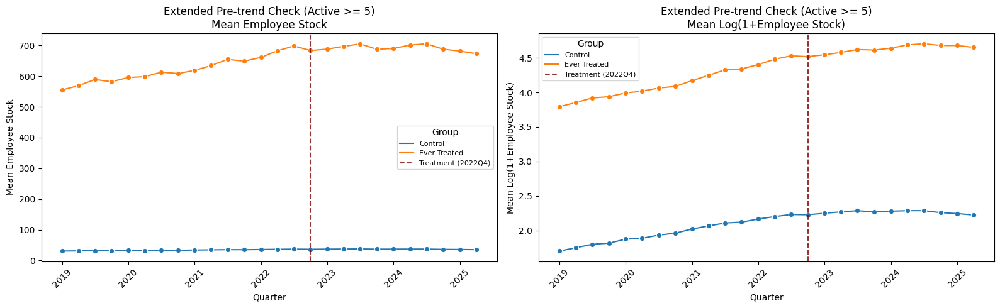


Saved: ../data/Positions/firm_quarter_stock_active_ge5_extended_2019_2025Q2.dta | Rows: 956,358
ROBUSTNESS CHECK 1: Extended pre-trend panel (2019Q1-2025Q2)

Rows loaded: 4,337,350
startdate range: 1950-01-01 to 2025-06-01
enddate min (non-null): 2019-01-01
Rows with startdate before 2022: 2,878,414
After dropping 9,205 recruitment firms: 4,251,161 rows
Ever-treated firms (GenAI integrator postings from 2022-11-30): 358
Active firms (>= 10 hires in 2019-2025): 22,553
Treated firms present in active firms: 257 / 358

Panel: 2019Q1-2025Q2 | Threshold: >= 10
Total firms: 22,553
Treated:     257
Control:     22,296

Quarterly averages (stock):
quarter    Treatment       mean  median  n_firms
 2019Q1      Control  48.123834     8.0    22296
 2019Q1 Ever Treated 595.836576    60.0      257
 2019Q2      Control  49.111859     8.0    22296
 2019Q2 Ever Treated 610.762646    63.0      257
 2019Q3      Control  50.387872     9.0    22296
 2019Q3 Ever Treated 632.540856    68.0      257
 2019Q4 

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

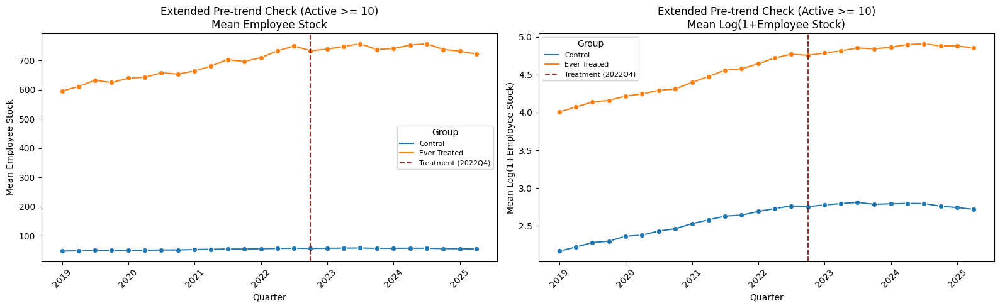


Saved: ../data/Positions/firm_quarter_stock_active_ge10_extended_2019_2025Q2.dta | Rows: 586,378
ROBUSTNESS CHECK 1: Extended pre-trend panel (2019Q1-2025Q2)

Rows loaded: 4,337,350
startdate range: 1950-01-01 to 2025-06-01
enddate min (non-null): 2019-01-01
Rows with startdate before 2022: 2,878,414
After dropping 9,205 recruitment firms: 4,251,161 rows
Ever-treated firms (GenAI integrator postings from 2022-11-30): 358
Active firms (>= 20 hires in 2019-2025): 13,140
Treated firms present in active firms: 236 / 358

Panel: 2019Q1-2025Q2 | Threshold: >= 20
Total firms: 13,140
Treated:     236
Control:     12,904

Quarterly averages (stock):
quarter    Treatment       mean  median  n_firms
 2019Q1      Control  78.618490    15.0    12904
 2019Q1 Ever Treated 648.605932    76.5      236
 2019Q2      Control  80.193816    16.0    12904
 2019Q2 Ever Treated 664.788136    75.5      236
 2019Q3      Control  82.255347    17.0    12904
 2019Q3 Ever Treated 688.470339    80.0      236
 2019Q4

c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\teomi\AppData\Local\Programs\Python\Python310\lib\site-p

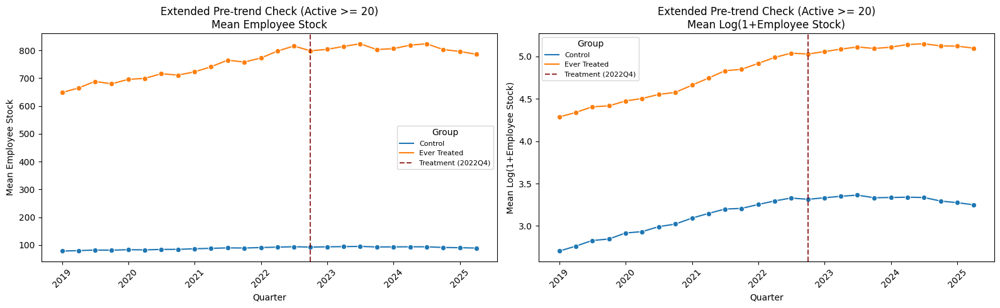


Saved: ../data/Positions/firm_quarter_stock_active_ge20_extended_2019_2025Q2.dta | Rows: 341,640


In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import subprocess, sys

try:
    import pyreadstat
except ImportError:
    subprocess.check_call([sys.executable, "-m", "pip", "install", "pyreadstat", "-q"])
    import pyreadstat


def build_stock_panel_extended_pretrend(
    positions_path=r"C:\LocalOneDrive\Documents\Desktop\NUS\Y4S1\FYP\causal-impact-GenAI\data\Positions\positions_stock_2019_onwards_robustness.csv",
    post1_path="../data/flagged_postings_gpt_predictions.csv",
    post2_path="../data/flagged_postings_gpt_predictions_2021Sep_Dec.csv",
    out_path_template="../data/Positions/firm_quarter_stock_active_ge{thr}_extended_2019_2025Q2.dta",
    active_threshold=5,
    hire_window_start="2019-01-01",   # extended to match new data
    hire_window_end="2025-07-01",
    treated_start="2022-11-30",
    treated_end="2025-07-01",
    panel_start_q="2019Q1",
    panel_end_q="2025Q2",
    treat_q="2022Q4",
    recruitment_industries=None,
    make_plots=True,
):
    """
    ROBUSTNESS CHECK 1: Extended pre-trend panel (2019Q1-2025Q2).
    Uses positions_stock_2019_onwards_robustness.csv which was queried
    with enddate >= 2019-01-01, giving accurate stock counts from 2019.
    """
    print("=" * 70)
    print("ROBUSTNESS CHECK 1: Extended pre-trend panel (2019Q1-2025Q2)")
    print("=" * 70)

    if recruitment_industries is None:
        recruitment_industries = [
            "Recruitment and Staffing Services",
            "Employment and Staffing Services",
            "Employment and Recruitment Services",
            "Human Resources and Recruitment Services",
            "Online Employment Platforms",
            "Human Resources and Workforce Solutions",
            "Business Process Outsourcing Services",
        ]

    quarters = pd.period_range(panel_start_q, panel_end_q, freq="Q")
    cutoff = pd.Period(treat_q, freq="Q").to_timestamp()
    stata_epoch = pd.Period("1960Q1", freq="Q")

    # --------------------------------------------------
    # 1) Load positions
    # --------------------------------------------------
    positions = pd.read_csv(positions_path)
    positions["startdate"] = pd.to_datetime(positions["startdate"], errors="coerce")
    positions["enddate"]   = pd.to_datetime(positions["enddate"],   errors="coerce")
    positions["company_name"] = positions["company_name"].astype(str).str.strip().str.lower()
    positions = positions.dropna(subset=["company_name", "startdate", "user_id"]).copy()

    print(f"\nRows loaded: {len(positions):,}")
    print(f"startdate range: {positions['startdate'].min().date()} to {positions['startdate'].max().date()}")
    print(f"enddate min (non-null): {positions['enddate'].dropna().min().date()}")
    print(f"Rows with startdate before 2022: {(positions['startdate'].dt.year < 2022).sum():,}")

    if "rics_k400" not in positions.columns:
        raise ValueError("Column 'rics_k400' not found.")

    # --------------------------------------------------
    # 2) Drop recruitment/HR intermediary firms
    # --------------------------------------------------
    bad_firms = positions.loc[positions["rics_k400"].isin(recruitment_industries), "company_name"].unique()
    positions = positions[~positions["company_name"].isin(bad_firms)].copy()
    print(f"After dropping {len(bad_firms):,} recruitment firms: {len(positions):,} rows")

    # --------------------------------------------------
    # 3) Ever-treated firms (ChatGPT launch onwards)
    # --------------------------------------------------
    post1 = pd.read_csv(post1_path)
    post2 = pd.read_csv(post2_path)
    postings_pred_df = pd.concat([post1, post2], ignore_index=True)
    postings_pred_df["post_date"] = pd.to_datetime(postings_pred_df["post_date"], errors="coerce")
    postings_pred_df["company"]   = postings_pred_df["company"].astype(str).str.strip().str.lower()
    postings_pred_df["is_integrator_gpt"] = pd.to_numeric(
        postings_pred_df["is_integrator_gpt"], errors="coerce"
    ).fillna(0).astype(int)

    treated_firms = set(
        postings_pred_df[
            (postings_pred_df["is_integrator_gpt"] == 1)
            & (postings_pred_df["post_date"] >= treated_start)
            & (postings_pred_df["post_date"] <  treated_end)
        ]["company"].unique()
    )
    print(f"Ever-treated firms (GenAI integrator postings from {treated_start}): {len(treated_firms):,}")

    # --------------------------------------------------
    # 4) Active firm filter (based on 2019-2025 hires)
    # --------------------------------------------------
    hire_start = pd.to_datetime(hire_window_start)
    hire_end   = pd.to_datetime(hire_window_end)

    firm_hires = (
        positions[(positions["startdate"] >= hire_start) & (positions["startdate"] < hire_end)]
        .groupby("company_name")["user_id"]
        .nunique()
        .reset_index(name="total_hires")
    )
    active_firms = set(firm_hires.loc[firm_hires["total_hires"] >= active_threshold, "company_name"])
    positions = positions[positions["company_name"].isin(active_firms)].copy()
    print(f"Active firms (>= {active_threshold} hires in 2019-2025): {len(active_firms):,}")

    overlap = active_firms & treated_firms
    print(f"Treated firms present in active firms: {len(overlap):,} / {len(treated_firms):,}")

    # --------------------------------------------------
    # 5) Build quarterly STOCK (2019Q1 onwards)
    #    Stock = unique user_ids whose tenure overlaps the quarter:
    #    startdate <= q_end AND (enddate IS NULL OR enddate >= q_start)
    # --------------------------------------------------
    stock_list = []
    for q in quarters:
        q_start = q.start_time
        q_end   = q.end_time

        active = positions[
            (positions["startdate"] <= q_end)
            & (positions["enddate"].isna() | (positions["enddate"] >= q_start))
        ]
        stock = (
            active.groupby("company_name")["user_id"]
            .nunique()
            .reset_index()
            .rename(columns={"user_id": "stock_employees"})
        )
        stock["quarter"] = q
        stock_list.append(stock)

    stock_panel = pd.concat(stock_list, ignore_index=True)

    # Balance: all firms x all quarters, zero-fill missing
    full = (
        pd.DataFrame({"company_name": sorted(active_firms)})
        .assign(_tmp=1)
        .merge(pd.DataFrame({"quarter": quarters}).assign(_tmp=1), on="_tmp")
        .drop(columns="_tmp")
    )
    stock_panel = full.merge(stock_panel, on=["company_name", "quarter"], how="left")
    stock_panel["stock_employees"] = stock_panel["stock_employees"].fillna(0).astype(int)

    # --------------------------------------------------
    # 6) Treatment + derived columns
    # --------------------------------------------------
    stock_panel["treated"]      = stock_panel["company_name"].isin(treated_firms).astype(int)
    stock_panel["Treatment"]    = stock_panel["treated"].map({0: "Control", 1: "Ever Treated"})
    stock_panel["quarter_date"] = stock_panel["quarter"].dt.to_timestamp()
    stock_panel["log_stock"]    = np.log1p(stock_panel["stock_employees"])
    stock_panel["firm_id"]      = stock_panel["company_name"].astype("category").cat.codes + 1
    stock_panel["tq"]           = stock_panel["quarter"].apply(lambda p: (p - stata_epoch).n).astype(int)

    # --------------------------------------------------
    # 7) Summary
    # --------------------------------------------------
    print(f"\n{'='*60}")
    print(f"Panel: {panel_start_q}-{panel_end_q} | Threshold: >= {active_threshold}")
    print(f"Total firms: {stock_panel['company_name'].nunique():,}")
    print(f"Treated:     {stock_panel.loc[stock_panel['treated']==1,'company_name'].nunique():,}")
    print(f"Control:     {stock_panel.loc[stock_panel['treated']==0,'company_name'].nunique():,}")

    quarterly_avg = (
        stock_panel.groupby(["quarter", "Treatment"])["stock_employees"]
        .agg(mean="mean", median="median", n_firms="count")
        .reset_index()
    )
    print("\nQuarterly averages (stock):")
    print(quarterly_avg.to_string(index=False))

    # --------------------------------------------------
    # 8) Plots
    # --------------------------------------------------
    if make_plots:
        fig, axes = plt.subplots(1, 2, figsize=(16, 5))

        for ax, col, ylabel in zip(
            axes,
            ["stock_employees", "log_stock"],
            ["Mean Employee Stock", "Mean Log(1+Employee Stock)"],
        ):
            plot_data = stock_panel.groupby(["quarter_date", "Treatment"])[col].mean().reset_index()
            sns.lineplot(data=plot_data, x="quarter_date", y=col, hue="Treatment", marker="o", ax=ax)
            ax.axvline(cutoff, linestyle="--", color="maroon", alpha=0.8, label="Treatment (2022Q4)")
            ax.set_title(f"Extended Pre-trend Check (Active >= {active_threshold})\n{ylabel}")
            ax.set_xlabel("Quarter")
            ax.set_ylabel(ylabel)
            ax.tick_params(axis="x", rotation=45)
            ax.legend(title="Group", fontsize=8)

        plt.tight_layout()
        plt.savefig(f"robustness_extended_pretrend_thr{active_threshold}.png", dpi=150, bbox_inches="tight")
        plt.show()

    # --------------------------------------------------
    # 9) Save to Stata
    # --------------------------------------------------
    stata_df = stock_panel[["firm_id", "company_name", "tq", "stock_employees", "log_stock", "treated"]].copy()
    for c, t in [("firm_id", int), ("tq", int), ("treated", int),
                 ("stock_employees", float), ("log_stock", float)]:
        stata_df[c] = stata_df[c].astype(t)

    out_path = out_path_template.format(thr=active_threshold)
    pyreadstat.write_dta(stata_df, out_path, version=14)
    print(f"\nSaved: {out_path} | Rows: {len(stata_df):,}")

    return stock_panel, stata_df


for thr in [5, 10, 15, 20]:
    build_stock_panel_extended_pretrend(active_threshold=thr, make_plots=True)

Assigning RANDOM firms to TREATED

ROBUSTNESS CHECK 2: Placebo random treatment (1.0% of firms)
Running 10 random seeds: [42, 43, 44, 45, 46, 47, 48, 49, 50, 51]

Active firms: 9,359 | Placebo treated per draw: 94
  Seed 42: placebo treated=94 | post-treat mean diff in log_stock = 0.0258 | Saved: ../data/Positions/firm_quarter_stock_active_ge20_placebo_seed42.dta
  Seed 43: placebo treated=94 | post-treat mean diff in log_stock = 0.0326 | Saved: ../data/Positions/firm_quarter_stock_active_ge20_placebo_seed43.dta
  Seed 44: placebo treated=94 | post-treat mean diff in log_stock = 0.0837 | Saved: ../data/Positions/firm_quarter_stock_active_ge20_placebo_seed44.dta
  Seed 45: placebo treated=94 | post-treat mean diff in log_stock = 0.2219 | Saved: ../data/Positions/firm_quarter_stock_active_ge20_placebo_seed45.dta
  Seed 46: placebo treated=94 | post-treat mean diff in log_stock = 0.0658 | Saved: ../data/Positions/firm_quarter_stock_active_ge20_placebo_seed46.dta
  Seed 47: placebo treated=94 | post-treat mean diff in log_s

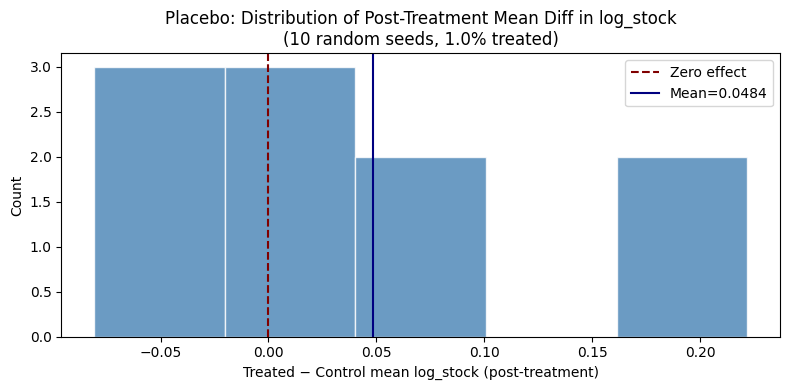


Placebo summary across 10 seeds:
  Mean effect:   0.0484
  Std dev:       0.0866
  Min / Max:     -0.0809 / 0.2219
  Share > 0:     70.00%


(                         company_name quarter  stock_employees quarter_date  \
 0       "k" line (singapore) pte ltd.  2022Q1               18   2022-01-01   
 1       "k" line (singapore) pte ltd.  2022Q2               20   2022-04-01   
 2       "k" line (singapore) pte ltd.  2022Q3               26   2022-07-01   
 3       "k" line (singapore) pte ltd.  2022Q4               32   2022-10-01   
 4       "k" line (singapore) pte ltd.  2023Q1               35   2023-01-01   
 ...                               ...     ...              ...          ...   
 131021                     ørsted a/s  2024Q2               45   2024-04-01   
 131022                     ørsted a/s  2024Q3               44   2024-07-01   
 131023                     ørsted a/s  2024Q4               40   2024-10-01   
 131024                     ørsted a/s  2025Q1               38   2025-01-01   
 131025                     ørsted a/s  2025Q2               37   2025-04-01   
 
         log_stock   tq  
 0        2.

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import subprocess, sys

try:
    import pyreadstat
except ImportError:
    subprocess.check_call([sys.executable, "-m", "pip", "install", "pyreadstat", "-q"])
    import pyreadstat


def build_stock_panel_placebo_treatment(
    positions_path=r"C:\LocalOneDrive\Documents\Desktop\NUS\Y4S1\FYP\causal-impact-GenAI\data\Positions\positions_stock.csv",
    out_path_template="../data/Positions/firm_quarter_stock_active_ge{thr}_placebo_seed{seed}.dta",
    active_threshold=5,
    hire_window_start="2021-01-01",
    hire_window_end="2025-07-01",
    panel_start_q="2022Q1",
    panel_end_q="2025Q2",
    treat_q="2022Q4",
    placebo_treatment_share=0.01,   # 1% of active firms randomly assigned as treated
    random_seed=42,
    n_simulations=10,               # run multiple seeds for stability check
    recruitment_industries=None,
    make_plots=True,
):
    """
    ROBUSTNESS CHECK 2: Placebo — random treatment assignment.

    Assigns placebo_treatment_share of firms randomly as 'treated'
    and runs the same panel construction. If your main result is
    real, the placebo should show flat/noisy coefficients with CIs
    crossing zero throughout. Run across multiple seeds to confirm
    this is not a lucky draw.
    """
    print("=" * 70)
    print(f"ROBUSTNESS CHECK 2: Placebo random treatment ({placebo_treatment_share*100:.1f}% of firms)")
    print(f"Running {n_simulations} random seeds: {list(range(random_seed, random_seed + n_simulations))}")
    print("=" * 70)

    if recruitment_industries is None:
        recruitment_industries = [
            "Recruitment and Staffing Services",
            "Employment and Staffing Services",
            "Employment and Recruitment Services",
            "Human Resources and Recruitment Services",
            "Online Employment Platforms",
            "Human Resources and Workforce Solutions",
            "Business Process Outsourcing Services",
        ]

    quarters = pd.period_range(panel_start_q, panel_end_q, freq="Q")
    cutoff = pd.Period(treat_q, freq="Q").to_timestamp()
    stata_epoch = pd.Period("1960Q1", freq="Q")

    # --------------------------------------------------
    # 1-4) Load, clean, filter — identical to baseline
    # --------------------------------------------------
    positions = pd.read_csv(positions_path)
    positions["startdate"] = pd.to_datetime(positions["startdate"], errors="coerce")
    positions["enddate"]   = pd.to_datetime(positions["enddate"],   errors="coerce")
    positions["company_name"] = positions["company_name"].astype(str).str.strip().str.lower()
    positions = positions.dropna(subset=["company_name", "startdate", "user_id"]).copy()

    if "rics_k400" not in positions.columns:
        raise ValueError("Column 'rics_k400' not found.")

    bad_firms = positions.loc[positions["rics_k400"].isin(recruitment_industries), "company_name"].unique()
    positions = positions[~positions["company_name"].isin(bad_firms)].copy()

    hire_start = pd.to_datetime(hire_window_start)
    hire_end   = pd.to_datetime(hire_window_end)
    firm_hires = (
        positions[(positions["startdate"] >= hire_start) & (positions["startdate"] < hire_end)]
        .groupby("company_name")["user_id"]
        .nunique()
        .reset_index(name="total_hires")
    )
    active_firms = sorted(firm_hires.loc[firm_hires["total_hires"] >= active_threshold, "company_name"].tolist())
    positions = positions[positions["company_name"].isin(active_firms)].copy()
    n_active = len(active_firms)
    n_placebo_treated = max(1, int(np.round(n_active * placebo_treatment_share)))
    print(f"\nActive firms: {n_active:,} | Placebo treated per draw: {n_placebo_treated:,}")

    # --------------------------------------------------
    # 5) Build stock panel once (treatment-agnostic)
    # --------------------------------------------------
    stock_list = []
    for q in quarters:
        q_start = q.start_time
        q_end   = q.end_time
        active = positions[
            (positions["startdate"] <= q_end)
            & (positions["enddate"].isna() | (positions["enddate"] >= q_start))
        ]
        stock = (
            active.groupby("company_name")["user_id"]
            .nunique()
            .reset_index()
            .rename(columns={"user_id": "stock_employees"})
        )
        stock["quarter"] = q
        stock_list.append(stock)

    stock_panel_base = pd.concat(stock_list, ignore_index=True)

    full = (
        pd.DataFrame({"company_name": active_firms})
        .assign(_tmp=1)
        .merge(pd.DataFrame({"quarter": quarters}).assign(_tmp=1), on="_tmp")
        .drop(columns="_tmp")
    )
    stock_panel_base = full.merge(stock_panel_base, on=["company_name", "quarter"], how="left")
    stock_panel_base["stock_employees"] = stock_panel_base["stock_employees"].fillna(0).astype(int)
    stock_panel_base["quarter_date"]    = stock_panel_base["quarter"].dt.to_timestamp()
    stock_panel_base["log_stock"]       = np.log1p(stock_panel_base["stock_employees"])
    stock_panel_base["tq"]              = stock_panel_base["quarter"].apply(lambda p: (p - stata_epoch).n).astype(int)

    # --------------------------------------------------
    # 6) Loop over seeds — assign random treatment, save each .dta
    # --------------------------------------------------
    all_seeds_mean_effects = {}

    for seed in range(random_seed, random_seed + n_simulations):
        rng = np.random.default_rng(seed)
        placebo_treated = set(rng.choice(active_firms, size=n_placebo_treated, replace=False))

        panel = stock_panel_base.copy()
        panel["treated"]   = panel["company_name"].isin(placebo_treated).astype(int)
        panel["Treatment"] = panel["treated"].map({0: "Control", 1: "Placebo Treated"})
        panel["firm_id"]   = panel["company_name"].astype("category").cat.codes + 1

        stata_df = panel[["firm_id", "company_name", "tq", "stock_employees", "log_stock", "treated"]].copy()
        for c, t in [("firm_id", int), ("tq", int), ("treated", int),
                     ("stock_employees", float), ("log_stock", float)]:
            stata_df[c] = stata_df[c].astype(t)

        out_path = out_path_template.format(thr=active_threshold, seed=seed)
        pyreadstat.write_dta(stata_df, out_path, version=14)

        # Track post-treatment mean log_stock difference for summary
        post_mask = panel["tq"] >= (pd.Period(treat_q, freq="Q") - stata_epoch).n
        mean_effect = (
            panel[post_mask].groupby("treated")["log_stock"].mean()
        )
        if 1 in mean_effect.index and 0 in mean_effect.index:
            all_seeds_mean_effects[seed] = mean_effect[1] - mean_effect[0]

        print(f"  Seed {seed}: placebo treated={n_placebo_treated} | "
              f"post-treat mean diff in log_stock = {all_seeds_mean_effects.get(seed, float('nan')):.4f} | "
              f"Saved: {out_path}")

    # --------------------------------------------------
    # 7) Summary plot: distribution of placebo mean effects
    # --------------------------------------------------
    if make_plots and len(all_seeds_mean_effects) > 1:
        effects = list(all_seeds_mean_effects.values())
        fig, ax = plt.subplots(figsize=(8, 4))
        ax.hist(effects, bins=max(5, n_simulations // 2), color="steelblue", edgecolor="white", alpha=0.8)
        ax.axvline(0, linestyle="--", color="maroon", linewidth=1.5, label="Zero effect")
        ax.axvline(np.mean(effects), linestyle="-", color="navy", linewidth=1.5,
                   label=f"Mean={np.mean(effects):.4f}")
        ax.set_title(f"Placebo: Distribution of Post-Treatment Mean Diff in log_stock\n"
                     f"({n_simulations} random seeds, {placebo_treatment_share*100:.1f}% treated)")
        ax.set_xlabel("Treated − Control mean log_stock (post-treatment)")
        ax.set_ylabel("Count")
        ax.legend()
        plt.tight_layout()
        plt.savefig(f"robustness_placebo_dist_thr{active_threshold}.png", dpi=150)
        plt.show()

        print(f"\nPlacebo summary across {n_simulations} seeds:")
        print(f"  Mean effect:   {np.mean(effects):.4f}")
        print(f"  Std dev:       {np.std(effects):.4f}")
        print(f"  Min / Max:     {np.min(effects):.4f} / {np.max(effects):.4f}")
        print(f"  Share > 0:     {np.mean([e > 0 for e in effects]):.2%}")

    return stock_panel_base, all_seeds_mean_effects


build_stock_panel_placebo_treatment(active_threshold=20, n_simulations=10, make_plots=True)